In [1]:
from netCDF4 import Dataset
import numpy as np
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score,mean_squared_error
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pylab import *
from joblib import dump, load
from sklearn.linear_model import LinearRegression
import pickle
import xarray as xr
import pdb

In [2]:
# calc qsat (T) in Kelvin
def qsat(TK,psurf):
    es=610.78*np.exp(17.27*(TK-273.15)/(TK-35.85))
    qsat=0.62*es/(psurf-es)
    return(qsat)

def ML_model_predict(Xvals):
    Xvals_sc=NN_scaler.transform(Xvals)
    nn=NN_model.predict(Xvals_sc) # nnm
    return(nn)

In [3]:
def prepare_data(tmsl):
    print ("Reading data")
    lh_ds = Dataset('LHF_area.nc')
    sst_ds = Dataset('SST_area.nc')
    ps_ds = Dataset('PSFC_area.nc')
    q0_ds = Dataset('spec_humidity_area_SFC.nc')
    t2_ds = Dataset('T2_area.nc')
    u10_ds = Dataset('U10_area.nc')
    v10_ds = Dataset('V10_area.nc')

    lh=np.array(lh_ds.variables["slhf"])[tmsl,:,:].flatten()*-1/3600
    sst=np.array(sst_ds.variables["sst"])[tmsl,:,:].flatten() 
    ps=np.array(ps_ds.variables['sp'])[tmsl,:,:].flatten() 
    q0=np.array(q0_ds.variables["q"])[tmsl,0,:,:].flatten()
    t2=np.array(t2_ds.variables["t2m"])[tmsl,:,:].flatten()
    u10=np.array(u10_ds.variables["u10"])[tmsl,:,:].flatten()
    v10=np.array(v10_ds.variables["v10"])[tmsl,:,:].flatten()

    del(lh_ds);del(sst_ds);del(ps_ds);del(q0_ds);del(t2_ds);del(u10_ds);del(v10_ds)
    print("convert to dq")
    # convert SST to qsat
    sstc=sst-273.15
    es=610.78*np.exp(17.27*sstc/(sstc+237.3))
    rs=0.62*es/(ps-es)
    dq=rs-q0
    # Speed
    uv=np.sqrt(u10**2+v10**2)
    # delta T gradient
    dT=t2-sst

    #To pandas DataFrame
    X_q0_dt=pd.DataFrame({'v': uv,'dq':dq,'dt':dT})
    X=X_q0_dt
    y=pd.DataFrame({'lh':lh})
    return(X,y)

In [4]:
def ML_model_train(X,y,scaler_name,model_name):
    X_train, X_test, y_train, y_test = train_test_split(X, y,random_state=1, test_size=0.2)

    # Fit the network
    scaler = StandardScaler()

    # Do manual scaling as I need to know this for later.
    xs=scaler.fit(X_train)
    X_trainscaled=scaler.transform(X_train)
    X_testscaled=scaler.transform(X_test)

    dump(xs, scaler_name) 
    
    # number of neurons 
    #nn=256
    #reg2=MLPRegressor(hidden_layer_sizes=(nn,nn,nn,nn),activation="relu")
    #reg2.fit(X_trainscaled, y_train)

    #Random Forest
    reg2 = RandomForestRegressor()
    reg2.fit(X_trainscaled, y_train)
    
    #Test it
    y_NN=reg2.predict(X_testscaled)
    r2skill=r2_score(y_test, y_NN)
    bias=np.mean(y_NN)-np.mean(y_test)
    rmse=np.sqrt(mean_squared_error(y_test, y_NN))
    print("r2",r2skill,"bias",bias,"RMSE", rmse)
    # joblib save
    dump(reg2,model_name)
    return(X_test,y_test,y_NN)

In [5]:
def plot_stats(X_test,y_test,y_NN):
    npnt=2000
    var='v'
    ymax=200

    fig,ax=plt.subplots(ncols=2,nrows=2,squeeze=False,)

    var='v'
    i,j=0,0
    ax[i,j].scatter(X_test[var][0:npnt],y_test[0:npnt],s=8,alpha=0.5,label="M-O")
    ax[i,j].scatter(X_test[var][0:npnt],y_NN[0:npnt],s=5,alpha=0.5,label="NN")
    ax[i,j].set_xlabel("$Speed_{10}$ (m s$^{-1}$)")
    ax[i,j].set_ylim([0,ymax])
    ax[i,j].legend()
    ax[i,j].set_xlim([0,10])
    ax[i,j].set_xticks(np.arange(0,12,2))
    ax[i,j].set_ylabel("Latent Flux (W m$^{-2}$)")

    var='dq'
    i,j=0,1
    ax[i,j].scatter(1000*X_test[var][0:npnt],y_test[0:npnt],s=8,alpha=0.3,label="M-O")
    ax[i,j].scatter(1000*X_test[var][0:npnt],y_NN[0:npnt],s=5,alpha=0.3,label="NN")
    ax[i,j].legend()
    ax[i,j].set_ylim([0,ymax])
    ax[i,j].set_xlabel("$\Delta q$ (g kg$^{-1}$)")
    ax[i,j].set_ylabel("Latent Flux (W m$^{-2}$)")
    #ax[i,j].set_xticks(np.arange(6,24,4))

    var='dt'
    i,j=1,0
    ax[i,j].scatter(X_test[var][0:npnt],y_test[0:npnt],s=8,alpha=0.3,label="M-O")
    ax[i,j].scatter(X_test[var][0:npnt],y_NN[0:npnt],s=5,alpha=0.3,label="NN")
    ax[i,j].legend()
    ax[i,j].set_ylim([0,ymax])
    ax[i,j].set_xlabel("$\Delta T$ (K)")
    ax[i,j].set_ylabel("Latent Flux (W m$^{-2}$)")

    i,j=1,1
    ymax=300
    #ax[i,j].scatter(y_test,y_test1)
    ax[i,j].scatter(y_test,y_NN)
    ax[i,j].plot([0,ymax],[0,ymax],color="black",lw=3)
    ax[i,j].set_xlim([0,ymax])
    ax[i,j].set_ylim([0,ymax])
    ax[i,j].set_xticks(np.arange(0,ymax,50))

    ax[i,j].set_xlabel("M-O LH (W m$^{-2}$) ")
    ax[i,j].set_ylabel("NN LH (W m$^{-2}$) ")

    #ax[i,j].set_yticks(np.arange(0,ymax,100))
    plt.tight_layout()
    plt.show()

In [6]:
try:
    NN_scaler=load('scaler_3var.jl')      
    NN_model=load('nnet_3var.jl')
    print('Model and scaler load')
except:
    tmsl=list(np.arange(0,35001,5000)) 
    scaler_name = 'scaler_3var.jl'
    model_name = 'nnet_3var.jl'
    X,y = prepare_data(tmsl)
    X_test,y_test,y_NN = ML_model_train(X,y,scaler_name,model_name)
    plot_stats(X_test,y_test,y_NN)

Model and scaler load


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator StandardScaler from version 0.23.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator DecisionTreeRegressor from version 0.23.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator RandomForestRegressor from version 0.23.2 when using version 1.2.2. This might lead to breaking code or invalid results.

# --------------------------//--------------------------

# Hov muller

# --------------------------//--------------------------

In [7]:
def dates_period(sta_date,end_date):
    times = [d.strftime('%Y-%m-%d %H:%M:%S') for d in pd.date_range(sta_date,end_date, freq='1H')]
    dates_plot = [d.strftime('%Y-%m-%d') for d in pd.date_range(sta_date,end_date, freq='2d')]
    tval_plot = pd.date_range(sta_date,end_date+' 00:00:00', freq='1H')
    return(times,dates_plot,tval_plot)

def sel_season(data,sta,med,end):
    tmp = data[data.index.month.isin([sta,med,end])]
    new_df = tmp.index.strftime('%Y-%m-%d %H:%M:%S').values
    return(new_df)

In [8]:
def hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,times,sta_date,end_date):
    nx=57
    ny=81
    npts=nx*ny # hardwired for moment
    hovchunk=81 # averaging length for chunking, power of 2, larger=smoother.
    nhov=int(npts/hovchunk)
    hovx=100*(np.arange(nhov)+0.5)/nhov
    ntime = len(times)
    # Input hovmuller
    NN_hov={}
    NN_hov['Wind']=np.zeros([ntime,nhov])
    NN_hov['DeltaQ']=np.zeros([ntime,nhov])
    NN_hov['DeltaT']=np.zeros([ntime,nhov])
    
    t2_ds = ds_t2.t2m.loc[sta_date:end_date]
    u10_ds = ds_u10.u10.loc[sta_date:end_date]
    v10_ds = ds_v10.v10.loc[sta_date:end_date]
    uv10_ds = np.sqrt(u10_ds**2+v10_ds**2)
    ps_ds = ds_ps.sp.loc[sta_date:end_date]
    sst_ds = ds_sst.sst.loc[sta_date:end_date]
    lh_ds = ds_lh.slhf.loc[sta_date:end_date]
    qv_ds = ds_q0.q.loc[sta_date:end_date]
    tcwv_ds = ds_tcwv.tcwv.loc[sta_date:end_date]
    
    for itime,time in enumerate(times):
        print('Date: '+time)
        t2 = np.array(t2_ds.loc[time])
        uv10 = np.array(uv10_ds.loc[time])
        ps = np.array(ps_ds.loc[time])
        sst = np.array(sst_ds.loc[time])
        lh = np.array(lh_ds.loc[time])
        qv = np.array(qv_ds.loc[time])
        tcwv = np.array(tcwv_ds.loc[time])
        # sort the tcwv
        isort=np.argsort(tcwv.flatten()) # sort tcwv
        # ----------------- Starting the pert -----------------
        # calculate dq and dT for NN fluxes
        dq=qsat(sst,ps[:,:])-qv[0,:,:] # 0=lowest model level
        dq=dq.flatten()
        dT=t2[:,:]-sst
        dT=dT.flatten()
        uv=uv10[:,:].flatten()
        #Pert
        dqpert = dq-np.mean(dq)
        dTpert = dT-np.mean(dT)
        uvpert = uv-np.mean(uv)
        NN_hov['Wind'][itime,:]=np.mean(uvpert[isort].reshape(-1,hovchunk),axis=1)
        NN_hov['DeltaQ'][itime,:]=np.mean(dqpert[isort].reshape(-1,hovchunk),axis=1)
        NN_hov['DeltaT'][itime,:]=np.mean(dTpert[isort].reshape(-1,hovchunk),axis=1)
    return(NN_hov,hovx,nx)

In [9]:
def hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,times,sta_date,end_date):
    nx=57
    ny=81
    npts=nx*ny # hardwired for moment
    hovchunk=81 # averaging length for chunking, power of 2, larger=smoother.
    nhov=int(npts/hovchunk)
    hovx=100*(np.arange(nhov)+0.5)/nhov
    ntime = len(times)
    # nn hovmuller
    NN_hov={}
    NN_hov['Total']=np.zeros([ntime,nhov])
    NN_hov['Velocity']=np.zeros([ntime,nhov])
    NN_hov['Thermodynamic']=np.zeros([ntime,nhov])
    NN_hov['Humidity']=np.zeros([ntime,nhov])
    NN_hov['Stability']=np.zeros([ntime,nhov])
    
    t2_ds = ds_t2.t2m.loc[sta_date:end_date]
    u10_ds = ds_u10.u10.loc[sta_date:end_date]
    v10_ds = ds_v10.v10.loc[sta_date:end_date]
    uv10_ds = np.sqrt(u10_ds**2+v10_ds**2)
    ps_ds = ds_ps.sp.loc[sta_date:end_date]
    sst_ds = ds_sst.sst.loc[sta_date:end_date]
    lh_ds = ds_lh.slhf.loc[sta_date:end_date]
    qv_ds = ds_q0.q.loc[sta_date:end_date]
    tcwv_ds = ds_tcwv.tcwv.loc[sta_date:end_date]
    
    for itime,time in enumerate(times):
        print('Date: '+time)
        t2 = np.array(t2_ds.loc[time])
        uv10 = np.array(uv10_ds.loc[time])
        ps = np.array(ps_ds.loc[time])
        sst = np.array(sst_ds.loc[time])
        lh = np.array(lh_ds.loc[time])
        qv = np.array(qv_ds.loc[time])
        tcwv = np.array(tcwv_ds.loc[time])
        # sort the tcwv
        isort=np.argsort(tcwv.flatten()) # sort tcwv
        # ---------NEURAL NETWORK -----------------
        # calculate dq and dT for NN fluxes
        dq=qsat(sst,ps[:,:])-qv[0,:,:] # 0=lowest model level
        dq=dq.flatten()
        dT=t2[:,:]-sst
        dT=dT.flatten()
        uv=uv10[:,:].flatten()

        dqm=np.zeros_like(dq)+np.mean(dq)
        dTm=np.zeros_like(dT)+np.mean(dT)
        uvm=np.zeros_like(uv)+np.mean(uv)

        # all means flux 
        Xvals=np.column_stack((uvm,dqm,dTm))
        Xvals_sc=NN_scaler.transform(Xvals)
        nnm=NN_model.predict(Xvals_sc) #MEAN

        # full flux (matches LH instantaneous)
        Xvals=np.column_stack((uv,dq,dT))
        nn= ML_model_predict(Xvals) 
        nn-=np.mean(nn)
        NN_hov['Total'][itime,:]=np.mean(nn[isort].reshape(-1,hovchunk),axis=1)
        
        # Speed influence only 
        Xvals=np.column_stack((uv,dqm,dTm))
        nn= ML_model_predict(Xvals)
        nn-=np.mean(nn)
        NN_hov['Velocity'][itime,:]=np.mean(nn[isort].reshape(-1,hovchunk),axis=1)
        
        # Thermodynamic influence only 
        Xvals=np.column_stack((uvm,dq,dT))
        nn= ML_model_predict(Xvals)
        nn-=np.mean(nn)
        NN_hov['Thermodynamic'][itime,:]=np.mean(nn[isort].reshape(-1,hovchunk),axis=1)
        
        # Delta q  influence only 
        Xvals=np.column_stack((uvm,dq,dTm))
        nn= ML_model_predict(Xvals)
        nn-=np.mean(nn)
        NN_hov['Humidity'][itime,:]=np.mean(nn[isort].reshape(-1,hovchunk),axis=1)
        
        # Delta T influence only 
        Xvals=np.column_stack((uvm,dqm,dT))
        nn= ML_model_predict(Xvals)
        nn-=np.mean(nn)
        NN_hov['Stability'][itime,:]=np.mean(nn[isort].reshape(-1,hovchunk),axis=1)
    return(NN_hov,hovx,nx)

In [10]:
def hov_plot(varis,hovx,tval_plot,NN_hov,dates_plot,period,rango,ticks):
    if len(varis) == 5:
        titles = ['(a) Total','(b) Speed','(c) Thermodynamic','(d) Humidity','(e) Stability']
        plt.figure(figsize=(20,10))
        gs = gridspec.GridSpec(2,5, left=0.13, right=0.95, hspace=0.18, wspace=0.15, top=0.9, bottom=0.1, 
                               height_ratios=[1,0.05])
    else:
        titles = ['(a) Speed','(b) DeltaQ','(c) DeltaT']
        plt.figure(figsize=(14,10))
        gs = gridspec.GridSpec(2,3, left=0.13, right=0.95, hspace=0.18, wspace=0.15, top=0.9, bottom=0.1, 
                               height_ratios=[1,0.05])
    for i,var in enumerate(varis):
        ax=subplot(gs[i])
        im = plt.contourf(hovx,tval_plot,NN_hov[var],cmap='bwr', levels=rango, extend='both')
        ax.set_yticks(dates_plot)
        ax.set_yticklabels(dates_plot)
        plt.title(titles[i], fontweight='bold')
        plt.xlabel('TCWV %-tile')
        if i!= 0 :
            plt.setp(ax.get_yticklabels(), visible=False)
    ax=subplot(gs[1,0:])
    cbar = plt.colorbar(im, cax=ax, orientation='horizontal', shrink = 0.4, ticks=ticks)
    plt.savefig('Hov_SFC_fluxes_contributions_'+period+'.jpg',bbox_inches='tight',dpi=300)
    plt.show()
    plt.close()

In [11]:
def plot_means_line(varis,NN_hov,nx,period, title):
    if len(varis) == 5:
        colors = ['k','darkcyan','darkorchid','blue','darkred']
        labels = ['Total','Speed','Thermodynamic','Humidity','Stability']
    else:
        colors = ['darkcyan','blue','darkred']
        labels = ['Speed','DeltaQ','DeltaT']
    for i,var in enumerate(varis):
        plt.plot(np.linspace(0,100,nx),NN_hov[var].mean(axis=0), label = labels[i], color = colors[i])
    plt.axhline(0,linestyle=':', color = 'k')
    plt.xlabel('TCWV %-tile', fontsize = 12)
    #plt.yticks([-10**1,-10**0,0,10**0,10**1])
    plt.title(title, loc='left', fontsize = 12)
    plt.ylabel('W m$^{-2}$', fontsize = 12)
    #plt.savefig('SFC_fluxes_contributions_'+period+'.jpg',bbox_inches='tight',dpi=300)

In [12]:
def SF_to_xarray(varis,data,filename):
    path = '../../NN_real/Area_2-9_135-145_ERA5/'
    try:
        ds = xr.Dataset(coords={'TCWV %-tile':(['X'],np.arange(0,57)),
                                'Time':np.arange(0,np.shape(data['Total'])[0])})
    except:
        ds = xr.Dataset(coords={'TCWV %-tile':(['X'],np.arange(0,57)),
                                'Time':np.arange(0,np.shape(data['Wind'])[0])})
    for var in varis:
        ds[var] = (['Time','TCWV %-tile'],data[var])
    ds.to_netcdf(path+filename)
    return(ds)

In [13]:
##Read files for hovmuller
print('Reading TCWV')
ds_tcwv = xr.open_dataset('TCWV_area.nc')
print('Reading LHF')
ds_lh = xr.open_dataset('LHF_area.nc')
print('Reading SST')
ds_sst = xr.open_dataset('SST_area.nc')
print('Reading PSFC')
ds_ps = xr.open_dataset('PSFC_area.nc')
print('Reading spec hum')
ds_q0 = xr.open_dataset('spec_humidity_area_SFC.nc')
print('Reading T2')
ds_t2 = xr.open_dataset('T2_area.nc')
print('Reading U10')
ds_u10 = xr.open_dataset('U10_area.nc')
print('Reading V10')
ds_v10 = xr.open_dataset('V10_area.nc')

Reading TCWV
Reading LHF
Reading SST
Reading PSFC
Reading spec hum
Reading T2
Reading U10
Reading V10


# June-July-August

In [14]:
levels = np.linspace(-30,30,60)
ticks = np.arange(-30,31,5)

### Neural Net

In [15]:
#### Dates for a period of time!
##JJA
sta_date,end_date = '2017-06-15','2017-08-15'; time_JJA,dates_p_JJA,tval_p_JJA = dates_period(sta_date,end_date)
JJA_hov,JJA_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                   time_JJA,sta_date,end_date)

Date: 2017-06-15 00:00:00
Date: 2017-06-15 01:00:00
Date: 2017-06-15 02:00:00
Date: 2017-06-15 03:00:00
Date: 2017-06-15 04:00:00
Date: 2017-06-15 05:00:00
Date: 2017-06-15 06:00:00
Date: 2017-06-15 07:00:00
Date: 2017-06-15 08:00:00
Date: 2017-06-15 09:00:00
Date: 2017-06-15 10:00:00
Date: 2017-06-15 11:00:00
Date: 2017-06-15 12:00:00
Date: 2017-06-15 13:00:00
Date: 2017-06-15 14:00:00
Date: 2017-06-15 15:00:00
Date: 2017-06-15 16:00:00
Date: 2017-06-15 17:00:00
Date: 2017-06-15 18:00:00
Date: 2017-06-15 19:00:00
Date: 2017-06-15 20:00:00
Date: 2017-06-15 21:00:00
Date: 2017-06-15 22:00:00
Date: 2017-06-15 23:00:00
Date: 2017-06-16 00:00:00
Date: 2017-06-16 01:00:00
Date: 2017-06-16 02:00:00
Date: 2017-06-16 03:00:00
Date: 2017-06-16 04:00:00
Date: 2017-06-16 05:00:00
Date: 2017-06-16 06:00:00
Date: 2017-06-16 07:00:00
Date: 2017-06-16 08:00:00
Date: 2017-06-16 09:00:00
Date: 2017-06-16 10:00:00
Date: 2017-06-16 11:00:00
Date: 2017-06-16 12:00:00
Date: 2017-06-16 13:00:00
Date: 2017-0

Date: 2017-06-28 04:00:00
Date: 2017-06-28 05:00:00
Date: 2017-06-28 06:00:00
Date: 2017-06-28 07:00:00
Date: 2017-06-28 08:00:00
Date: 2017-06-28 09:00:00
Date: 2017-06-28 10:00:00
Date: 2017-06-28 11:00:00
Date: 2017-06-28 12:00:00
Date: 2017-06-28 13:00:00
Date: 2017-06-28 14:00:00
Date: 2017-06-28 15:00:00
Date: 2017-06-28 16:00:00
Date: 2017-06-28 17:00:00
Date: 2017-06-28 18:00:00
Date: 2017-06-28 19:00:00
Date: 2017-06-28 20:00:00
Date: 2017-06-28 21:00:00
Date: 2017-06-28 22:00:00
Date: 2017-06-28 23:00:00
Date: 2017-06-29 00:00:00
Date: 2017-06-29 01:00:00
Date: 2017-06-29 02:00:00
Date: 2017-06-29 03:00:00
Date: 2017-06-29 04:00:00
Date: 2017-06-29 05:00:00
Date: 2017-06-29 06:00:00
Date: 2017-06-29 07:00:00
Date: 2017-06-29 08:00:00
Date: 2017-06-29 09:00:00
Date: 2017-06-29 10:00:00
Date: 2017-06-29 11:00:00
Date: 2017-06-29 12:00:00
Date: 2017-06-29 13:00:00
Date: 2017-06-29 14:00:00
Date: 2017-06-29 15:00:00
Date: 2017-06-29 16:00:00
Date: 2017-06-29 17:00:00
Date: 2017-0

Date: 2017-07-11 08:00:00
Date: 2017-07-11 09:00:00
Date: 2017-07-11 10:00:00
Date: 2017-07-11 11:00:00
Date: 2017-07-11 12:00:00
Date: 2017-07-11 13:00:00
Date: 2017-07-11 14:00:00
Date: 2017-07-11 15:00:00
Date: 2017-07-11 16:00:00
Date: 2017-07-11 17:00:00
Date: 2017-07-11 18:00:00
Date: 2017-07-11 19:00:00
Date: 2017-07-11 20:00:00
Date: 2017-07-11 21:00:00
Date: 2017-07-11 22:00:00
Date: 2017-07-11 23:00:00
Date: 2017-07-12 00:00:00
Date: 2017-07-12 01:00:00
Date: 2017-07-12 02:00:00
Date: 2017-07-12 03:00:00
Date: 2017-07-12 04:00:00
Date: 2017-07-12 05:00:00
Date: 2017-07-12 06:00:00
Date: 2017-07-12 07:00:00
Date: 2017-07-12 08:00:00
Date: 2017-07-12 09:00:00
Date: 2017-07-12 10:00:00
Date: 2017-07-12 11:00:00
Date: 2017-07-12 12:00:00
Date: 2017-07-12 13:00:00
Date: 2017-07-12 14:00:00
Date: 2017-07-12 15:00:00
Date: 2017-07-12 16:00:00
Date: 2017-07-12 17:00:00
Date: 2017-07-12 18:00:00
Date: 2017-07-12 19:00:00
Date: 2017-07-12 20:00:00
Date: 2017-07-12 21:00:00
Date: 2017-0

Date: 2017-07-24 12:00:00
Date: 2017-07-24 13:00:00
Date: 2017-07-24 14:00:00
Date: 2017-07-24 15:00:00
Date: 2017-07-24 16:00:00
Date: 2017-07-24 17:00:00
Date: 2017-07-24 18:00:00
Date: 2017-07-24 19:00:00
Date: 2017-07-24 20:00:00
Date: 2017-07-24 21:00:00
Date: 2017-07-24 22:00:00
Date: 2017-07-24 23:00:00
Date: 2017-07-25 00:00:00
Date: 2017-07-25 01:00:00
Date: 2017-07-25 02:00:00
Date: 2017-07-25 03:00:00
Date: 2017-07-25 04:00:00
Date: 2017-07-25 05:00:00
Date: 2017-07-25 06:00:00
Date: 2017-07-25 07:00:00
Date: 2017-07-25 08:00:00
Date: 2017-07-25 09:00:00
Date: 2017-07-25 10:00:00
Date: 2017-07-25 11:00:00
Date: 2017-07-25 12:00:00
Date: 2017-07-25 13:00:00
Date: 2017-07-25 14:00:00
Date: 2017-07-25 15:00:00
Date: 2017-07-25 16:00:00
Date: 2017-07-25 17:00:00
Date: 2017-07-25 18:00:00
Date: 2017-07-25 19:00:00
Date: 2017-07-25 20:00:00
Date: 2017-07-25 21:00:00
Date: 2017-07-25 22:00:00
Date: 2017-07-25 23:00:00
Date: 2017-07-26 00:00:00
Date: 2017-07-26 01:00:00
Date: 2017-0

Date: 2017-08-06 16:00:00
Date: 2017-08-06 17:00:00
Date: 2017-08-06 18:00:00
Date: 2017-08-06 19:00:00
Date: 2017-08-06 20:00:00
Date: 2017-08-06 21:00:00
Date: 2017-08-06 22:00:00
Date: 2017-08-06 23:00:00
Date: 2017-08-07 00:00:00
Date: 2017-08-07 01:00:00
Date: 2017-08-07 02:00:00
Date: 2017-08-07 03:00:00
Date: 2017-08-07 04:00:00
Date: 2017-08-07 05:00:00
Date: 2017-08-07 06:00:00
Date: 2017-08-07 07:00:00
Date: 2017-08-07 08:00:00
Date: 2017-08-07 09:00:00
Date: 2017-08-07 10:00:00
Date: 2017-08-07 11:00:00
Date: 2017-08-07 12:00:00
Date: 2017-08-07 13:00:00
Date: 2017-08-07 14:00:00
Date: 2017-08-07 15:00:00
Date: 2017-08-07 16:00:00
Date: 2017-08-07 17:00:00
Date: 2017-08-07 18:00:00
Date: 2017-08-07 19:00:00
Date: 2017-08-07 20:00:00
Date: 2017-08-07 21:00:00
Date: 2017-08-07 22:00:00
Date: 2017-08-07 23:00:00
Date: 2017-08-08 00:00:00
Date: 2017-08-08 01:00:00
Date: 2017-08-08 02:00:00
Date: 2017-08-08 03:00:00
Date: 2017-08-08 04:00:00
Date: 2017-08-08 05:00:00
Date: 2017-0

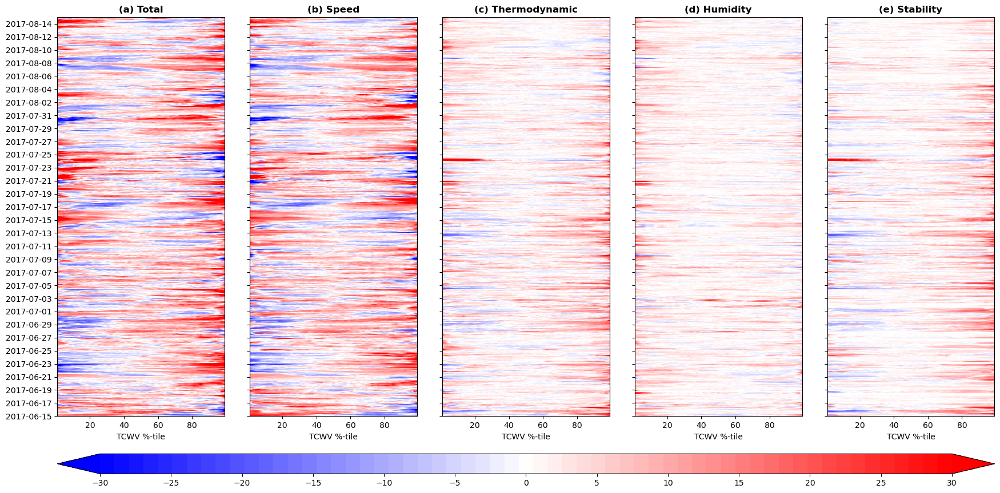

In [16]:
varis = ['Total','Velocity','Thermodynamic','Humidity','Stability']
hov_plot(varis,JJA_hovx,tval_p_JJA,JJA_hov,dates_p_JJA,'JJA',levels,ticks)

### Inputs!, so raw variables

In [17]:
JJA_input_hov,JJA_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                            time_JJA,sta_date,end_date)

Date: 2017-06-15 00:00:00
Date: 2017-06-15 01:00:00
Date: 2017-06-15 02:00:00
Date: 2017-06-15 03:00:00
Date: 2017-06-15 04:00:00
Date: 2017-06-15 05:00:00
Date: 2017-06-15 06:00:00
Date: 2017-06-15 07:00:00
Date: 2017-06-15 08:00:00
Date: 2017-06-15 09:00:00
Date: 2017-06-15 10:00:00
Date: 2017-06-15 11:00:00
Date: 2017-06-15 12:00:00
Date: 2017-06-15 13:00:00
Date: 2017-06-15 14:00:00
Date: 2017-06-15 15:00:00
Date: 2017-06-15 16:00:00
Date: 2017-06-15 17:00:00
Date: 2017-06-15 18:00:00
Date: 2017-06-15 19:00:00
Date: 2017-06-15 20:00:00
Date: 2017-06-15 21:00:00
Date: 2017-06-15 22:00:00
Date: 2017-06-15 23:00:00
Date: 2017-06-16 00:00:00
Date: 2017-06-16 01:00:00
Date: 2017-06-16 02:00:00
Date: 2017-06-16 03:00:00
Date: 2017-06-16 04:00:00
Date: 2017-06-16 05:00:00
Date: 2017-06-16 06:00:00
Date: 2017-06-16 07:00:00
Date: 2017-06-16 08:00:00
Date: 2017-06-16 09:00:00
Date: 2017-06-16 10:00:00
Date: 2017-06-16 11:00:00
Date: 2017-06-16 12:00:00
Date: 2017-06-16 13:00:00
Date: 2017-0

Date: 2017-06-28 15:00:00
Date: 2017-06-28 16:00:00
Date: 2017-06-28 17:00:00
Date: 2017-06-28 18:00:00
Date: 2017-06-28 19:00:00
Date: 2017-06-28 20:00:00
Date: 2017-06-28 21:00:00
Date: 2017-06-28 22:00:00
Date: 2017-06-28 23:00:00
Date: 2017-06-29 00:00:00
Date: 2017-06-29 01:00:00
Date: 2017-06-29 02:00:00
Date: 2017-06-29 03:00:00
Date: 2017-06-29 04:00:00
Date: 2017-06-29 05:00:00
Date: 2017-06-29 06:00:00
Date: 2017-06-29 07:00:00
Date: 2017-06-29 08:00:00
Date: 2017-06-29 09:00:00
Date: 2017-06-29 10:00:00
Date: 2017-06-29 11:00:00
Date: 2017-06-29 12:00:00
Date: 2017-06-29 13:00:00
Date: 2017-06-29 14:00:00
Date: 2017-06-29 15:00:00
Date: 2017-06-29 16:00:00
Date: 2017-06-29 17:00:00
Date: 2017-06-29 18:00:00
Date: 2017-06-29 19:00:00
Date: 2017-06-29 20:00:00
Date: 2017-06-29 21:00:00
Date: 2017-06-29 22:00:00
Date: 2017-06-29 23:00:00
Date: 2017-06-30 00:00:00
Date: 2017-06-30 01:00:00
Date: 2017-06-30 02:00:00
Date: 2017-06-30 03:00:00
Date: 2017-06-30 04:00:00
Date: 2017-0

Date: 2017-07-12 12:00:00
Date: 2017-07-12 13:00:00
Date: 2017-07-12 14:00:00
Date: 2017-07-12 15:00:00
Date: 2017-07-12 16:00:00
Date: 2017-07-12 17:00:00
Date: 2017-07-12 18:00:00
Date: 2017-07-12 19:00:00
Date: 2017-07-12 20:00:00
Date: 2017-07-12 21:00:00
Date: 2017-07-12 22:00:00
Date: 2017-07-12 23:00:00
Date: 2017-07-13 00:00:00
Date: 2017-07-13 01:00:00
Date: 2017-07-13 02:00:00
Date: 2017-07-13 03:00:00
Date: 2017-07-13 04:00:00
Date: 2017-07-13 05:00:00
Date: 2017-07-13 06:00:00
Date: 2017-07-13 07:00:00
Date: 2017-07-13 08:00:00
Date: 2017-07-13 09:00:00
Date: 2017-07-13 10:00:00
Date: 2017-07-13 11:00:00
Date: 2017-07-13 12:00:00
Date: 2017-07-13 13:00:00
Date: 2017-07-13 14:00:00
Date: 2017-07-13 15:00:00
Date: 2017-07-13 16:00:00
Date: 2017-07-13 17:00:00
Date: 2017-07-13 18:00:00
Date: 2017-07-13 19:00:00
Date: 2017-07-13 20:00:00
Date: 2017-07-13 21:00:00
Date: 2017-07-13 22:00:00
Date: 2017-07-13 23:00:00
Date: 2017-07-14 00:00:00
Date: 2017-07-14 01:00:00
Date: 2017-0

Date: 2017-07-26 08:00:00
Date: 2017-07-26 09:00:00
Date: 2017-07-26 10:00:00
Date: 2017-07-26 11:00:00
Date: 2017-07-26 12:00:00
Date: 2017-07-26 13:00:00
Date: 2017-07-26 14:00:00
Date: 2017-07-26 15:00:00
Date: 2017-07-26 16:00:00
Date: 2017-07-26 17:00:00
Date: 2017-07-26 18:00:00
Date: 2017-07-26 19:00:00
Date: 2017-07-26 20:00:00
Date: 2017-07-26 21:00:00
Date: 2017-07-26 22:00:00
Date: 2017-07-26 23:00:00
Date: 2017-07-27 00:00:00
Date: 2017-07-27 01:00:00
Date: 2017-07-27 02:00:00
Date: 2017-07-27 03:00:00
Date: 2017-07-27 04:00:00
Date: 2017-07-27 05:00:00
Date: 2017-07-27 06:00:00
Date: 2017-07-27 07:00:00
Date: 2017-07-27 08:00:00
Date: 2017-07-27 09:00:00
Date: 2017-07-27 10:00:00
Date: 2017-07-27 11:00:00
Date: 2017-07-27 12:00:00
Date: 2017-07-27 13:00:00
Date: 2017-07-27 14:00:00
Date: 2017-07-27 15:00:00
Date: 2017-07-27 16:00:00
Date: 2017-07-27 17:00:00
Date: 2017-07-27 18:00:00
Date: 2017-07-27 19:00:00
Date: 2017-07-27 20:00:00
Date: 2017-07-27 21:00:00
Date: 2017-0

Date: 2017-08-09 04:00:00
Date: 2017-08-09 05:00:00
Date: 2017-08-09 06:00:00
Date: 2017-08-09 07:00:00
Date: 2017-08-09 08:00:00
Date: 2017-08-09 09:00:00
Date: 2017-08-09 10:00:00
Date: 2017-08-09 11:00:00
Date: 2017-08-09 12:00:00
Date: 2017-08-09 13:00:00
Date: 2017-08-09 14:00:00
Date: 2017-08-09 15:00:00
Date: 2017-08-09 16:00:00
Date: 2017-08-09 17:00:00
Date: 2017-08-09 18:00:00
Date: 2017-08-09 19:00:00
Date: 2017-08-09 20:00:00
Date: 2017-08-09 21:00:00
Date: 2017-08-09 22:00:00
Date: 2017-08-09 23:00:00
Date: 2017-08-10 00:00:00
Date: 2017-08-10 01:00:00
Date: 2017-08-10 02:00:00
Date: 2017-08-10 03:00:00
Date: 2017-08-10 04:00:00
Date: 2017-08-10 05:00:00
Date: 2017-08-10 06:00:00
Date: 2017-08-10 07:00:00
Date: 2017-08-10 08:00:00
Date: 2017-08-10 09:00:00
Date: 2017-08-10 10:00:00
Date: 2017-08-10 11:00:00
Date: 2017-08-10 12:00:00
Date: 2017-08-10 13:00:00
Date: 2017-08-10 14:00:00
Date: 2017-08-10 15:00:00
Date: 2017-08-10 16:00:00
Date: 2017-08-10 17:00:00
Date: 2017-0

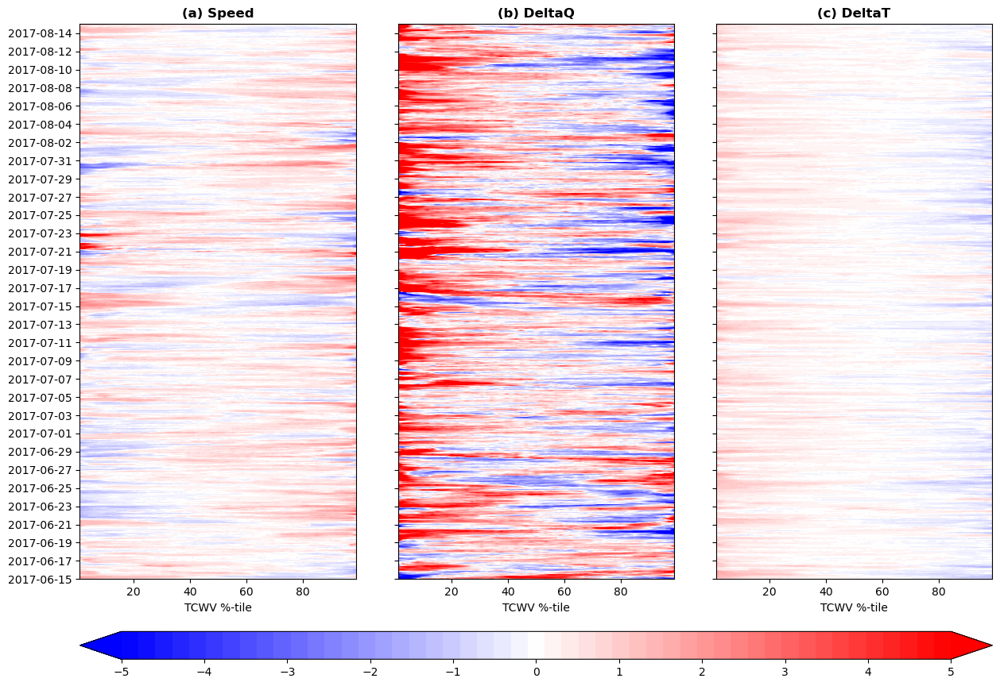

In [18]:
varis1 = ['Wind','DeltaQ','DeltaT']
JJA_input_hov['DeltaQ'] = JJA_input_hov['DeltaQ']*10000
hov_plot(varis1,JJA_input_hovx,tval_p_JJA,JJA_input_hov,dates_p_JJA,'JJA_input',
         np.linspace(-5,5,50),np.arange(-5,5.1,1))

# March-April-May

### Neural Net

In [19]:
#### Dates for a period of time!
##MAM
sta_date,end_date = '2017-03-15','2017-05-15'; time_MAM,dates_p_MAM,tval_p_MAM = dates_period(sta_date,end_date)
MAM_hov,MAM_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                   time_MAM,sta_date,end_date)

Date: 2017-03-15 00:00:00
Date: 2017-03-15 01:00:00
Date: 2017-03-15 02:00:00
Date: 2017-03-15 03:00:00
Date: 2017-03-15 04:00:00
Date: 2017-03-15 05:00:00
Date: 2017-03-15 06:00:00
Date: 2017-03-15 07:00:00
Date: 2017-03-15 08:00:00
Date: 2017-03-15 09:00:00
Date: 2017-03-15 10:00:00
Date: 2017-03-15 11:00:00
Date: 2017-03-15 12:00:00
Date: 2017-03-15 13:00:00
Date: 2017-03-15 14:00:00
Date: 2017-03-15 15:00:00
Date: 2017-03-15 16:00:00
Date: 2017-03-15 17:00:00
Date: 2017-03-15 18:00:00
Date: 2017-03-15 19:00:00
Date: 2017-03-15 20:00:00
Date: 2017-03-15 21:00:00
Date: 2017-03-15 22:00:00
Date: 2017-03-15 23:00:00
Date: 2017-03-16 00:00:00
Date: 2017-03-16 01:00:00
Date: 2017-03-16 02:00:00
Date: 2017-03-16 03:00:00
Date: 2017-03-16 04:00:00
Date: 2017-03-16 05:00:00
Date: 2017-03-16 06:00:00
Date: 2017-03-16 07:00:00
Date: 2017-03-16 08:00:00
Date: 2017-03-16 09:00:00
Date: 2017-03-16 10:00:00
Date: 2017-03-16 11:00:00
Date: 2017-03-16 12:00:00
Date: 2017-03-16 13:00:00
Date: 2017-0

Date: 2017-03-28 04:00:00
Date: 2017-03-28 05:00:00
Date: 2017-03-28 06:00:00
Date: 2017-03-28 07:00:00
Date: 2017-03-28 08:00:00
Date: 2017-03-28 09:00:00
Date: 2017-03-28 10:00:00
Date: 2017-03-28 11:00:00
Date: 2017-03-28 12:00:00
Date: 2017-03-28 13:00:00
Date: 2017-03-28 14:00:00
Date: 2017-03-28 15:00:00
Date: 2017-03-28 16:00:00
Date: 2017-03-28 17:00:00
Date: 2017-03-28 18:00:00
Date: 2017-03-28 19:00:00
Date: 2017-03-28 20:00:00
Date: 2017-03-28 21:00:00
Date: 2017-03-28 22:00:00
Date: 2017-03-28 23:00:00
Date: 2017-03-29 00:00:00
Date: 2017-03-29 01:00:00
Date: 2017-03-29 02:00:00
Date: 2017-03-29 03:00:00
Date: 2017-03-29 04:00:00
Date: 2017-03-29 05:00:00
Date: 2017-03-29 06:00:00
Date: 2017-03-29 07:00:00
Date: 2017-03-29 08:00:00
Date: 2017-03-29 09:00:00
Date: 2017-03-29 10:00:00
Date: 2017-03-29 11:00:00
Date: 2017-03-29 12:00:00
Date: 2017-03-29 13:00:00
Date: 2017-03-29 14:00:00
Date: 2017-03-29 15:00:00
Date: 2017-03-29 16:00:00
Date: 2017-03-29 17:00:00
Date: 2017-0

Date: 2017-04-10 08:00:00
Date: 2017-04-10 09:00:00
Date: 2017-04-10 10:00:00
Date: 2017-04-10 11:00:00
Date: 2017-04-10 12:00:00
Date: 2017-04-10 13:00:00
Date: 2017-04-10 14:00:00
Date: 2017-04-10 15:00:00
Date: 2017-04-10 16:00:00
Date: 2017-04-10 17:00:00
Date: 2017-04-10 18:00:00
Date: 2017-04-10 19:00:00
Date: 2017-04-10 20:00:00
Date: 2017-04-10 21:00:00
Date: 2017-04-10 22:00:00
Date: 2017-04-10 23:00:00
Date: 2017-04-11 00:00:00
Date: 2017-04-11 01:00:00
Date: 2017-04-11 02:00:00
Date: 2017-04-11 03:00:00
Date: 2017-04-11 04:00:00
Date: 2017-04-11 05:00:00
Date: 2017-04-11 06:00:00
Date: 2017-04-11 07:00:00
Date: 2017-04-11 08:00:00
Date: 2017-04-11 09:00:00
Date: 2017-04-11 10:00:00
Date: 2017-04-11 11:00:00
Date: 2017-04-11 12:00:00
Date: 2017-04-11 13:00:00
Date: 2017-04-11 14:00:00
Date: 2017-04-11 15:00:00
Date: 2017-04-11 16:00:00
Date: 2017-04-11 17:00:00
Date: 2017-04-11 18:00:00
Date: 2017-04-11 19:00:00
Date: 2017-04-11 20:00:00
Date: 2017-04-11 21:00:00
Date: 2017-0

Date: 2017-04-23 12:00:00
Date: 2017-04-23 13:00:00
Date: 2017-04-23 14:00:00
Date: 2017-04-23 15:00:00
Date: 2017-04-23 16:00:00
Date: 2017-04-23 17:00:00
Date: 2017-04-23 18:00:00
Date: 2017-04-23 19:00:00
Date: 2017-04-23 20:00:00
Date: 2017-04-23 21:00:00
Date: 2017-04-23 22:00:00
Date: 2017-04-23 23:00:00
Date: 2017-04-24 00:00:00
Date: 2017-04-24 01:00:00
Date: 2017-04-24 02:00:00
Date: 2017-04-24 03:00:00
Date: 2017-04-24 04:00:00
Date: 2017-04-24 05:00:00
Date: 2017-04-24 06:00:00
Date: 2017-04-24 07:00:00
Date: 2017-04-24 08:00:00
Date: 2017-04-24 09:00:00
Date: 2017-04-24 10:00:00
Date: 2017-04-24 11:00:00
Date: 2017-04-24 12:00:00
Date: 2017-04-24 13:00:00
Date: 2017-04-24 14:00:00
Date: 2017-04-24 15:00:00
Date: 2017-04-24 16:00:00
Date: 2017-04-24 17:00:00
Date: 2017-04-24 18:00:00
Date: 2017-04-24 19:00:00
Date: 2017-04-24 20:00:00
Date: 2017-04-24 21:00:00
Date: 2017-04-24 22:00:00
Date: 2017-04-24 23:00:00
Date: 2017-04-25 00:00:00
Date: 2017-04-25 01:00:00
Date: 2017-0

Date: 2017-05-06 17:00:00
Date: 2017-05-06 18:00:00
Date: 2017-05-06 19:00:00
Date: 2017-05-06 20:00:00
Date: 2017-05-06 21:00:00
Date: 2017-05-06 22:00:00
Date: 2017-05-06 23:00:00
Date: 2017-05-07 00:00:00
Date: 2017-05-07 01:00:00
Date: 2017-05-07 02:00:00
Date: 2017-05-07 03:00:00
Date: 2017-05-07 04:00:00
Date: 2017-05-07 05:00:00
Date: 2017-05-07 06:00:00
Date: 2017-05-07 07:00:00
Date: 2017-05-07 08:00:00
Date: 2017-05-07 09:00:00
Date: 2017-05-07 10:00:00
Date: 2017-05-07 11:00:00
Date: 2017-05-07 12:00:00
Date: 2017-05-07 13:00:00
Date: 2017-05-07 14:00:00
Date: 2017-05-07 15:00:00
Date: 2017-05-07 16:00:00
Date: 2017-05-07 17:00:00
Date: 2017-05-07 18:00:00
Date: 2017-05-07 19:00:00
Date: 2017-05-07 20:00:00
Date: 2017-05-07 21:00:00
Date: 2017-05-07 22:00:00
Date: 2017-05-07 23:00:00
Date: 2017-05-08 00:00:00
Date: 2017-05-08 01:00:00
Date: 2017-05-08 02:00:00
Date: 2017-05-08 03:00:00
Date: 2017-05-08 04:00:00
Date: 2017-05-08 05:00:00
Date: 2017-05-08 06:00:00
Date: 2017-0

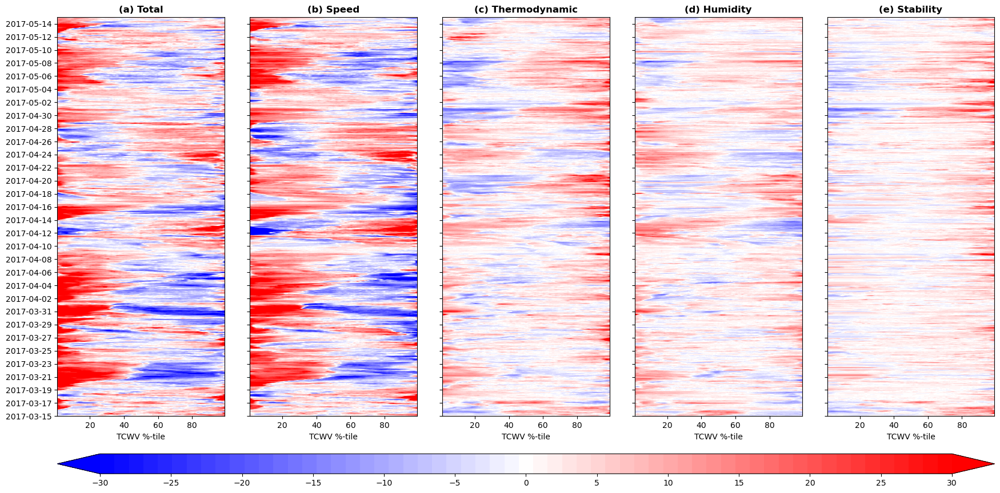

In [20]:
hov_plot(varis,MAM_hovx,tval_p_MAM,MAM_hov,dates_p_MAM,'MAM',levels,ticks)

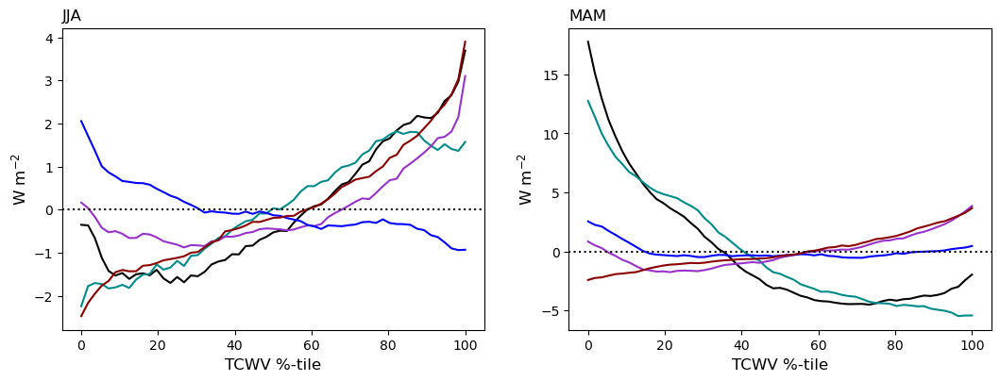

In [21]:
plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2, left=0.13, right=0.95, hspace=0.25, wspace=0.2, top=0.9, bottom=0.1)
ax=subplot(gs[0])
plot_means_line(varis,JJA_hov,nx,'JJA','JJA')
ax=subplot(gs[1])
plot_means_line(varis,MAM_hov,nx,'MAM','MAM')


### Inputs!, so raw variables

In [22]:
MAM_input_hov,MAM_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                time_MAM,sta_date,end_date)

Date: 2017-03-15 00:00:00
Date: 2017-03-15 01:00:00
Date: 2017-03-15 02:00:00
Date: 2017-03-15 03:00:00
Date: 2017-03-15 04:00:00
Date: 2017-03-15 05:00:00
Date: 2017-03-15 06:00:00
Date: 2017-03-15 07:00:00
Date: 2017-03-15 08:00:00
Date: 2017-03-15 09:00:00
Date: 2017-03-15 10:00:00
Date: 2017-03-15 11:00:00
Date: 2017-03-15 12:00:00
Date: 2017-03-15 13:00:00
Date: 2017-03-15 14:00:00
Date: 2017-03-15 15:00:00
Date: 2017-03-15 16:00:00
Date: 2017-03-15 17:00:00
Date: 2017-03-15 18:00:00
Date: 2017-03-15 19:00:00
Date: 2017-03-15 20:00:00
Date: 2017-03-15 21:00:00
Date: 2017-03-15 22:00:00
Date: 2017-03-15 23:00:00
Date: 2017-03-16 00:00:00
Date: 2017-03-16 01:00:00
Date: 2017-03-16 02:00:00
Date: 2017-03-16 03:00:00
Date: 2017-03-16 04:00:00
Date: 2017-03-16 05:00:00
Date: 2017-03-16 06:00:00
Date: 2017-03-16 07:00:00
Date: 2017-03-16 08:00:00
Date: 2017-03-16 09:00:00
Date: 2017-03-16 10:00:00
Date: 2017-03-16 11:00:00
Date: 2017-03-16 12:00:00
Date: 2017-03-16 13:00:00
Date: 2017-0

Date: 2017-03-31 07:00:00
Date: 2017-03-31 08:00:00
Date: 2017-03-31 09:00:00
Date: 2017-03-31 10:00:00
Date: 2017-03-31 11:00:00
Date: 2017-03-31 12:00:00
Date: 2017-03-31 13:00:00
Date: 2017-03-31 14:00:00
Date: 2017-03-31 15:00:00
Date: 2017-03-31 16:00:00
Date: 2017-03-31 17:00:00
Date: 2017-03-31 18:00:00
Date: 2017-03-31 19:00:00
Date: 2017-03-31 20:00:00
Date: 2017-03-31 21:00:00
Date: 2017-03-31 22:00:00
Date: 2017-03-31 23:00:00
Date: 2017-04-01 00:00:00
Date: 2017-04-01 01:00:00
Date: 2017-04-01 02:00:00
Date: 2017-04-01 03:00:00
Date: 2017-04-01 04:00:00
Date: 2017-04-01 05:00:00
Date: 2017-04-01 06:00:00
Date: 2017-04-01 07:00:00
Date: 2017-04-01 08:00:00
Date: 2017-04-01 09:00:00
Date: 2017-04-01 10:00:00
Date: 2017-04-01 11:00:00
Date: 2017-04-01 12:00:00
Date: 2017-04-01 13:00:00
Date: 2017-04-01 14:00:00
Date: 2017-04-01 15:00:00
Date: 2017-04-01 16:00:00
Date: 2017-04-01 17:00:00
Date: 2017-04-01 18:00:00
Date: 2017-04-01 19:00:00
Date: 2017-04-01 20:00:00
Date: 2017-0

Date: 2017-04-16 19:00:00
Date: 2017-04-16 20:00:00
Date: 2017-04-16 21:00:00
Date: 2017-04-16 22:00:00
Date: 2017-04-16 23:00:00
Date: 2017-04-17 00:00:00
Date: 2017-04-17 01:00:00
Date: 2017-04-17 02:00:00
Date: 2017-04-17 03:00:00
Date: 2017-04-17 04:00:00
Date: 2017-04-17 05:00:00
Date: 2017-04-17 06:00:00
Date: 2017-04-17 07:00:00
Date: 2017-04-17 08:00:00
Date: 2017-04-17 09:00:00
Date: 2017-04-17 10:00:00
Date: 2017-04-17 11:00:00
Date: 2017-04-17 12:00:00
Date: 2017-04-17 13:00:00
Date: 2017-04-17 14:00:00
Date: 2017-04-17 15:00:00
Date: 2017-04-17 16:00:00
Date: 2017-04-17 17:00:00
Date: 2017-04-17 18:00:00
Date: 2017-04-17 19:00:00
Date: 2017-04-17 20:00:00
Date: 2017-04-17 21:00:00
Date: 2017-04-17 22:00:00
Date: 2017-04-17 23:00:00
Date: 2017-04-18 00:00:00
Date: 2017-04-18 01:00:00
Date: 2017-04-18 02:00:00
Date: 2017-04-18 03:00:00
Date: 2017-04-18 04:00:00
Date: 2017-04-18 05:00:00
Date: 2017-04-18 06:00:00
Date: 2017-04-18 07:00:00
Date: 2017-04-18 08:00:00
Date: 2017-0

Date: 2017-04-30 14:00:00
Date: 2017-04-30 15:00:00
Date: 2017-04-30 16:00:00
Date: 2017-04-30 17:00:00
Date: 2017-04-30 18:00:00
Date: 2017-04-30 19:00:00
Date: 2017-04-30 20:00:00
Date: 2017-04-30 21:00:00
Date: 2017-04-30 22:00:00
Date: 2017-04-30 23:00:00
Date: 2017-05-01 00:00:00
Date: 2017-05-01 01:00:00
Date: 2017-05-01 02:00:00
Date: 2017-05-01 03:00:00
Date: 2017-05-01 04:00:00
Date: 2017-05-01 05:00:00
Date: 2017-05-01 06:00:00
Date: 2017-05-01 07:00:00
Date: 2017-05-01 08:00:00
Date: 2017-05-01 09:00:00
Date: 2017-05-01 10:00:00
Date: 2017-05-01 11:00:00
Date: 2017-05-01 12:00:00
Date: 2017-05-01 13:00:00
Date: 2017-05-01 14:00:00
Date: 2017-05-01 15:00:00
Date: 2017-05-01 16:00:00
Date: 2017-05-01 17:00:00
Date: 2017-05-01 18:00:00
Date: 2017-05-01 19:00:00
Date: 2017-05-01 20:00:00
Date: 2017-05-01 21:00:00
Date: 2017-05-01 22:00:00
Date: 2017-05-01 23:00:00
Date: 2017-05-02 00:00:00
Date: 2017-05-02 01:00:00
Date: 2017-05-02 02:00:00
Date: 2017-05-02 03:00:00
Date: 2017-0

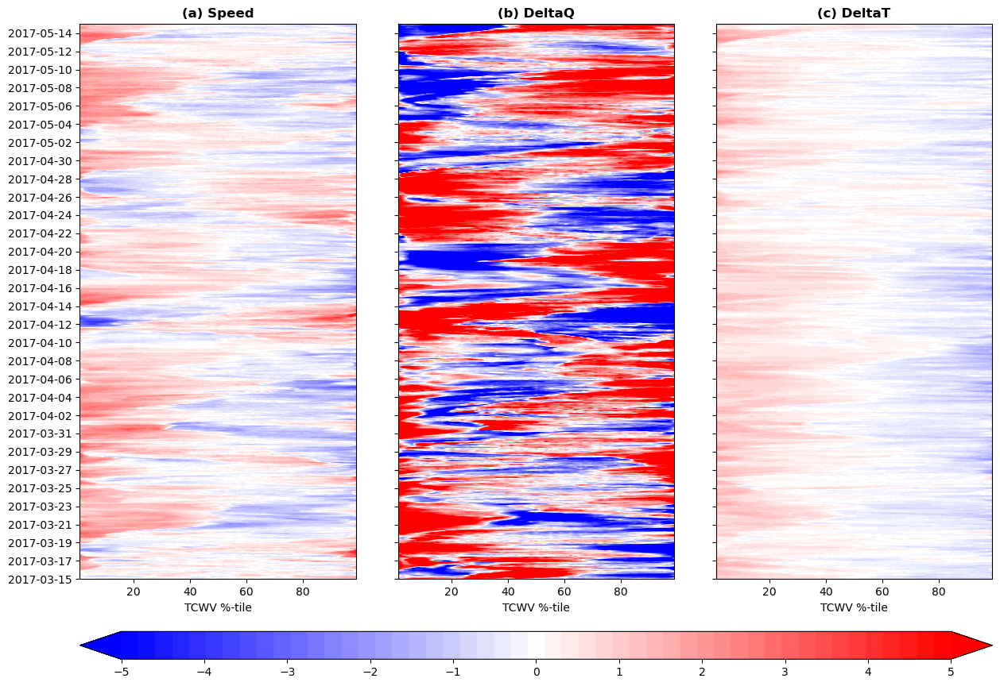

In [23]:
MAM_input_hov['DeltaQ'] = MAM_input_hov['DeltaQ']*10000
hov_plot(varis1,MAM_input_hovx,tval_p_MAM,MAM_input_hov,dates_p_MAM,'MAM_input',
         np.linspace(-5,5,50),np.arange(-5,5.1,1))


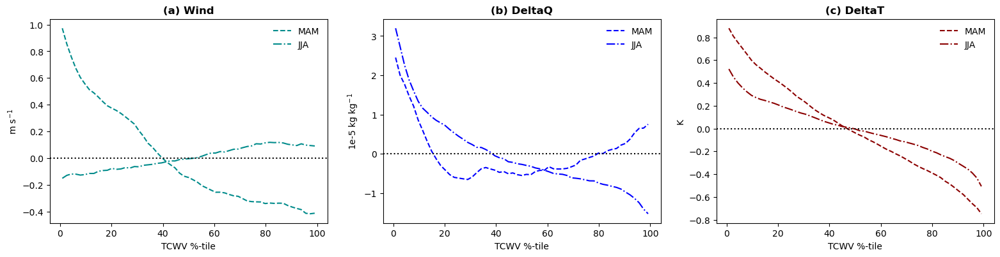

In [24]:
variabs = ['Wind','DeltaQ','DeltaT']
ylabel = ['m s$^{-1}$','1e-5 kg kg$^{-1}$','K']
titles = ['(a) Wind','(b) DeltaQ','(c) DeltaT']
colors = ['darkcyan','blue','darkred']

plt.figure(figsize=(18,4))
gs = gridspec.GridSpec(1,3, left=0.13, right=0.95, hspace=0.25, wspace=0.2, top=0.9, bottom=0.1)
for i,var in enumerate(variabs):
    ax=subplot(gs[i])
    plt.plot(MAM_input_hovx,np.mean(MAM_input_hov[var],axis=0), color = colors[i], 
             linestyle='--', label = 'MAM')
    plt.plot(JJA_input_hovx,np.mean(JJA_input_hov[var],axis=0), color = colors[i], 
             linestyle='-.', label = 'JJA')
    plt.xlabel('TCWV %-tile')
    plt.ylabel(ylabel[i])
    plt.title(titles[i], fontweight='bold')
    plt.legend(frameon=False)
    plt.axhline(0,linestyle=':', color = 'k')

# Reversals

In [25]:
def hov_plot_states(varis,hovx,NN_hov,period,rango,ticks,levels):
    if len(varis) == 5:
        titles = ['(a) Total','(b) Speed','(c) Thermodynamic','(d) Humidity','(e) Stability']
        plt.figure(figsize=(20,10))
        gs = gridspec.GridSpec(2,5, left=0.13, right=0.95, hspace=0.18, wspace=0.15, top=0.9, bottom=0.1, 
                               height_ratios=[1,0.05])
    else:
        titles = ['(a) Speed','(b) DeltaQ','(c) DeltaT']
        plt.figure(figsize=(14,10))
        gs = gridspec.GridSpec(2,3, left=0.13, right=0.95, hspace=0.18, wspace=0.15, top=0.9, bottom=0.1, 
                               height_ratios=[1,0.05])
    for i,var in enumerate(varis):
        ax=subplot(gs[i])
        im = plt.contourf(hovx,np.arange(0,len(NN_hov[var])),NN_hov[var],cmap='bwr', 
                          levels=rango, extend='both')
        if len(levels) > 0:
            plt.contour(hovx,np.arange(0,len(NN_hov[var])),NN_hov[var],levels=levels,colors='grey',
                        linestyles='dotted',linewidths=0.25)
        plt.title(titles[i], fontweight='bold')
        plt.xlabel('TCWV %-tile')
        if i!= 0 :
            plt.setp(ax.get_yticklabels(), visible=False)
    ax=subplot(gs[1,0:])
    cbar = plt.colorbar(im, cax=ax, orientation='horizontal', shrink = 0.4, ticks=ticks)
    plt.savefig('Hov_SFC_fluxes_contributions_'+period+'.jpg',bbox_inches='tight',dpi=300)
    plt.show()
    plt.close()

## All

### Neural Net

In [26]:
#### Dates for Reversals!
##Rev
df_rev = pd.read_csv('../../NN_real/Area_2-9_135-145_ERA5/Dates_2-9_135-145_reversals.csv',
                 parse_dates=True,index_col=0)
time_rev = df_rev.index.strftime('%Y-%m-%d %H:%M:%S').values
sta_date,end_date = '2016-01-01 00:00:00','2019-12-31 23:00:00'
rev_hov,rev_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                   time_rev,sta_date,end_date)

Date: 2016-01-05 15:00:00
Date: 2016-01-05 16:00:00
Date: 2016-01-05 17:00:00
Date: 2016-01-05 18:00:00
Date: 2016-01-05 19:00:00
Date: 2016-01-05 20:00:00
Date: 2016-01-05 21:00:00
Date: 2016-01-05 22:00:00
Date: 2016-01-05 23:00:00
Date: 2016-01-06 00:00:00
Date: 2016-01-06 01:00:00
Date: 2016-01-06 02:00:00
Date: 2016-01-06 03:00:00
Date: 2016-01-06 04:00:00
Date: 2016-01-06 05:00:00
Date: 2016-01-06 06:00:00
Date: 2016-01-06 07:00:00
Date: 2016-01-06 08:00:00
Date: 2016-01-06 09:00:00
Date: 2016-01-06 10:00:00
Date: 2016-01-06 11:00:00
Date: 2016-01-06 12:00:00
Date: 2016-01-06 13:00:00
Date: 2016-01-06 14:00:00
Date: 2016-01-06 15:00:00
Date: 2016-01-06 16:00:00
Date: 2016-01-06 17:00:00
Date: 2016-01-06 18:00:00
Date: 2016-01-06 19:00:00
Date: 2016-01-06 20:00:00
Date: 2016-01-06 21:00:00
Date: 2016-01-06 22:00:00
Date: 2016-01-06 23:00:00
Date: 2016-01-07 00:00:00
Date: 2016-01-07 01:00:00
Date: 2016-01-07 02:00:00
Date: 2016-01-07 03:00:00
Date: 2016-01-07 04:00:00
Date: 2016-0

Date: 2016-04-27 17:00:00
Date: 2016-04-27 18:00:00
Date: 2016-04-27 19:00:00
Date: 2016-04-27 20:00:00
Date: 2016-04-27 21:00:00
Date: 2016-04-27 22:00:00
Date: 2016-04-27 23:00:00
Date: 2016-04-28 00:00:00
Date: 2016-04-28 01:00:00
Date: 2016-04-28 02:00:00
Date: 2016-04-28 03:00:00
Date: 2016-04-28 04:00:00
Date: 2016-04-28 13:00:00
Date: 2016-04-28 14:00:00
Date: 2016-04-28 15:00:00
Date: 2016-04-28 16:00:00
Date: 2016-04-28 17:00:00
Date: 2016-04-28 18:00:00
Date: 2016-04-28 19:00:00
Date: 2016-04-28 20:00:00
Date: 2016-04-28 21:00:00
Date: 2016-04-28 22:00:00
Date: 2016-04-28 23:00:00
Date: 2016-04-29 00:00:00
Date: 2016-04-29 01:00:00
Date: 2016-04-29 02:00:00
Date: 2016-04-29 03:00:00
Date: 2016-04-29 04:00:00
Date: 2016-04-29 05:00:00
Date: 2016-04-29 06:00:00
Date: 2016-04-29 07:00:00
Date: 2016-04-29 08:00:00
Date: 2016-04-29 09:00:00
Date: 2016-04-29 10:00:00
Date: 2016-04-29 11:00:00
Date: 2016-04-29 12:00:00
Date: 2016-04-29 13:00:00
Date: 2016-04-29 14:00:00
Date: 2016-0

Date: 2016-07-05 19:00:00
Date: 2016-07-05 20:00:00
Date: 2016-07-05 21:00:00
Date: 2016-07-05 22:00:00
Date: 2016-07-05 23:00:00
Date: 2016-07-06 00:00:00
Date: 2016-07-06 01:00:00
Date: 2016-07-06 02:00:00
Date: 2016-07-06 03:00:00
Date: 2016-07-06 04:00:00
Date: 2016-07-06 05:00:00
Date: 2016-07-06 06:00:00
Date: 2016-07-06 07:00:00
Date: 2016-07-06 08:00:00
Date: 2016-07-06 09:00:00
Date: 2016-07-06 10:00:00
Date: 2016-07-06 11:00:00
Date: 2016-07-06 12:00:00
Date: 2016-07-06 13:00:00
Date: 2016-07-06 14:00:00
Date: 2016-07-06 15:00:00
Date: 2016-07-06 16:00:00
Date: 2016-07-06 17:00:00
Date: 2016-07-06 18:00:00
Date: 2016-07-06 19:00:00
Date: 2016-07-06 20:00:00
Date: 2016-07-06 21:00:00
Date: 2016-07-06 22:00:00
Date: 2016-07-06 23:00:00
Date: 2016-07-07 00:00:00
Date: 2016-07-07 01:00:00
Date: 2016-07-07 02:00:00
Date: 2016-07-09 05:00:00
Date: 2016-07-09 06:00:00
Date: 2016-07-09 07:00:00
Date: 2016-07-09 08:00:00
Date: 2016-07-09 09:00:00
Date: 2016-07-09 10:00:00
Date: 2016-0

Date: 2016-08-14 08:00:00
Date: 2016-08-14 09:00:00
Date: 2016-08-14 10:00:00
Date: 2016-08-14 11:00:00
Date: 2016-08-14 12:00:00
Date: 2016-08-14 13:00:00
Date: 2016-08-14 14:00:00
Date: 2016-08-14 15:00:00
Date: 2016-08-14 16:00:00
Date: 2016-08-14 17:00:00
Date: 2016-08-14 18:00:00
Date: 2016-08-14 19:00:00
Date: 2016-08-14 20:00:00
Date: 2016-08-14 21:00:00
Date: 2016-08-14 22:00:00
Date: 2016-08-14 23:00:00
Date: 2016-08-15 00:00:00
Date: 2016-08-15 01:00:00
Date: 2016-08-15 02:00:00
Date: 2016-08-16 00:00:00
Date: 2016-08-16 01:00:00
Date: 2016-08-16 02:00:00
Date: 2016-08-16 03:00:00
Date: 2016-08-16 04:00:00
Date: 2016-08-16 05:00:00
Date: 2016-08-16 06:00:00
Date: 2016-08-16 07:00:00
Date: 2016-08-16 08:00:00
Date: 2016-08-16 09:00:00
Date: 2016-08-16 10:00:00
Date: 2016-08-16 11:00:00
Date: 2016-08-16 12:00:00
Date: 2016-08-16 13:00:00
Date: 2016-08-16 14:00:00
Date: 2016-08-16 15:00:00
Date: 2016-08-16 16:00:00
Date: 2016-08-16 17:00:00
Date: 2016-08-16 18:00:00
Date: 2016-0

Date: 2016-09-07 07:00:00
Date: 2016-09-07 08:00:00
Date: 2016-09-07 10:00:00
Date: 2016-09-07 11:00:00
Date: 2016-09-07 12:00:00
Date: 2016-09-07 13:00:00
Date: 2016-09-07 14:00:00
Date: 2016-09-07 15:00:00
Date: 2016-09-07 16:00:00
Date: 2016-09-07 17:00:00
Date: 2016-09-07 18:00:00
Date: 2016-09-07 19:00:00
Date: 2016-09-07 20:00:00
Date: 2016-09-07 21:00:00
Date: 2016-09-07 22:00:00
Date: 2016-09-07 23:00:00
Date: 2016-09-08 00:00:00
Date: 2016-09-08 01:00:00
Date: 2016-09-08 02:00:00
Date: 2016-09-08 03:00:00
Date: 2016-09-08 04:00:00
Date: 2016-09-08 05:00:00
Date: 2016-09-08 06:00:00
Date: 2016-09-08 07:00:00
Date: 2016-09-08 08:00:00
Date: 2016-09-08 09:00:00
Date: 2016-09-08 10:00:00
Date: 2016-09-08 11:00:00
Date: 2016-09-08 12:00:00
Date: 2016-09-08 13:00:00
Date: 2016-09-08 14:00:00
Date: 2016-09-08 15:00:00
Date: 2016-09-08 16:00:00
Date: 2016-09-08 17:00:00
Date: 2016-09-08 18:00:00
Date: 2016-09-08 19:00:00
Date: 2016-09-08 20:00:00
Date: 2016-09-08 21:00:00
Date: 2016-0

Date: 2016-09-28 04:00:00
Date: 2016-09-28 05:00:00
Date: 2016-10-05 13:00:00
Date: 2016-10-05 14:00:00
Date: 2016-10-05 15:00:00
Date: 2016-10-05 16:00:00
Date: 2016-10-05 17:00:00
Date: 2016-10-05 18:00:00
Date: 2016-10-05 19:00:00
Date: 2016-10-05 20:00:00
Date: 2016-10-05 21:00:00
Date: 2016-10-05 22:00:00
Date: 2016-10-05 23:00:00
Date: 2016-10-06 00:00:00
Date: 2016-10-06 01:00:00
Date: 2016-10-06 02:00:00
Date: 2016-10-06 03:00:00
Date: 2016-10-06 04:00:00
Date: 2016-10-06 05:00:00
Date: 2016-10-06 06:00:00
Date: 2016-10-06 07:00:00
Date: 2016-10-06 08:00:00
Date: 2016-10-06 09:00:00
Date: 2016-10-06 10:00:00
Date: 2016-10-06 11:00:00
Date: 2016-10-06 12:00:00
Date: 2016-10-06 13:00:00
Date: 2016-10-06 14:00:00
Date: 2016-10-06 15:00:00
Date: 2016-10-06 16:00:00
Date: 2016-10-06 17:00:00
Date: 2016-10-06 18:00:00
Date: 2016-10-06 19:00:00
Date: 2016-10-06 20:00:00
Date: 2016-10-06 21:00:00
Date: 2016-10-06 22:00:00
Date: 2016-10-06 23:00:00
Date: 2016-10-07 00:00:00
Date: 2016-1

Date: 2016-11-06 22:00:00
Date: 2016-11-06 23:00:00
Date: 2016-11-07 00:00:00
Date: 2016-11-07 01:00:00
Date: 2016-11-07 02:00:00
Date: 2016-11-07 03:00:00
Date: 2016-11-07 04:00:00
Date: 2016-11-07 05:00:00
Date: 2016-11-07 06:00:00
Date: 2016-11-07 07:00:00
Date: 2016-11-07 08:00:00
Date: 2016-11-07 09:00:00
Date: 2016-11-07 10:00:00
Date: 2016-11-07 11:00:00
Date: 2016-11-07 12:00:00
Date: 2016-11-07 13:00:00
Date: 2016-11-07 14:00:00
Date: 2016-11-07 15:00:00
Date: 2016-11-07 16:00:00
Date: 2016-11-07 17:00:00
Date: 2016-11-08 16:00:00
Date: 2016-11-08 17:00:00
Date: 2016-11-08 18:00:00
Date: 2016-11-08 19:00:00
Date: 2016-11-08 20:00:00
Date: 2016-11-08 21:00:00
Date: 2016-11-08 22:00:00
Date: 2016-11-08 23:00:00
Date: 2016-11-09 00:00:00
Date: 2016-11-09 01:00:00
Date: 2016-11-09 02:00:00
Date: 2016-11-09 03:00:00
Date: 2016-11-09 04:00:00
Date: 2016-11-09 05:00:00
Date: 2016-11-09 06:00:00
Date: 2016-11-09 07:00:00
Date: 2016-11-09 08:00:00
Date: 2016-11-09 09:00:00
Date: 2016-1

Date: 2017-01-20 18:00:00
Date: 2017-01-20 19:00:00
Date: 2017-01-20 20:00:00
Date: 2017-01-20 21:00:00
Date: 2017-01-20 22:00:00
Date: 2017-01-20 23:00:00
Date: 2017-02-01 16:00:00
Date: 2017-02-01 17:00:00
Date: 2017-02-01 18:00:00
Date: 2017-02-01 19:00:00
Date: 2017-02-01 20:00:00
Date: 2017-02-01 21:00:00
Date: 2017-02-01 22:00:00
Date: 2017-02-01 23:00:00
Date: 2017-02-02 00:00:00
Date: 2017-02-02 01:00:00
Date: 2017-02-02 02:00:00
Date: 2017-02-02 03:00:00
Date: 2017-02-02 04:00:00
Date: 2017-02-02 05:00:00
Date: 2017-02-02 06:00:00
Date: 2017-02-02 07:00:00
Date: 2017-02-02 08:00:00
Date: 2017-02-02 09:00:00
Date: 2017-02-02 10:00:00
Date: 2017-02-02 11:00:00
Date: 2017-02-02 12:00:00
Date: 2017-02-02 13:00:00
Date: 2017-02-02 14:00:00
Date: 2017-02-02 15:00:00
Date: 2017-02-02 16:00:00
Date: 2017-02-02 17:00:00
Date: 2017-02-02 18:00:00
Date: 2017-02-02 19:00:00
Date: 2017-02-02 20:00:00
Date: 2017-02-02 21:00:00
Date: 2017-02-02 22:00:00
Date: 2017-02-02 23:00:00
Date: 2017-0

Date: 2017-04-21 19:00:00
Date: 2017-04-21 20:00:00
Date: 2017-04-21 21:00:00
Date: 2017-04-21 22:00:00
Date: 2017-04-21 23:00:00
Date: 2017-04-22 00:00:00
Date: 2017-04-22 01:00:00
Date: 2017-04-22 02:00:00
Date: 2017-04-22 03:00:00
Date: 2017-04-22 04:00:00
Date: 2017-04-22 05:00:00
Date: 2017-04-22 06:00:00
Date: 2017-04-22 07:00:00
Date: 2017-04-22 08:00:00
Date: 2017-04-22 09:00:00
Date: 2017-04-22 10:00:00
Date: 2017-04-22 11:00:00
Date: 2017-04-22 12:00:00
Date: 2017-04-22 13:00:00
Date: 2017-04-22 14:00:00
Date: 2017-04-22 15:00:00
Date: 2017-04-22 16:00:00
Date: 2017-04-22 17:00:00
Date: 2017-04-22 18:00:00
Date: 2017-04-22 19:00:00
Date: 2017-04-22 20:00:00
Date: 2017-04-22 21:00:00
Date: 2017-04-22 22:00:00
Date: 2017-04-22 23:00:00
Date: 2017-04-23 00:00:00
Date: 2017-04-23 01:00:00
Date: 2017-04-23 02:00:00
Date: 2017-04-23 03:00:00
Date: 2017-04-23 04:00:00
Date: 2017-04-23 05:00:00
Date: 2017-04-23 06:00:00
Date: 2017-04-23 07:00:00
Date: 2017-04-23 08:00:00
Date: 2017-0

Date: 2017-10-24 20:00:00
Date: 2017-10-24 21:00:00
Date: 2017-10-24 22:00:00
Date: 2017-10-24 23:00:00
Date: 2017-10-25 00:00:00
Date: 2017-10-25 01:00:00
Date: 2017-10-25 02:00:00
Date: 2017-10-25 03:00:00
Date: 2017-10-25 04:00:00
Date: 2017-10-25 05:00:00
Date: 2017-10-25 06:00:00
Date: 2017-10-25 07:00:00
Date: 2017-10-25 08:00:00
Date: 2017-10-25 09:00:00
Date: 2017-10-25 10:00:00
Date: 2017-10-25 11:00:00
Date: 2017-10-25 12:00:00
Date: 2017-10-25 13:00:00
Date: 2017-10-25 14:00:00
Date: 2017-10-25 15:00:00
Date: 2017-10-25 16:00:00
Date: 2017-10-25 17:00:00
Date: 2017-10-25 18:00:00
Date: 2017-10-25 19:00:00
Date: 2017-10-25 20:00:00
Date: 2017-10-25 21:00:00
Date: 2017-10-25 22:00:00
Date: 2017-10-25 23:00:00
Date: 2017-10-26 00:00:00
Date: 2017-10-26 01:00:00
Date: 2017-10-26 02:00:00
Date: 2017-10-26 03:00:00
Date: 2017-10-26 04:00:00
Date: 2017-10-26 05:00:00
Date: 2017-10-26 06:00:00
Date: 2017-10-26 07:00:00
Date: 2017-10-26 08:00:00
Date: 2017-10-26 09:00:00
Date: 2017-1

Date: 2018-03-15 19:00:00
Date: 2018-03-15 20:00:00
Date: 2018-03-15 21:00:00
Date: 2018-03-15 22:00:00
Date: 2018-03-15 23:00:00
Date: 2018-03-16 00:00:00
Date: 2018-03-16 01:00:00
Date: 2018-03-16 02:00:00
Date: 2018-03-16 03:00:00
Date: 2018-03-16 04:00:00
Date: 2018-03-16 05:00:00
Date: 2018-03-16 06:00:00
Date: 2018-03-16 07:00:00
Date: 2018-03-16 08:00:00
Date: 2018-03-16 09:00:00
Date: 2018-03-16 10:00:00
Date: 2018-03-16 11:00:00
Date: 2018-03-16 12:00:00
Date: 2018-03-16 13:00:00
Date: 2018-03-16 14:00:00
Date: 2018-03-16 15:00:00
Date: 2018-03-16 16:00:00
Date: 2018-03-16 17:00:00
Date: 2018-03-16 18:00:00
Date: 2018-03-24 18:00:00
Date: 2018-03-24 19:00:00
Date: 2018-03-24 20:00:00
Date: 2018-03-24 21:00:00
Date: 2018-03-24 22:00:00
Date: 2018-03-24 23:00:00
Date: 2018-03-25 00:00:00
Date: 2018-03-25 01:00:00
Date: 2018-03-25 02:00:00
Date: 2018-03-25 03:00:00
Date: 2018-03-25 04:00:00
Date: 2018-03-25 05:00:00
Date: 2018-03-25 06:00:00
Date: 2018-03-25 07:00:00
Date: 2018-0

Date: 2018-07-29 04:00:00
Date: 2018-07-29 05:00:00
Date: 2018-07-29 06:00:00
Date: 2018-07-29 07:00:00
Date: 2018-07-29 08:00:00
Date: 2018-07-29 09:00:00
Date: 2018-07-29 10:00:00
Date: 2018-07-29 11:00:00
Date: 2018-07-29 12:00:00
Date: 2018-07-29 13:00:00
Date: 2018-07-29 14:00:00
Date: 2018-07-29 15:00:00
Date: 2018-07-29 16:00:00
Date: 2018-07-29 17:00:00
Date: 2018-07-29 18:00:00
Date: 2018-07-29 19:00:00
Date: 2018-07-29 20:00:00
Date: 2018-07-29 21:00:00
Date: 2018-07-29 22:00:00
Date: 2018-07-29 23:00:00
Date: 2018-07-30 00:00:00
Date: 2018-07-30 01:00:00
Date: 2018-07-30 02:00:00
Date: 2018-07-30 03:00:00
Date: 2018-07-30 04:00:00
Date: 2018-07-30 05:00:00
Date: 2018-07-30 06:00:00
Date: 2018-07-30 07:00:00
Date: 2018-07-30 08:00:00
Date: 2018-07-30 09:00:00
Date: 2018-07-30 10:00:00
Date: 2018-07-30 11:00:00
Date: 2018-07-30 12:00:00
Date: 2018-07-30 13:00:00
Date: 2018-07-30 14:00:00
Date: 2018-07-30 15:00:00
Date: 2018-07-30 16:00:00
Date: 2018-07-30 17:00:00
Date: 2018-0

Date: 2018-08-16 14:00:00
Date: 2018-08-16 15:00:00
Date: 2018-08-16 16:00:00
Date: 2018-08-16 17:00:00
Date: 2018-08-16 18:00:00
Date: 2018-08-16 19:00:00
Date: 2018-08-16 20:00:00
Date: 2018-08-16 21:00:00
Date: 2018-08-16 22:00:00
Date: 2018-08-16 23:00:00
Date: 2018-08-17 00:00:00
Date: 2018-08-17 01:00:00
Date: 2018-08-17 02:00:00
Date: 2018-08-17 03:00:00
Date: 2018-08-17 04:00:00
Date: 2018-08-17 05:00:00
Date: 2018-08-17 06:00:00
Date: 2018-08-17 07:00:00
Date: 2018-08-17 08:00:00
Date: 2018-08-17 09:00:00
Date: 2018-08-17 10:00:00
Date: 2018-08-17 11:00:00
Date: 2018-08-17 12:00:00
Date: 2018-08-17 13:00:00
Date: 2018-08-17 14:00:00
Date: 2018-08-17 15:00:00
Date: 2018-08-17 16:00:00
Date: 2018-08-17 17:00:00
Date: 2018-08-17 18:00:00
Date: 2018-08-17 19:00:00
Date: 2018-08-17 20:00:00
Date: 2018-08-17 21:00:00
Date: 2018-08-17 22:00:00
Date: 2018-08-17 23:00:00
Date: 2018-08-18 00:00:00
Date: 2018-08-18 01:00:00
Date: 2018-08-18 02:00:00
Date: 2018-08-19 15:00:00
Date: 2018-0

Date: 2018-10-20 00:00:00
Date: 2018-10-20 01:00:00
Date: 2018-10-20 02:00:00
Date: 2018-10-20 03:00:00
Date: 2018-10-20 04:00:00
Date: 2018-10-20 05:00:00
Date: 2018-10-20 06:00:00
Date: 2018-10-20 07:00:00
Date: 2018-10-20 08:00:00
Date: 2018-10-20 09:00:00
Date: 2018-10-20 10:00:00
Date: 2018-10-20 11:00:00
Date: 2018-10-20 12:00:00
Date: 2018-10-20 13:00:00
Date: 2018-10-20 14:00:00
Date: 2018-10-20 15:00:00
Date: 2018-10-20 16:00:00
Date: 2018-10-20 17:00:00
Date: 2018-10-20 18:00:00
Date: 2018-10-20 19:00:00
Date: 2018-10-20 20:00:00
Date: 2018-10-20 21:00:00
Date: 2018-10-20 22:00:00
Date: 2018-10-20 23:00:00
Date: 2018-10-21 00:00:00
Date: 2018-10-21 01:00:00
Date: 2018-10-21 02:00:00
Date: 2018-10-21 03:00:00
Date: 2018-10-21 04:00:00
Date: 2018-10-21 05:00:00
Date: 2018-10-21 06:00:00
Date: 2018-10-21 07:00:00
Date: 2018-10-21 08:00:00
Date: 2018-10-21 09:00:00
Date: 2018-10-21 10:00:00
Date: 2018-10-21 11:00:00
Date: 2018-10-21 12:00:00
Date: 2018-10-21 13:00:00
Date: 2018-1

Date: 2018-12-19 18:00:00
Date: 2018-12-19 19:00:00
Date: 2018-12-19 20:00:00
Date: 2018-12-19 21:00:00
Date: 2018-12-19 22:00:00
Date: 2018-12-19 23:00:00
Date: 2018-12-20 00:00:00
Date: 2018-12-20 01:00:00
Date: 2018-12-20 02:00:00
Date: 2018-12-20 03:00:00
Date: 2018-12-20 04:00:00
Date: 2018-12-20 05:00:00
Date: 2018-12-20 06:00:00
Date: 2018-12-20 07:00:00
Date: 2018-12-20 08:00:00
Date: 2018-12-20 09:00:00
Date: 2018-12-20 10:00:00
Date: 2018-12-20 11:00:00
Date: 2018-12-20 12:00:00
Date: 2019-01-03 05:00:00
Date: 2019-01-03 06:00:00
Date: 2019-01-03 07:00:00
Date: 2019-01-03 08:00:00
Date: 2019-01-03 09:00:00
Date: 2019-01-03 10:00:00
Date: 2019-01-03 11:00:00
Date: 2019-01-03 12:00:00
Date: 2019-01-03 13:00:00
Date: 2019-01-03 14:00:00
Date: 2019-01-03 15:00:00
Date: 2019-01-03 16:00:00
Date: 2019-01-03 17:00:00
Date: 2019-01-03 18:00:00
Date: 2019-01-03 19:00:00
Date: 2019-01-03 20:00:00
Date: 2019-01-03 21:00:00
Date: 2019-01-03 22:00:00
Date: 2019-01-03 23:00:00
Date: 2019-0

Date: 2019-04-05 13:00:00
Date: 2019-04-05 14:00:00
Date: 2019-04-05 15:00:00
Date: 2019-04-05 16:00:00
Date: 2019-04-05 17:00:00
Date: 2019-04-05 18:00:00
Date: 2019-04-05 19:00:00
Date: 2019-04-05 20:00:00
Date: 2019-04-05 21:00:00
Date: 2019-04-05 22:00:00
Date: 2019-04-05 23:00:00
Date: 2019-04-06 00:00:00
Date: 2019-04-06 01:00:00
Date: 2019-04-06 02:00:00
Date: 2019-04-06 03:00:00
Date: 2019-04-06 04:00:00
Date: 2019-04-06 05:00:00
Date: 2019-04-06 06:00:00
Date: 2019-04-06 07:00:00
Date: 2019-04-06 08:00:00
Date: 2019-04-06 09:00:00
Date: 2019-04-06 10:00:00
Date: 2019-04-06 11:00:00
Date: 2019-04-06 12:00:00
Date: 2019-04-06 13:00:00
Date: 2019-04-06 14:00:00
Date: 2019-04-06 15:00:00
Date: 2019-04-06 16:00:00
Date: 2019-04-06 17:00:00
Date: 2019-04-06 18:00:00
Date: 2019-04-06 19:00:00
Date: 2019-04-06 20:00:00
Date: 2019-04-06 21:00:00
Date: 2019-04-06 22:00:00
Date: 2019-04-06 23:00:00
Date: 2019-04-07 00:00:00
Date: 2019-04-07 01:00:00
Date: 2019-04-07 02:00:00
Date: 2019-0

Date: 2019-08-30 16:00:00
Date: 2019-08-30 17:00:00
Date: 2019-08-30 18:00:00
Date: 2019-08-30 19:00:00
Date: 2019-08-30 20:00:00
Date: 2019-08-30 21:00:00
Date: 2019-08-30 22:00:00
Date: 2019-08-30 23:00:00
Date: 2019-08-31 00:00:00
Date: 2019-09-19 08:00:00
Date: 2019-09-19 09:00:00
Date: 2019-09-19 10:00:00
Date: 2019-09-19 11:00:00
Date: 2019-09-19 12:00:00
Date: 2019-09-19 13:00:00
Date: 2019-09-19 14:00:00
Date: 2019-09-19 15:00:00
Date: 2019-09-19 16:00:00
Date: 2019-09-19 17:00:00
Date: 2019-09-19 18:00:00
Date: 2019-09-19 19:00:00
Date: 2019-09-19 20:00:00
Date: 2019-09-19 21:00:00
Date: 2019-09-19 22:00:00
Date: 2019-09-19 23:00:00
Date: 2019-09-20 00:00:00
Date: 2019-09-20 01:00:00
Date: 2019-09-20 02:00:00
Date: 2019-09-20 03:00:00
Date: 2019-09-20 04:00:00
Date: 2019-09-20 05:00:00
Date: 2019-09-20 06:00:00
Date: 2019-09-20 07:00:00
Date: 2019-09-20 08:00:00
Date: 2019-09-20 09:00:00
Date: 2019-09-20 10:00:00
Date: 2019-09-20 11:00:00
Date: 2019-09-20 12:00:00
Date: 2019-0

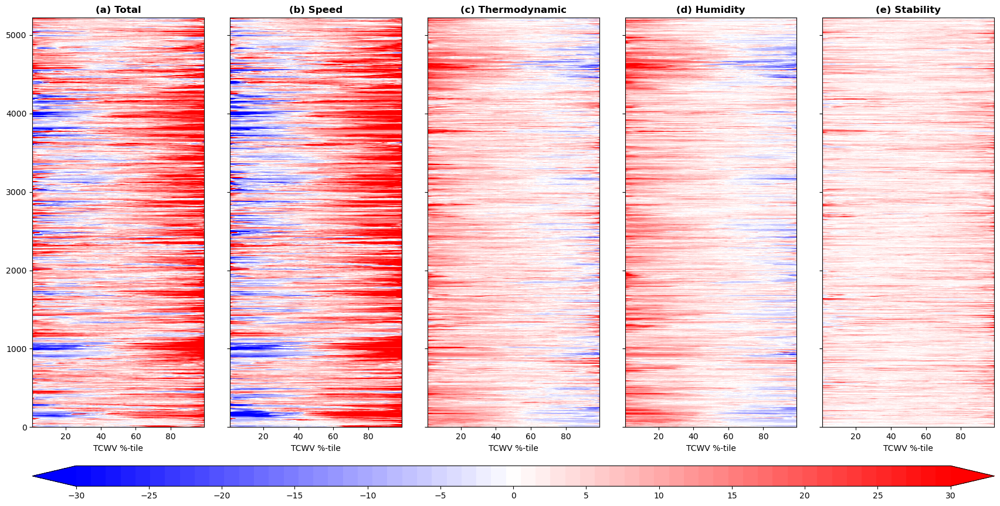

In [27]:
hov_plot_states(varis,rev_hovx,rev_hov,'Reversals',levels,ticks,[])

### Inputs!, so raw variables

In [28]:
rev_input_hov,rev_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                            time_rev,sta_date,end_date)

Date: 2016-01-05 15:00:00
Date: 2016-01-05 16:00:00
Date: 2016-01-05 17:00:00
Date: 2016-01-05 18:00:00
Date: 2016-01-05 19:00:00
Date: 2016-01-05 20:00:00
Date: 2016-01-05 21:00:00
Date: 2016-01-05 22:00:00
Date: 2016-01-05 23:00:00
Date: 2016-01-06 00:00:00
Date: 2016-01-06 01:00:00
Date: 2016-01-06 02:00:00
Date: 2016-01-06 03:00:00
Date: 2016-01-06 04:00:00
Date: 2016-01-06 05:00:00
Date: 2016-01-06 06:00:00
Date: 2016-01-06 07:00:00
Date: 2016-01-06 08:00:00
Date: 2016-01-06 09:00:00
Date: 2016-01-06 10:00:00
Date: 2016-01-06 11:00:00
Date: 2016-01-06 12:00:00
Date: 2016-01-06 13:00:00
Date: 2016-01-06 14:00:00
Date: 2016-01-06 15:00:00
Date: 2016-01-06 16:00:00
Date: 2016-01-06 17:00:00
Date: 2016-01-06 18:00:00
Date: 2016-01-06 19:00:00
Date: 2016-01-06 20:00:00
Date: 2016-01-06 21:00:00
Date: 2016-01-06 22:00:00
Date: 2016-01-06 23:00:00
Date: 2016-01-07 00:00:00
Date: 2016-01-07 01:00:00
Date: 2016-01-07 02:00:00
Date: 2016-01-07 03:00:00
Date: 2016-01-07 04:00:00
Date: 2016-0

Date: 2016-04-27 18:00:00
Date: 2016-04-27 19:00:00
Date: 2016-04-27 20:00:00
Date: 2016-04-27 21:00:00
Date: 2016-04-27 22:00:00
Date: 2016-04-27 23:00:00
Date: 2016-04-28 00:00:00
Date: 2016-04-28 01:00:00
Date: 2016-04-28 02:00:00
Date: 2016-04-28 03:00:00
Date: 2016-04-28 04:00:00
Date: 2016-04-28 13:00:00
Date: 2016-04-28 14:00:00
Date: 2016-04-28 15:00:00
Date: 2016-04-28 16:00:00
Date: 2016-04-28 17:00:00
Date: 2016-04-28 18:00:00
Date: 2016-04-28 19:00:00
Date: 2016-04-28 20:00:00
Date: 2016-04-28 21:00:00
Date: 2016-04-28 22:00:00
Date: 2016-04-28 23:00:00
Date: 2016-04-29 00:00:00
Date: 2016-04-29 01:00:00
Date: 2016-04-29 02:00:00
Date: 2016-04-29 03:00:00
Date: 2016-04-29 04:00:00
Date: 2016-04-29 05:00:00
Date: 2016-04-29 06:00:00
Date: 2016-04-29 07:00:00
Date: 2016-04-29 08:00:00
Date: 2016-04-29 09:00:00
Date: 2016-04-29 10:00:00
Date: 2016-04-29 11:00:00
Date: 2016-04-29 12:00:00
Date: 2016-04-29 13:00:00
Date: 2016-04-29 14:00:00
Date: 2016-04-29 15:00:00
Date: 2016-0

Date: 2016-07-17 13:00:00
Date: 2016-07-17 14:00:00
Date: 2016-07-17 15:00:00
Date: 2016-07-17 16:00:00
Date: 2016-07-17 17:00:00
Date: 2016-07-17 18:00:00
Date: 2016-07-17 19:00:00
Date: 2016-07-17 20:00:00
Date: 2016-07-17 21:00:00
Date: 2016-07-17 22:00:00
Date: 2016-07-17 23:00:00
Date: 2016-07-18 00:00:00
Date: 2016-07-18 01:00:00
Date: 2016-07-18 02:00:00
Date: 2016-07-18 03:00:00
Date: 2016-07-18 04:00:00
Date: 2016-07-18 05:00:00
Date: 2016-07-18 06:00:00
Date: 2016-07-18 07:00:00
Date: 2016-07-18 08:00:00
Date: 2016-07-18 09:00:00
Date: 2016-07-18 10:00:00
Date: 2016-07-18 11:00:00
Date: 2016-07-18 12:00:00
Date: 2016-07-18 13:00:00
Date: 2016-07-18 14:00:00
Date: 2016-07-18 15:00:00
Date: 2016-07-18 16:00:00
Date: 2016-07-18 17:00:00
Date: 2016-07-18 18:00:00
Date: 2016-07-18 19:00:00
Date: 2016-07-18 20:00:00
Date: 2016-07-21 01:00:00
Date: 2016-07-21 02:00:00
Date: 2016-07-21 03:00:00
Date: 2016-07-21 04:00:00
Date: 2016-07-21 05:00:00
Date: 2016-07-21 06:00:00
Date: 2016-0

Date: 2016-08-19 16:00:00
Date: 2016-08-19 17:00:00
Date: 2016-08-19 18:00:00
Date: 2016-08-19 19:00:00
Date: 2016-08-19 20:00:00
Date: 2016-08-19 21:00:00
Date: 2016-08-19 22:00:00
Date: 2016-08-19 23:00:00
Date: 2016-08-20 00:00:00
Date: 2016-08-20 01:00:00
Date: 2016-08-20 02:00:00
Date: 2016-08-20 03:00:00
Date: 2016-08-20 04:00:00
Date: 2016-08-20 05:00:00
Date: 2016-08-20 06:00:00
Date: 2016-08-20 07:00:00
Date: 2016-08-20 08:00:00
Date: 2016-08-20 09:00:00
Date: 2016-08-20 10:00:00
Date: 2016-08-20 11:00:00
Date: 2016-08-20 12:00:00
Date: 2016-08-20 13:00:00
Date: 2016-08-20 14:00:00
Date: 2016-08-20 15:00:00
Date: 2016-08-20 16:00:00
Date: 2016-08-20 17:00:00
Date: 2016-08-20 18:00:00
Date: 2016-08-20 19:00:00
Date: 2016-08-20 20:00:00
Date: 2016-08-20 21:00:00
Date: 2016-08-20 22:00:00
Date: 2016-08-20 23:00:00
Date: 2016-08-21 00:00:00
Date: 2016-08-21 01:00:00
Date: 2016-08-21 02:00:00
Date: 2016-08-21 03:00:00
Date: 2016-08-21 04:00:00
Date: 2016-08-21 05:00:00
Date: 2016-0

Date: 2016-09-13 12:00:00
Date: 2016-09-13 13:00:00
Date: 2016-09-14 19:00:00
Date: 2016-09-14 20:00:00
Date: 2016-09-14 21:00:00
Date: 2016-09-14 22:00:00
Date: 2016-09-14 23:00:00
Date: 2016-09-15 00:00:00
Date: 2016-09-15 01:00:00
Date: 2016-09-15 02:00:00
Date: 2016-09-15 03:00:00
Date: 2016-09-15 04:00:00
Date: 2016-09-15 05:00:00
Date: 2016-09-15 06:00:00
Date: 2016-09-15 07:00:00
Date: 2016-09-15 08:00:00
Date: 2016-09-15 09:00:00
Date: 2016-09-15 10:00:00
Date: 2016-09-15 11:00:00
Date: 2016-09-15 12:00:00
Date: 2016-09-15 13:00:00
Date: 2016-09-15 14:00:00
Date: 2016-09-15 15:00:00
Date: 2016-09-15 16:00:00
Date: 2016-09-15 17:00:00
Date: 2016-09-15 18:00:00
Date: 2016-09-15 19:00:00
Date: 2016-09-15 20:00:00
Date: 2016-09-15 21:00:00
Date: 2016-09-15 22:00:00
Date: 2016-09-15 23:00:00
Date: 2016-09-16 00:00:00
Date: 2016-09-16 01:00:00
Date: 2016-09-16 02:00:00
Date: 2016-09-16 03:00:00
Date: 2016-09-16 04:00:00
Date: 2016-09-16 05:00:00
Date: 2016-09-16 06:00:00
Date: 2016-0

Date: 2016-10-11 19:00:00
Date: 2016-10-11 20:00:00
Date: 2016-10-11 21:00:00
Date: 2016-10-15 00:00:00
Date: 2016-10-15 01:00:00
Date: 2016-10-15 02:00:00
Date: 2016-10-15 03:00:00
Date: 2016-10-15 04:00:00
Date: 2016-10-15 05:00:00
Date: 2016-10-15 06:00:00
Date: 2016-10-15 07:00:00
Date: 2016-10-15 08:00:00
Date: 2016-10-15 09:00:00
Date: 2016-10-15 10:00:00
Date: 2016-10-15 11:00:00
Date: 2016-10-15 12:00:00
Date: 2016-10-15 13:00:00
Date: 2016-10-15 14:00:00
Date: 2016-10-15 15:00:00
Date: 2016-10-15 16:00:00
Date: 2016-10-15 17:00:00
Date: 2016-10-15 18:00:00
Date: 2016-10-15 19:00:00
Date: 2016-10-15 20:00:00
Date: 2016-10-15 21:00:00
Date: 2016-10-15 22:00:00
Date: 2016-10-15 23:00:00
Date: 2016-10-16 00:00:00
Date: 2016-10-16 01:00:00
Date: 2016-10-16 02:00:00
Date: 2016-10-16 03:00:00
Date: 2016-10-16 04:00:00
Date: 2016-10-16 05:00:00
Date: 2016-10-16 06:00:00
Date: 2016-10-16 07:00:00
Date: 2016-10-16 08:00:00
Date: 2016-10-16 09:00:00
Date: 2016-10-16 10:00:00
Date: 2016-1

Date: 2016-11-22 10:00:00
Date: 2016-11-22 11:00:00
Date: 2016-11-22 12:00:00
Date: 2016-11-22 13:00:00
Date: 2016-11-22 14:00:00
Date: 2016-11-22 15:00:00
Date: 2016-11-22 16:00:00
Date: 2016-11-22 17:00:00
Date: 2016-11-22 18:00:00
Date: 2016-11-22 19:00:00
Date: 2016-11-22 20:00:00
Date: 2016-11-22 21:00:00
Date: 2016-11-22 22:00:00
Date: 2016-11-22 23:00:00
Date: 2016-11-23 00:00:00
Date: 2016-11-23 01:00:00
Date: 2016-11-23 02:00:00
Date: 2016-12-22 05:00:00
Date: 2016-12-22 06:00:00
Date: 2016-12-22 07:00:00
Date: 2016-12-22 08:00:00
Date: 2016-12-22 09:00:00
Date: 2016-12-22 10:00:00
Date: 2016-12-22 11:00:00
Date: 2016-12-22 12:00:00
Date: 2016-12-22 13:00:00
Date: 2016-12-22 14:00:00
Date: 2016-12-22 15:00:00
Date: 2016-12-22 16:00:00
Date: 2016-12-22 17:00:00
Date: 2016-12-22 18:00:00
Date: 2016-12-22 19:00:00
Date: 2016-12-22 20:00:00
Date: 2016-12-22 21:00:00
Date: 2016-12-22 22:00:00
Date: 2016-12-22 23:00:00
Date: 2016-12-23 00:00:00
Date: 2016-12-23 01:00:00
Date: 2016-1

Date: 2017-02-15 16:00:00
Date: 2017-02-15 17:00:00
Date: 2017-02-15 18:00:00
Date: 2017-02-15 19:00:00
Date: 2017-02-15 20:00:00
Date: 2017-02-15 21:00:00
Date: 2017-02-15 22:00:00
Date: 2017-02-15 23:00:00
Date: 2017-02-16 00:00:00
Date: 2017-02-16 01:00:00
Date: 2017-02-16 02:00:00
Date: 2017-02-16 03:00:00
Date: 2017-02-16 04:00:00
Date: 2017-02-16 05:00:00
Date: 2017-02-16 06:00:00
Date: 2017-02-16 07:00:00
Date: 2017-02-16 08:00:00
Date: 2017-02-16 09:00:00
Date: 2017-02-16 10:00:00
Date: 2017-03-01 21:00:00
Date: 2017-03-01 22:00:00
Date: 2017-03-01 23:00:00
Date: 2017-03-02 00:00:00
Date: 2017-03-02 01:00:00
Date: 2017-03-02 02:00:00
Date: 2017-03-02 03:00:00
Date: 2017-03-02 04:00:00
Date: 2017-03-02 05:00:00
Date: 2017-03-02 06:00:00
Date: 2017-03-02 07:00:00
Date: 2017-03-02 08:00:00
Date: 2017-03-02 09:00:00
Date: 2017-03-02 10:00:00
Date: 2017-03-02 11:00:00
Date: 2017-03-02 12:00:00
Date: 2017-03-02 13:00:00
Date: 2017-03-02 14:00:00
Date: 2017-03-02 15:00:00
Date: 2017-0

Date: 2017-07-17 08:00:00
Date: 2017-07-17 09:00:00
Date: 2017-07-17 10:00:00
Date: 2017-07-17 11:00:00
Date: 2017-07-17 12:00:00
Date: 2017-07-17 13:00:00
Date: 2017-07-17 14:00:00
Date: 2017-07-17 15:00:00
Date: 2017-08-09 19:00:00
Date: 2017-08-09 20:00:00
Date: 2017-08-09 21:00:00
Date: 2017-08-09 22:00:00
Date: 2017-08-09 23:00:00
Date: 2017-08-10 00:00:00
Date: 2017-08-10 01:00:00
Date: 2017-08-10 02:00:00
Date: 2017-08-10 03:00:00
Date: 2017-08-10 04:00:00
Date: 2017-08-10 05:00:00
Date: 2017-08-10 06:00:00
Date: 2017-08-10 07:00:00
Date: 2017-08-10 08:00:00
Date: 2017-08-10 09:00:00
Date: 2017-08-10 10:00:00
Date: 2017-08-10 11:00:00
Date: 2017-08-10 12:00:00
Date: 2017-08-10 13:00:00
Date: 2017-08-10 14:00:00
Date: 2017-08-10 15:00:00
Date: 2017-08-10 16:00:00
Date: 2017-08-10 17:00:00
Date: 2017-08-10 18:00:00
Date: 2017-08-10 19:00:00
Date: 2017-08-10 20:00:00
Date: 2017-08-10 21:00:00
Date: 2017-08-10 22:00:00
Date: 2017-08-10 23:00:00
Date: 2017-08-11 00:00:00
Date: 2017-0

Date: 2018-01-21 05:00:00
Date: 2018-01-21 06:00:00
Date: 2018-01-21 07:00:00
Date: 2018-01-21 08:00:00
Date: 2018-01-21 09:00:00
Date: 2018-01-21 10:00:00
Date: 2018-01-21 11:00:00
Date: 2018-01-21 12:00:00
Date: 2018-01-21 13:00:00
Date: 2018-01-21 14:00:00
Date: 2018-01-21 15:00:00
Date: 2018-02-21 12:00:00
Date: 2018-02-21 13:00:00
Date: 2018-02-21 14:00:00
Date: 2018-02-21 15:00:00
Date: 2018-02-21 16:00:00
Date: 2018-02-21 17:00:00
Date: 2018-02-21 18:00:00
Date: 2018-02-21 19:00:00
Date: 2018-02-21 20:00:00
Date: 2018-02-21 21:00:00
Date: 2018-02-21 22:00:00
Date: 2018-02-21 23:00:00
Date: 2018-02-22 00:00:00
Date: 2018-02-22 01:00:00
Date: 2018-02-22 02:00:00
Date: 2018-02-22 03:00:00
Date: 2018-02-22 04:00:00
Date: 2018-02-22 05:00:00
Date: 2018-02-22 06:00:00
Date: 2018-02-22 07:00:00
Date: 2018-02-22 08:00:00
Date: 2018-02-22 09:00:00
Date: 2018-02-22 10:00:00
Date: 2018-02-22 11:00:00
Date: 2018-02-22 12:00:00
Date: 2018-02-22 13:00:00
Date: 2018-02-22 14:00:00
Date: 2018-0

Date: 2018-07-29 10:00:00
Date: 2018-07-29 11:00:00
Date: 2018-07-29 12:00:00
Date: 2018-07-29 13:00:00
Date: 2018-07-29 14:00:00
Date: 2018-07-29 15:00:00
Date: 2018-07-29 16:00:00
Date: 2018-07-29 17:00:00
Date: 2018-07-29 18:00:00
Date: 2018-07-29 19:00:00
Date: 2018-07-29 20:00:00
Date: 2018-07-29 21:00:00
Date: 2018-07-29 22:00:00
Date: 2018-07-29 23:00:00
Date: 2018-07-30 00:00:00
Date: 2018-07-30 01:00:00
Date: 2018-07-30 02:00:00
Date: 2018-07-30 03:00:00
Date: 2018-07-30 04:00:00
Date: 2018-07-30 05:00:00
Date: 2018-07-30 06:00:00
Date: 2018-07-30 07:00:00
Date: 2018-07-30 08:00:00
Date: 2018-07-30 09:00:00
Date: 2018-07-30 10:00:00
Date: 2018-07-30 11:00:00
Date: 2018-07-30 12:00:00
Date: 2018-07-30 13:00:00
Date: 2018-07-30 14:00:00
Date: 2018-07-30 15:00:00
Date: 2018-07-30 16:00:00
Date: 2018-07-30 17:00:00
Date: 2018-07-30 18:00:00
Date: 2018-07-30 19:00:00
Date: 2018-07-30 20:00:00
Date: 2018-07-30 21:00:00
Date: 2018-07-30 22:00:00
Date: 2018-07-30 23:00:00
Date: 2018-0

Date: 2018-08-17 00:00:00
Date: 2018-08-17 01:00:00
Date: 2018-08-17 02:00:00
Date: 2018-08-17 03:00:00
Date: 2018-08-17 04:00:00
Date: 2018-08-17 05:00:00
Date: 2018-08-17 06:00:00
Date: 2018-08-17 07:00:00
Date: 2018-08-17 08:00:00
Date: 2018-08-17 09:00:00
Date: 2018-08-17 10:00:00
Date: 2018-08-17 11:00:00
Date: 2018-08-17 12:00:00
Date: 2018-08-17 13:00:00
Date: 2018-08-17 14:00:00
Date: 2018-08-17 15:00:00
Date: 2018-08-17 16:00:00
Date: 2018-08-17 17:00:00
Date: 2018-08-17 18:00:00
Date: 2018-08-17 19:00:00
Date: 2018-08-17 20:00:00
Date: 2018-08-17 21:00:00
Date: 2018-08-17 22:00:00
Date: 2018-08-17 23:00:00
Date: 2018-08-18 00:00:00
Date: 2018-08-18 01:00:00
Date: 2018-08-18 02:00:00
Date: 2018-08-19 15:00:00
Date: 2018-08-19 16:00:00
Date: 2018-08-19 17:00:00
Date: 2018-08-19 18:00:00
Date: 2018-08-19 19:00:00
Date: 2018-08-19 20:00:00
Date: 2018-08-19 21:00:00
Date: 2018-08-19 22:00:00
Date: 2018-08-19 23:00:00
Date: 2018-08-20 00:00:00
Date: 2018-08-20 01:00:00
Date: 2018-0

Date: 2018-10-20 14:00:00
Date: 2018-10-20 15:00:00
Date: 2018-10-20 16:00:00
Date: 2018-10-20 17:00:00
Date: 2018-10-20 18:00:00
Date: 2018-10-20 19:00:00
Date: 2018-10-20 20:00:00
Date: 2018-10-20 21:00:00
Date: 2018-10-20 22:00:00
Date: 2018-10-20 23:00:00
Date: 2018-10-21 00:00:00
Date: 2018-10-21 01:00:00
Date: 2018-10-21 02:00:00
Date: 2018-10-21 03:00:00
Date: 2018-10-21 04:00:00
Date: 2018-10-21 05:00:00
Date: 2018-10-21 06:00:00
Date: 2018-10-21 07:00:00
Date: 2018-10-21 08:00:00
Date: 2018-10-21 09:00:00
Date: 2018-10-21 10:00:00
Date: 2018-10-21 11:00:00
Date: 2018-10-21 12:00:00
Date: 2018-10-21 13:00:00
Date: 2018-10-21 14:00:00
Date: 2018-10-21 15:00:00
Date: 2018-10-21 16:00:00
Date: 2018-10-21 17:00:00
Date: 2018-10-21 18:00:00
Date: 2018-10-21 19:00:00
Date: 2018-10-21 20:00:00
Date: 2018-10-21 21:00:00
Date: 2018-10-21 22:00:00
Date: 2018-10-21 23:00:00
Date: 2018-10-22 00:00:00
Date: 2018-10-22 01:00:00
Date: 2018-10-22 02:00:00
Date: 2018-10-22 03:00:00
Date: 2018-1

Date: 2019-01-10 00:00:00
Date: 2019-01-10 01:00:00
Date: 2019-01-10 02:00:00
Date: 2019-01-10 03:00:00
Date: 2019-01-10 04:00:00
Date: 2019-01-10 05:00:00
Date: 2019-01-10 06:00:00
Date: 2019-01-10 07:00:00
Date: 2019-01-10 08:00:00
Date: 2019-01-17 08:00:00
Date: 2019-01-17 09:00:00
Date: 2019-01-17 10:00:00
Date: 2019-01-17 11:00:00
Date: 2019-01-17 12:00:00
Date: 2019-01-17 13:00:00
Date: 2019-01-17 14:00:00
Date: 2019-01-17 15:00:00
Date: 2019-01-17 16:00:00
Date: 2019-01-17 17:00:00
Date: 2019-01-17 18:00:00
Date: 2019-01-17 19:00:00
Date: 2019-01-17 20:00:00
Date: 2019-01-17 21:00:00
Date: 2019-01-17 22:00:00
Date: 2019-01-17 23:00:00
Date: 2019-01-18 00:00:00
Date: 2019-01-18 01:00:00
Date: 2019-01-18 02:00:00
Date: 2019-01-18 03:00:00
Date: 2019-01-18 04:00:00
Date: 2019-01-18 05:00:00
Date: 2019-01-18 06:00:00
Date: 2019-01-18 07:00:00
Date: 2019-01-18 08:00:00
Date: 2019-01-18 09:00:00
Date: 2019-01-18 10:00:00
Date: 2019-01-18 11:00:00
Date: 2019-01-18 12:00:00
Date: 2019-0

Date: 2019-05-08 00:00:00
Date: 2019-05-08 01:00:00
Date: 2019-05-08 02:00:00
Date: 2019-05-08 03:00:00
Date: 2019-05-08 04:00:00
Date: 2019-05-08 05:00:00
Date: 2019-05-08 06:00:00
Date: 2019-05-08 07:00:00
Date: 2019-05-08 08:00:00
Date: 2019-05-08 09:00:00
Date: 2019-05-08 10:00:00
Date: 2019-05-08 11:00:00
Date: 2019-05-08 12:00:00
Date: 2019-05-08 13:00:00
Date: 2019-05-08 14:00:00
Date: 2019-05-08 15:00:00
Date: 2019-05-08 16:00:00
Date: 2019-05-08 17:00:00
Date: 2019-05-08 18:00:00
Date: 2019-05-08 19:00:00
Date: 2019-05-08 20:00:00
Date: 2019-05-08 21:00:00
Date: 2019-05-08 22:00:00
Date: 2019-05-08 23:00:00
Date: 2019-05-09 00:00:00
Date: 2019-05-09 01:00:00
Date: 2019-05-09 02:00:00
Date: 2019-05-09 03:00:00
Date: 2019-05-09 04:00:00
Date: 2019-05-09 05:00:00
Date: 2019-05-09 06:00:00
Date: 2019-05-09 07:00:00
Date: 2019-05-09 08:00:00
Date: 2019-05-09 09:00:00
Date: 2019-05-09 10:00:00
Date: 2019-05-09 11:00:00
Date: 2019-05-09 12:00:00
Date: 2019-05-09 13:00:00
Date: 2019-0

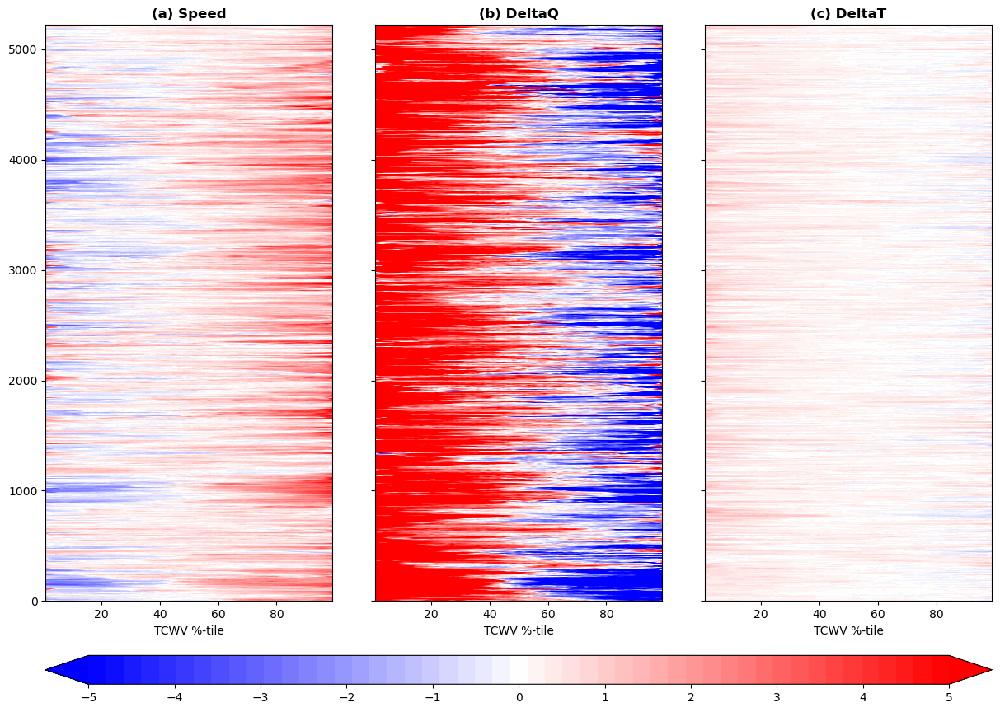

In [29]:
rev_input_hov['DeltaQ'] = rev_input_hov['DeltaQ']*10000
hov_plot_states(varis1,rev_input_hovx,rev_input_hov,'Reversals_input',np.linspace(-5,5,50),np.arange(-5,5.1,1),[])


## JJA

### Neural Net

In [30]:
#### Dates for Reversals!
##Rev
time_rev_JJA = sel_season(df_rev,6,7,8)
sta_date,end_date = '2016-01-01 00:00:00','2019-12-31 23:00:00'
JJA_rev_hov,JJA_rev_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                           time_rev_JJA,sta_date,end_date)

Date: 2016-06-19 18:00:00
Date: 2016-06-19 19:00:00
Date: 2016-06-19 20:00:00
Date: 2016-06-19 21:00:00
Date: 2016-06-19 22:00:00
Date: 2016-06-19 23:00:00
Date: 2016-06-20 00:00:00
Date: 2016-06-20 01:00:00
Date: 2016-06-20 02:00:00
Date: 2016-06-20 03:00:00
Date: 2016-06-20 04:00:00
Date: 2016-06-20 05:00:00
Date: 2016-06-20 06:00:00
Date: 2016-06-20 07:00:00
Date: 2016-06-20 08:00:00
Date: 2016-06-20 09:00:00
Date: 2016-06-20 10:00:00
Date: 2016-06-20 11:00:00
Date: 2016-06-20 12:00:00
Date: 2016-06-20 13:00:00
Date: 2016-06-20 14:00:00
Date: 2016-06-20 15:00:00
Date: 2016-06-20 16:00:00
Date: 2016-06-20 17:00:00
Date: 2016-06-20 18:00:00
Date: 2016-06-20 19:00:00
Date: 2016-06-20 20:00:00
Date: 2016-06-20 21:00:00
Date: 2016-06-20 22:00:00
Date: 2016-06-20 23:00:00
Date: 2016-06-21 00:00:00
Date: 2016-06-21 01:00:00
Date: 2016-06-21 02:00:00
Date: 2016-06-21 03:00:00
Date: 2016-06-21 04:00:00
Date: 2016-06-21 05:00:00
Date: 2016-06-21 06:00:00
Date: 2016-06-21 07:00:00
Date: 2016-0

Date: 2016-07-30 09:00:00
Date: 2016-07-30 10:00:00
Date: 2016-07-30 11:00:00
Date: 2016-07-30 12:00:00
Date: 2016-07-30 13:00:00
Date: 2016-07-30 14:00:00
Date: 2016-07-30 15:00:00
Date: 2016-07-30 16:00:00
Date: 2016-07-30 17:00:00
Date: 2016-07-30 18:00:00
Date: 2016-07-30 19:00:00
Date: 2016-07-30 20:00:00
Date: 2016-07-30 21:00:00
Date: 2016-07-30 22:00:00
Date: 2016-07-30 23:00:00
Date: 2016-07-31 00:00:00
Date: 2016-07-31 01:00:00
Date: 2016-07-31 02:00:00
Date: 2016-07-31 03:00:00
Date: 2016-07-31 04:00:00
Date: 2016-07-31 05:00:00
Date: 2016-07-31 06:00:00
Date: 2016-07-31 07:00:00
Date: 2016-08-11 22:00:00
Date: 2016-08-11 23:00:00
Date: 2016-08-12 00:00:00
Date: 2016-08-12 01:00:00
Date: 2016-08-12 02:00:00
Date: 2016-08-12 03:00:00
Date: 2016-08-12 04:00:00
Date: 2016-08-12 05:00:00
Date: 2016-08-12 06:00:00
Date: 2016-08-12 07:00:00
Date: 2016-08-12 08:00:00
Date: 2016-08-12 09:00:00
Date: 2016-08-12 10:00:00
Date: 2016-08-12 11:00:00
Date: 2016-08-12 12:00:00
Date: 2016-0

Date: 2016-08-30 09:00:00
Date: 2016-08-30 10:00:00
Date: 2016-08-30 11:00:00
Date: 2016-08-30 12:00:00
Date: 2016-08-30 13:00:00
Date: 2016-08-30 14:00:00
Date: 2016-08-30 15:00:00
Date: 2016-08-30 16:00:00
Date: 2016-08-30 17:00:00
Date: 2016-08-30 18:00:00
Date: 2016-08-30 19:00:00
Date: 2016-08-30 20:00:00
Date: 2016-08-30 21:00:00
Date: 2016-08-30 22:00:00
Date: 2016-08-30 23:00:00
Date: 2016-08-31 00:00:00
Date: 2016-08-31 01:00:00
Date: 2016-08-31 02:00:00
Date: 2016-08-31 03:00:00
Date: 2016-08-31 04:00:00
Date: 2016-08-31 05:00:00
Date: 2016-08-31 06:00:00
Date: 2016-08-31 07:00:00
Date: 2016-08-31 08:00:00
Date: 2016-08-31 09:00:00
Date: 2016-08-31 10:00:00
Date: 2016-08-31 11:00:00
Date: 2016-08-31 12:00:00
Date: 2016-08-31 13:00:00
Date: 2016-08-31 14:00:00
Date: 2016-08-31 15:00:00
Date: 2016-08-31 16:00:00
Date: 2016-08-31 17:00:00
Date: 2016-08-31 18:00:00
Date: 2016-08-31 19:00:00
Date: 2016-08-31 20:00:00
Date: 2016-08-31 21:00:00
Date: 2016-08-31 22:00:00
Date: 2016-0

Date: 2018-07-27 09:00:00
Date: 2018-07-27 10:00:00
Date: 2018-07-27 11:00:00
Date: 2018-07-27 12:00:00
Date: 2018-07-27 13:00:00
Date: 2018-07-27 14:00:00
Date: 2018-07-27 15:00:00
Date: 2018-07-27 16:00:00
Date: 2018-07-27 17:00:00
Date: 2018-07-27 18:00:00
Date: 2018-07-27 19:00:00
Date: 2018-07-27 20:00:00
Date: 2018-07-27 21:00:00
Date: 2018-07-27 22:00:00
Date: 2018-07-27 23:00:00
Date: 2018-07-28 00:00:00
Date: 2018-07-28 01:00:00
Date: 2018-07-28 02:00:00
Date: 2018-07-28 03:00:00
Date: 2018-07-28 04:00:00
Date: 2018-07-28 05:00:00
Date: 2018-07-28 06:00:00
Date: 2018-07-28 07:00:00
Date: 2018-07-28 08:00:00
Date: 2018-07-28 09:00:00
Date: 2018-07-28 10:00:00
Date: 2018-07-28 11:00:00
Date: 2018-07-28 12:00:00
Date: 2018-07-28 13:00:00
Date: 2018-07-28 14:00:00
Date: 2018-07-28 15:00:00
Date: 2018-07-28 16:00:00
Date: 2018-07-28 17:00:00
Date: 2018-07-28 18:00:00
Date: 2018-07-28 19:00:00
Date: 2018-07-28 20:00:00
Date: 2018-07-28 21:00:00
Date: 2018-07-28 22:00:00
Date: 2018-0

Date: 2018-08-14 19:00:00
Date: 2018-08-14 20:00:00
Date: 2018-08-14 21:00:00
Date: 2018-08-14 22:00:00
Date: 2018-08-14 23:00:00
Date: 2018-08-15 00:00:00
Date: 2018-08-15 01:00:00
Date: 2018-08-15 02:00:00
Date: 2018-08-15 03:00:00
Date: 2018-08-15 04:00:00
Date: 2018-08-15 05:00:00
Date: 2018-08-15 06:00:00
Date: 2018-08-15 07:00:00
Date: 2018-08-15 08:00:00
Date: 2018-08-15 09:00:00
Date: 2018-08-15 10:00:00
Date: 2018-08-15 11:00:00
Date: 2018-08-15 12:00:00
Date: 2018-08-15 13:00:00
Date: 2018-08-15 14:00:00
Date: 2018-08-15 15:00:00
Date: 2018-08-15 16:00:00
Date: 2018-08-15 17:00:00
Date: 2018-08-15 18:00:00
Date: 2018-08-15 19:00:00
Date: 2018-08-15 20:00:00
Date: 2018-08-15 21:00:00
Date: 2018-08-15 22:00:00
Date: 2018-08-15 23:00:00
Date: 2018-08-16 00:00:00
Date: 2018-08-16 01:00:00
Date: 2018-08-16 02:00:00
Date: 2018-08-16 03:00:00
Date: 2018-08-16 04:00:00
Date: 2018-08-16 05:00:00
Date: 2018-08-16 06:00:00
Date: 2018-08-16 07:00:00
Date: 2018-08-16 08:00:00
Date: 2018-0

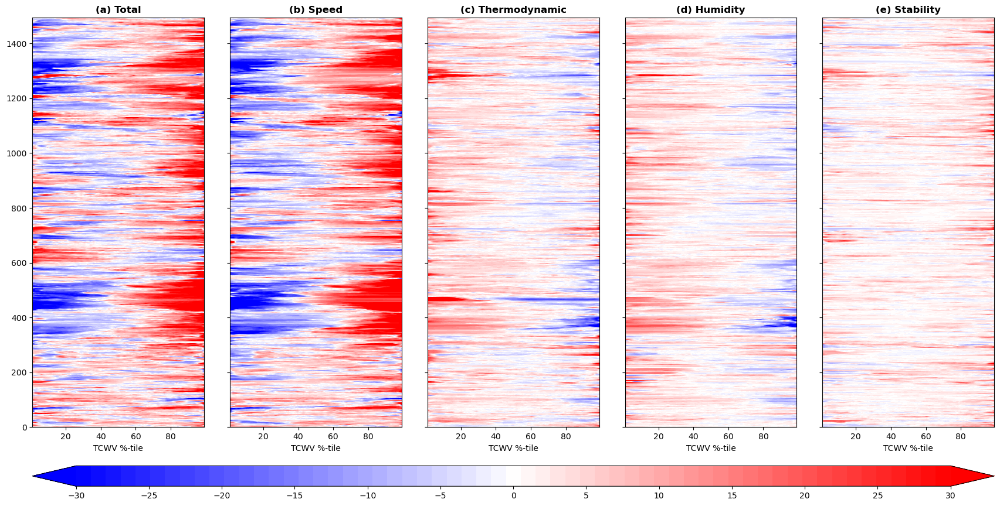

In [31]:
hov_plot_states(varis,JJA_rev_hovx,JJA_rev_hov,'Reversals_JJA',levels,ticks,[])

### Inputs, so raw variables

In [32]:
JJA_rev_input_hov,JJA_rev_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                                    time_rev_JJA,sta_date,end_date)

Date: 2016-06-19 18:00:00
Date: 2016-06-19 19:00:00
Date: 2016-06-19 20:00:00
Date: 2016-06-19 21:00:00
Date: 2016-06-19 22:00:00
Date: 2016-06-19 23:00:00
Date: 2016-06-20 00:00:00
Date: 2016-06-20 01:00:00
Date: 2016-06-20 02:00:00
Date: 2016-06-20 03:00:00
Date: 2016-06-20 04:00:00
Date: 2016-06-20 05:00:00
Date: 2016-06-20 06:00:00
Date: 2016-06-20 07:00:00
Date: 2016-06-20 08:00:00
Date: 2016-06-20 09:00:00
Date: 2016-06-20 10:00:00
Date: 2016-06-20 11:00:00
Date: 2016-06-20 12:00:00
Date: 2016-06-20 13:00:00
Date: 2016-06-20 14:00:00
Date: 2016-06-20 15:00:00
Date: 2016-06-20 16:00:00
Date: 2016-06-20 17:00:00
Date: 2016-06-20 18:00:00
Date: 2016-06-20 19:00:00
Date: 2016-06-20 20:00:00
Date: 2016-06-20 21:00:00
Date: 2016-06-20 22:00:00
Date: 2016-06-20 23:00:00
Date: 2016-06-21 00:00:00
Date: 2016-06-21 01:00:00
Date: 2016-06-21 02:00:00
Date: 2016-06-21 03:00:00
Date: 2016-06-21 04:00:00
Date: 2016-06-21 05:00:00
Date: 2016-06-21 06:00:00
Date: 2016-06-21 07:00:00
Date: 2016-0

Date: 2016-08-14 17:00:00
Date: 2016-08-14 18:00:00
Date: 2016-08-14 19:00:00
Date: 2016-08-14 20:00:00
Date: 2016-08-14 21:00:00
Date: 2016-08-14 22:00:00
Date: 2016-08-14 23:00:00
Date: 2016-08-15 00:00:00
Date: 2016-08-15 01:00:00
Date: 2016-08-15 02:00:00
Date: 2016-08-16 00:00:00
Date: 2016-08-16 01:00:00
Date: 2016-08-16 02:00:00
Date: 2016-08-16 03:00:00
Date: 2016-08-16 04:00:00
Date: 2016-08-16 05:00:00
Date: 2016-08-16 06:00:00
Date: 2016-08-16 07:00:00
Date: 2016-08-16 08:00:00
Date: 2016-08-16 09:00:00
Date: 2016-08-16 10:00:00
Date: 2016-08-16 11:00:00
Date: 2016-08-16 12:00:00
Date: 2016-08-16 13:00:00
Date: 2016-08-16 14:00:00
Date: 2016-08-16 15:00:00
Date: 2016-08-16 16:00:00
Date: 2016-08-16 17:00:00
Date: 2016-08-16 18:00:00
Date: 2016-08-16 19:00:00
Date: 2016-08-16 20:00:00
Date: 2016-08-16 21:00:00
Date: 2016-08-16 22:00:00
Date: 2016-08-16 23:00:00
Date: 2016-08-17 00:00:00
Date: 2016-08-17 01:00:00
Date: 2016-08-17 02:00:00
Date: 2016-08-17 03:00:00
Date: 2016-0

Date: 2018-06-21 15:00:00
Date: 2018-06-21 16:00:00
Date: 2018-06-21 17:00:00
Date: 2018-06-21 18:00:00
Date: 2018-06-21 19:00:00
Date: 2018-06-21 20:00:00
Date: 2018-06-21 21:00:00
Date: 2018-06-21 22:00:00
Date: 2018-06-21 23:00:00
Date: 2018-06-22 00:00:00
Date: 2018-06-22 01:00:00
Date: 2018-06-22 02:00:00
Date: 2018-06-22 03:00:00
Date: 2018-06-22 04:00:00
Date: 2018-06-22 05:00:00
Date: 2018-06-22 06:00:00
Date: 2018-06-22 07:00:00
Date: 2018-06-22 08:00:00
Date: 2018-06-22 09:00:00
Date: 2018-06-22 10:00:00
Date: 2018-06-22 11:00:00
Date: 2018-06-22 12:00:00
Date: 2018-07-11 05:00:00
Date: 2018-07-11 06:00:00
Date: 2018-07-11 07:00:00
Date: 2018-07-11 08:00:00
Date: 2018-07-11 09:00:00
Date: 2018-07-11 10:00:00
Date: 2018-07-11 11:00:00
Date: 2018-07-11 12:00:00
Date: 2018-07-11 13:00:00
Date: 2018-07-11 14:00:00
Date: 2018-07-11 15:00:00
Date: 2018-07-11 16:00:00
Date: 2018-07-11 17:00:00
Date: 2018-07-11 18:00:00
Date: 2018-07-11 19:00:00
Date: 2018-07-11 20:00:00
Date: 2018-0

Date: 2018-08-05 03:00:00
Date: 2018-08-05 04:00:00
Date: 2018-08-05 05:00:00
Date: 2018-08-05 06:00:00
Date: 2018-08-05 07:00:00
Date: 2018-08-05 08:00:00
Date: 2018-08-05 09:00:00
Date: 2018-08-05 10:00:00
Date: 2018-08-05 11:00:00
Date: 2018-08-05 12:00:00
Date: 2018-08-05 13:00:00
Date: 2018-08-05 14:00:00
Date: 2018-08-05 15:00:00
Date: 2018-08-05 16:00:00
Date: 2018-08-05 17:00:00
Date: 2018-08-05 18:00:00
Date: 2018-08-05 19:00:00
Date: 2018-08-05 20:00:00
Date: 2018-08-05 21:00:00
Date: 2018-08-05 22:00:00
Date: 2018-08-09 16:00:00
Date: 2018-08-09 17:00:00
Date: 2018-08-09 18:00:00
Date: 2018-08-09 19:00:00
Date: 2018-08-09 20:00:00
Date: 2018-08-09 21:00:00
Date: 2018-08-09 22:00:00
Date: 2018-08-09 23:00:00
Date: 2018-08-10 00:00:00
Date: 2018-08-10 01:00:00
Date: 2018-08-10 02:00:00
Date: 2018-08-10 03:00:00
Date: 2018-08-10 04:00:00
Date: 2018-08-10 05:00:00
Date: 2018-08-10 06:00:00
Date: 2018-08-10 07:00:00
Date: 2018-08-10 08:00:00
Date: 2018-08-10 09:00:00
Date: 2018-0

Date: 2019-07-23 14:00:00
Date: 2019-07-23 15:00:00
Date: 2019-07-23 16:00:00
Date: 2019-07-23 17:00:00
Date: 2019-07-23 18:00:00
Date: 2019-07-23 19:00:00
Date: 2019-07-23 20:00:00
Date: 2019-07-23 21:00:00
Date: 2019-07-23 22:00:00
Date: 2019-07-23 23:00:00
Date: 2019-08-29 19:00:00
Date: 2019-08-29 20:00:00
Date: 2019-08-29 21:00:00
Date: 2019-08-29 22:00:00
Date: 2019-08-29 23:00:00
Date: 2019-08-30 00:00:00
Date: 2019-08-30 01:00:00
Date: 2019-08-30 02:00:00
Date: 2019-08-30 03:00:00
Date: 2019-08-30 04:00:00
Date: 2019-08-30 05:00:00
Date: 2019-08-30 06:00:00
Date: 2019-08-30 07:00:00
Date: 2019-08-30 08:00:00
Date: 2019-08-30 09:00:00
Date: 2019-08-30 10:00:00
Date: 2019-08-30 11:00:00
Date: 2019-08-30 12:00:00
Date: 2019-08-30 13:00:00
Date: 2019-08-30 14:00:00
Date: 2019-08-30 15:00:00
Date: 2019-08-30 16:00:00
Date: 2019-08-30 17:00:00
Date: 2019-08-30 18:00:00
Date: 2019-08-30 19:00:00
Date: 2019-08-30 20:00:00
Date: 2019-08-30 21:00:00
Date: 2019-08-30 22:00:00
Date: 2019-0

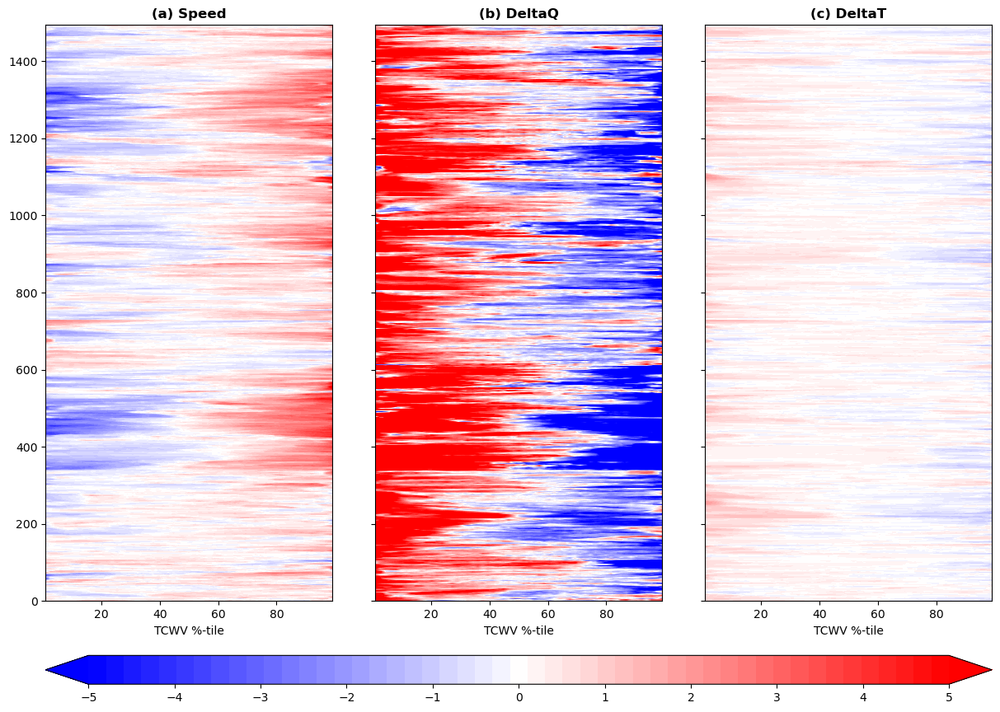

In [33]:
JJA_rev_input_hov['DeltaQ'] = JJA_rev_input_hov['DeltaQ']*10000
hov_plot_states(varis1,JJA_rev_input_hovx,JJA_rev_input_hov,'Reversals_JJA_input',
                np.linspace(-5,5,50),np.arange(-5,5.1,1),[])

## MAM

### Neural Net

In [34]:
#### Dates for Reversals!
##Rev
time_rev_MAM = sel_season(df_rev,3,4,5)
sta_date,end_date = '2016-01-01 00:00:00','2019-12-31 23:00:00'
MAM_rev_hov,MAM_rev_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                           time_rev_MAM,sta_date,end_date)

Date: 2016-04-18 05:00:00
Date: 2016-04-18 06:00:00
Date: 2016-04-18 07:00:00
Date: 2016-04-18 08:00:00
Date: 2016-04-18 09:00:00
Date: 2016-04-18 10:00:00
Date: 2016-04-18 11:00:00
Date: 2016-04-18 12:00:00
Date: 2016-04-18 13:00:00
Date: 2016-04-18 14:00:00
Date: 2016-04-18 15:00:00
Date: 2016-04-18 16:00:00
Date: 2016-04-18 17:00:00
Date: 2016-04-18 18:00:00
Date: 2016-04-18 19:00:00
Date: 2016-04-18 20:00:00
Date: 2016-04-18 21:00:00
Date: 2016-04-18 22:00:00
Date: 2016-04-18 23:00:00
Date: 2016-04-19 00:00:00
Date: 2016-04-19 01:00:00
Date: 2016-04-19 02:00:00
Date: 2016-04-19 03:00:00
Date: 2016-04-19 04:00:00
Date: 2016-04-19 05:00:00
Date: 2016-04-19 06:00:00
Date: 2016-04-19 07:00:00
Date: 2016-04-19 08:00:00
Date: 2016-04-19 09:00:00
Date: 2016-04-19 10:00:00
Date: 2016-04-19 11:00:00
Date: 2016-04-19 12:00:00
Date: 2016-04-19 13:00:00
Date: 2016-04-19 14:00:00
Date: 2016-04-19 15:00:00
Date: 2016-04-19 16:00:00
Date: 2016-04-19 17:00:00
Date: 2016-04-19 18:00:00
Date: 2016-0

Date: 2016-05-19 05:00:00
Date: 2016-05-19 06:00:00
Date: 2016-05-19 07:00:00
Date: 2016-05-19 08:00:00
Date: 2016-05-19 09:00:00
Date: 2016-05-19 10:00:00
Date: 2016-05-19 11:00:00
Date: 2016-05-19 12:00:00
Date: 2016-05-19 13:00:00
Date: 2016-05-19 14:00:00
Date: 2016-05-19 15:00:00
Date: 2016-05-19 16:00:00
Date: 2016-05-19 17:00:00
Date: 2016-05-19 18:00:00
Date: 2016-05-19 19:00:00
Date: 2016-05-19 20:00:00
Date: 2016-05-19 21:00:00
Date: 2016-05-19 22:00:00
Date: 2016-05-19 23:00:00
Date: 2016-05-20 00:00:00
Date: 2016-05-20 01:00:00
Date: 2016-05-20 02:00:00
Date: 2016-05-20 03:00:00
Date: 2016-05-20 04:00:00
Date: 2016-05-20 05:00:00
Date: 2016-05-20 06:00:00
Date: 2016-05-20 07:00:00
Date: 2016-05-20 08:00:00
Date: 2016-05-20 09:00:00
Date: 2016-05-20 10:00:00
Date: 2016-05-20 11:00:00
Date: 2016-05-20 12:00:00
Date: 2016-05-20 13:00:00
Date: 2016-05-20 14:00:00
Date: 2016-05-20 15:00:00
Date: 2016-05-20 16:00:00
Date: 2016-05-20 17:00:00
Date: 2016-05-20 18:00:00
Date: 2016-0

Date: 2017-04-27 01:00:00
Date: 2017-04-27 02:00:00
Date: 2017-04-27 03:00:00
Date: 2017-04-27 04:00:00
Date: 2017-04-27 05:00:00
Date: 2017-04-27 06:00:00
Date: 2017-04-27 07:00:00
Date: 2017-04-27 08:00:00
Date: 2017-04-27 09:00:00
Date: 2017-04-27 10:00:00
Date: 2017-04-27 11:00:00
Date: 2017-04-27 12:00:00
Date: 2017-04-27 13:00:00
Date: 2017-04-27 14:00:00
Date: 2017-04-27 15:00:00
Date: 2017-04-27 16:00:00
Date: 2017-04-27 17:00:00
Date: 2017-04-27 18:00:00
Date: 2017-04-27 19:00:00
Date: 2017-04-27 20:00:00
Date: 2017-04-27 21:00:00
Date: 2017-04-27 22:00:00
Date: 2017-04-27 23:00:00
Date: 2017-04-28 00:00:00
Date: 2017-04-28 01:00:00
Date: 2017-04-28 02:00:00
Date: 2017-04-28 03:00:00
Date: 2017-04-28 04:00:00
Date: 2017-04-28 05:00:00
Date: 2017-04-28 06:00:00
Date: 2017-04-28 07:00:00
Date: 2017-04-28 08:00:00
Date: 2017-04-28 09:00:00
Date: 2017-04-28 10:00:00
Date: 2017-04-28 11:00:00
Date: 2017-04-28 12:00:00
Date: 2018-03-14 12:00:00
Date: 2018-03-14 13:00:00
Date: 2018-0

Date: 2019-04-06 06:00:00
Date: 2019-04-06 07:00:00
Date: 2019-04-06 08:00:00
Date: 2019-04-06 09:00:00
Date: 2019-04-06 10:00:00
Date: 2019-04-06 11:00:00
Date: 2019-04-06 12:00:00
Date: 2019-04-06 13:00:00
Date: 2019-04-06 14:00:00
Date: 2019-04-06 15:00:00
Date: 2019-04-06 16:00:00
Date: 2019-04-06 17:00:00
Date: 2019-04-06 18:00:00
Date: 2019-04-06 19:00:00
Date: 2019-04-06 20:00:00
Date: 2019-04-06 21:00:00
Date: 2019-04-06 22:00:00
Date: 2019-04-06 23:00:00
Date: 2019-04-07 00:00:00
Date: 2019-04-07 01:00:00
Date: 2019-04-07 02:00:00
Date: 2019-04-07 03:00:00
Date: 2019-04-07 04:00:00
Date: 2019-04-07 05:00:00
Date: 2019-04-07 06:00:00
Date: 2019-04-07 07:00:00
Date: 2019-04-07 08:00:00
Date: 2019-04-07 09:00:00
Date: 2019-04-07 10:00:00
Date: 2019-04-07 11:00:00
Date: 2019-04-07 12:00:00
Date: 2019-04-07 13:00:00
Date: 2019-05-05 13:00:00
Date: 2019-05-05 14:00:00
Date: 2019-05-05 15:00:00
Date: 2019-05-05 16:00:00
Date: 2019-05-05 17:00:00
Date: 2019-05-05 18:00:00
Date: 2019-0

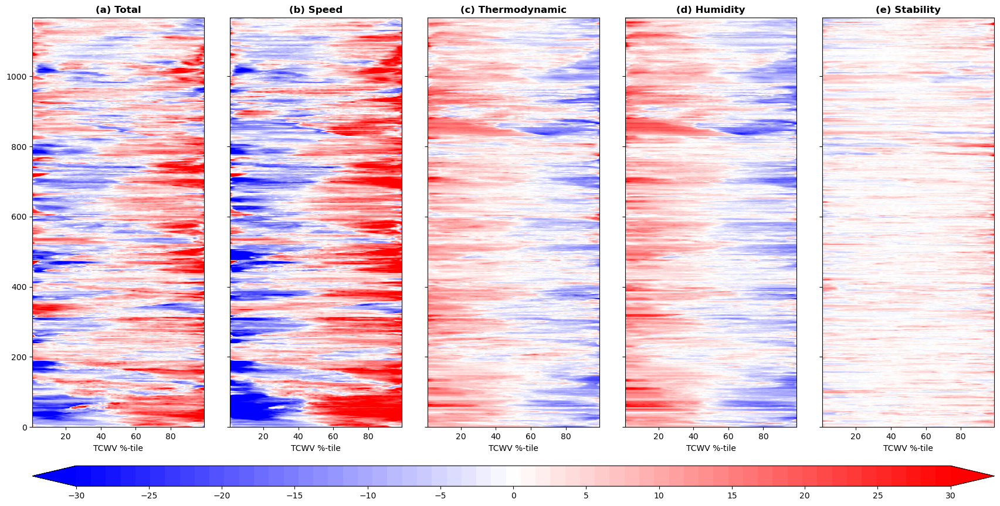

In [35]:
hov_plot_states(varis,MAM_rev_hovx,MAM_rev_hov,'Reversals_MAM',levels,ticks,[])

### Input, so raw variables

In [36]:
MAM_rev_input_hov,MAM_rev_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                                    time_rev_MAM,sta_date,end_date)

Date: 2016-04-18 05:00:00
Date: 2016-04-18 06:00:00
Date: 2016-04-18 07:00:00
Date: 2016-04-18 08:00:00
Date: 2016-04-18 09:00:00
Date: 2016-04-18 10:00:00
Date: 2016-04-18 11:00:00
Date: 2016-04-18 12:00:00
Date: 2016-04-18 13:00:00
Date: 2016-04-18 14:00:00
Date: 2016-04-18 15:00:00
Date: 2016-04-18 16:00:00
Date: 2016-04-18 17:00:00
Date: 2016-04-18 18:00:00
Date: 2016-04-18 19:00:00
Date: 2016-04-18 20:00:00
Date: 2016-04-18 21:00:00
Date: 2016-04-18 22:00:00
Date: 2016-04-18 23:00:00
Date: 2016-04-19 00:00:00
Date: 2016-04-19 01:00:00
Date: 2016-04-19 02:00:00
Date: 2016-04-19 03:00:00
Date: 2016-04-19 04:00:00
Date: 2016-04-19 05:00:00
Date: 2016-04-19 06:00:00
Date: 2016-04-19 07:00:00
Date: 2016-04-19 08:00:00
Date: 2016-04-19 09:00:00
Date: 2016-04-19 10:00:00
Date: 2016-04-19 11:00:00
Date: 2016-04-19 12:00:00
Date: 2016-04-19 13:00:00
Date: 2016-04-19 14:00:00
Date: 2016-04-19 15:00:00
Date: 2016-04-19 16:00:00
Date: 2016-04-19 17:00:00
Date: 2016-04-19 18:00:00
Date: 2016-0

Date: 2016-05-22 13:00:00
Date: 2016-05-22 14:00:00
Date: 2016-05-22 15:00:00
Date: 2016-05-22 16:00:00
Date: 2016-05-22 17:00:00
Date: 2016-05-22 18:00:00
Date: 2016-05-22 19:00:00
Date: 2016-05-22 20:00:00
Date: 2016-05-22 21:00:00
Date: 2016-05-22 22:00:00
Date: 2016-05-22 23:00:00
Date: 2016-05-23 00:00:00
Date: 2016-05-23 01:00:00
Date: 2016-05-23 02:00:00
Date: 2016-05-24 15:00:00
Date: 2016-05-24 16:00:00
Date: 2016-05-24 17:00:00
Date: 2016-05-24 18:00:00
Date: 2016-05-24 19:00:00
Date: 2016-05-24 20:00:00
Date: 2016-05-24 21:00:00
Date: 2016-05-24 22:00:00
Date: 2016-05-24 23:00:00
Date: 2016-05-25 00:00:00
Date: 2016-05-25 01:00:00
Date: 2016-05-25 02:00:00
Date: 2016-05-25 03:00:00
Date: 2016-05-25 04:00:00
Date: 2016-05-25 05:00:00
Date: 2016-05-25 06:00:00
Date: 2016-05-25 07:00:00
Date: 2016-05-25 08:00:00
Date: 2016-05-25 09:00:00
Date: 2016-05-25 10:00:00
Date: 2016-05-25 11:00:00
Date: 2016-05-25 12:00:00
Date: 2016-05-25 13:00:00
Date: 2016-05-25 14:00:00
Date: 2016-0

Date: 2018-03-16 11:00:00
Date: 2018-03-16 12:00:00
Date: 2018-03-16 13:00:00
Date: 2018-03-16 14:00:00
Date: 2018-03-16 15:00:00
Date: 2018-03-16 16:00:00
Date: 2018-03-16 17:00:00
Date: 2018-03-16 18:00:00
Date: 2018-03-24 18:00:00
Date: 2018-03-24 19:00:00
Date: 2018-03-24 20:00:00
Date: 2018-03-24 21:00:00
Date: 2018-03-24 22:00:00
Date: 2018-03-24 23:00:00
Date: 2018-03-25 00:00:00
Date: 2018-03-25 01:00:00
Date: 2018-03-25 02:00:00
Date: 2018-03-25 03:00:00
Date: 2018-03-25 04:00:00
Date: 2018-03-25 05:00:00
Date: 2018-03-25 06:00:00
Date: 2018-03-25 07:00:00
Date: 2018-03-25 08:00:00
Date: 2018-03-25 09:00:00
Date: 2018-03-25 10:00:00
Date: 2018-03-25 11:00:00
Date: 2018-03-25 12:00:00
Date: 2018-03-25 13:00:00
Date: 2018-03-25 14:00:00
Date: 2018-03-25 15:00:00
Date: 2018-03-25 16:00:00
Date: 2018-03-25 17:00:00
Date: 2018-03-25 18:00:00
Date: 2018-03-25 19:00:00
Date: 2018-03-25 20:00:00
Date: 2018-03-25 21:00:00
Date: 2018-03-25 22:00:00
Date: 2018-03-25 23:00:00
Date: 2018-0

Date: 2019-05-07 21:00:00
Date: 2019-05-07 22:00:00
Date: 2019-05-07 23:00:00
Date: 2019-05-08 00:00:00
Date: 2019-05-08 01:00:00
Date: 2019-05-08 02:00:00
Date: 2019-05-08 03:00:00
Date: 2019-05-08 04:00:00
Date: 2019-05-08 05:00:00
Date: 2019-05-08 06:00:00
Date: 2019-05-08 07:00:00
Date: 2019-05-08 08:00:00
Date: 2019-05-08 09:00:00
Date: 2019-05-08 10:00:00
Date: 2019-05-08 11:00:00
Date: 2019-05-08 12:00:00
Date: 2019-05-08 13:00:00
Date: 2019-05-08 14:00:00
Date: 2019-05-08 15:00:00
Date: 2019-05-08 16:00:00
Date: 2019-05-08 17:00:00
Date: 2019-05-08 18:00:00
Date: 2019-05-08 19:00:00
Date: 2019-05-08 20:00:00
Date: 2019-05-08 21:00:00
Date: 2019-05-08 22:00:00
Date: 2019-05-08 23:00:00
Date: 2019-05-09 00:00:00
Date: 2019-05-09 01:00:00
Date: 2019-05-09 02:00:00
Date: 2019-05-09 03:00:00
Date: 2019-05-09 04:00:00
Date: 2019-05-09 05:00:00
Date: 2019-05-09 06:00:00
Date: 2019-05-09 07:00:00
Date: 2019-05-09 08:00:00
Date: 2019-05-09 09:00:00
Date: 2019-05-09 10:00:00
Date: 2019-0

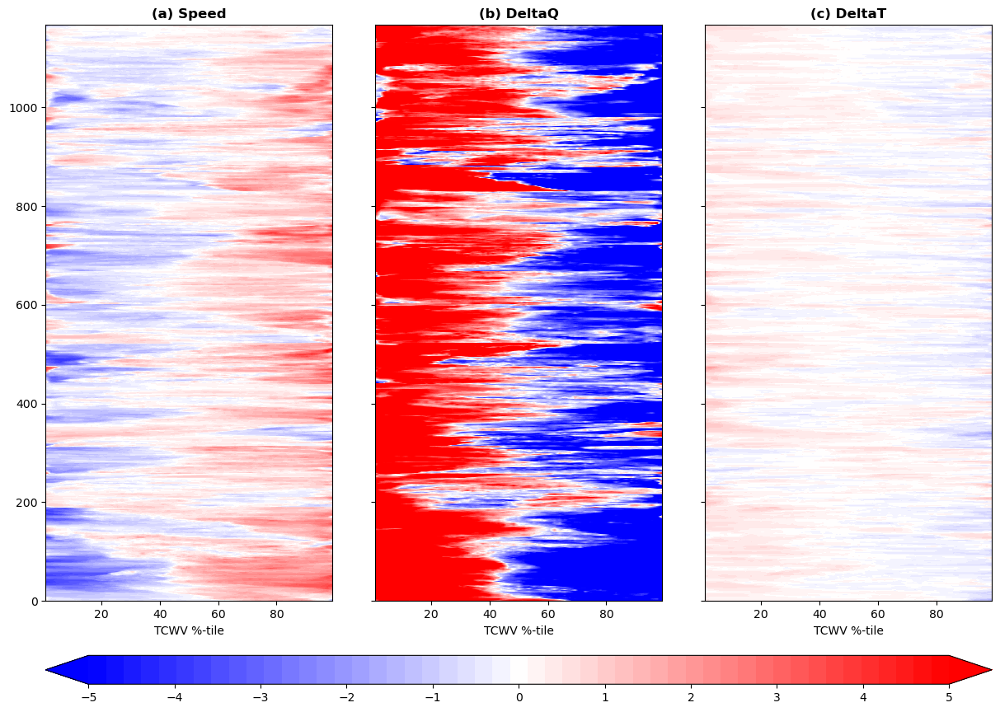

In [37]:
MAM_rev_input_hov['DeltaQ'] = MAM_rev_input_hov['DeltaQ']*10000
hov_plot_states(varis1,MAM_rev_input_hovx,MAM_rev_input_hov,'Reversals_MAM_inputs',
                np.linspace(-5,5,50),np.arange(-5,5.1,1),[])

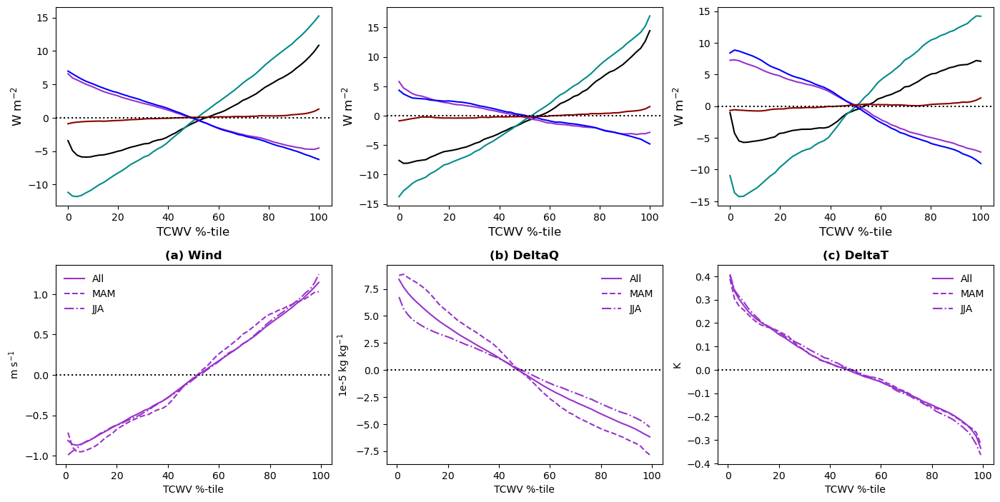

In [38]:
plt.figure(figsize=(16,8))
gs = gridspec.GridSpec(2,3, left=0.13, right=0.95, hspace=0.3, wspace=0.2, top=0.9, bottom=0.1)
ax=subplot(gs[0])
plot_means_line(varis,rev_hov,nx,'Reversals', '')
ax=subplot(gs[1])
plot_means_line(varis,JJA_rev_hov,nx,'Reversals_JJA', '')
ax=subplot(gs[2])
plot_means_line(varis,MAM_rev_hov,nx,'Reversals_MAM', '')

variabs = ['Wind','DeltaQ','DeltaT']
ylabel = ['m s$^{-1}$','1e-5 kg kg$^{-1}$','K']
titles = ['(a) Wind','(b) DeltaQ','(c) DeltaT']
colors = ['darkorchid','darkorchid','darkorchid']

for i,var in enumerate(variabs):
    ax=subplot(gs[i+3])
    plt.plot(rev_input_hovx,np.mean(rev_input_hov[var],axis=0), color = colors[i], 
             linestyle='-', label = 'All')
    plt.plot(MAM_rev_input_hovx,np.mean(MAM_rev_input_hov[var],axis=0), color = colors[i], 
             linestyle='--', label = 'MAM')
    plt.plot(JJA_rev_input_hovx,np.mean(JJA_rev_input_hov[var],axis=0), color = colors[i], 
             linestyle='-.', label = 'JJA')
    plt.xlabel('TCWV %-tile')
    plt.ylabel(ylabel[i])
    plt.title(titles[i], fontweight='bold')
    plt.legend(frameon=False)
    plt.axhline(0,linestyle=':', color = 'k')

# Organised

## All

### Neural Net

In [39]:
#### Dates for Organised!
##Org
df_org = pd.read_csv('../../NN_real/Area_2-9_135-145_ERA5/Dates_2-9_135-145_organised.csv',
                 parse_dates=True,index_col=0)
time_org = df_org.index.strftime('%Y-%m-%d %H:%M:%S').values
sta_date,end_date = '2016-01-01 00:00:00','2019-12-31 23:00:00'
org_hov,org_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                   time_org,sta_date,end_date)

Date: 2016-01-01 00:00:00
Date: 2016-01-01 01:00:00
Date: 2016-01-01 02:00:00
Date: 2016-01-01 03:00:00
Date: 2016-01-01 04:00:00
Date: 2016-01-01 05:00:00
Date: 2016-01-01 06:00:00
Date: 2016-01-01 07:00:00
Date: 2016-01-01 08:00:00
Date: 2016-01-01 09:00:00
Date: 2016-01-01 10:00:00
Date: 2016-01-01 11:00:00
Date: 2016-01-01 12:00:00
Date: 2016-01-01 13:00:00
Date: 2016-01-01 14:00:00
Date: 2016-01-01 15:00:00
Date: 2016-01-01 16:00:00
Date: 2016-01-01 17:00:00
Date: 2016-01-01 18:00:00
Date: 2016-01-01 19:00:00
Date: 2016-01-01 20:00:00
Date: 2016-01-01 21:00:00
Date: 2016-01-01 22:00:00
Date: 2016-01-01 23:00:00
Date: 2016-01-02 00:00:00
Date: 2016-01-02 01:00:00
Date: 2016-01-02 02:00:00
Date: 2016-01-02 03:00:00
Date: 2016-01-02 04:00:00
Date: 2016-01-02 05:00:00
Date: 2016-01-02 06:00:00
Date: 2016-01-02 07:00:00
Date: 2016-01-02 08:00:00
Date: 2016-01-02 09:00:00
Date: 2016-01-02 10:00:00
Date: 2016-01-02 11:00:00
Date: 2016-01-02 12:00:00
Date: 2016-01-02 13:00:00
Date: 2016-0

Date: 2016-01-21 17:00:00
Date: 2016-01-21 18:00:00
Date: 2016-01-21 19:00:00
Date: 2016-01-21 20:00:00
Date: 2016-01-21 21:00:00
Date: 2016-01-21 22:00:00
Date: 2016-01-21 23:00:00
Date: 2016-01-22 00:00:00
Date: 2016-01-22 01:00:00
Date: 2016-01-22 02:00:00
Date: 2016-01-22 03:00:00
Date: 2016-01-22 04:00:00
Date: 2016-01-22 05:00:00
Date: 2016-01-22 06:00:00
Date: 2016-01-22 07:00:00
Date: 2016-01-22 08:00:00
Date: 2016-01-22 09:00:00
Date: 2016-01-22 10:00:00
Date: 2016-01-22 11:00:00
Date: 2016-01-22 12:00:00
Date: 2016-01-22 13:00:00
Date: 2016-01-22 14:00:00
Date: 2016-01-22 15:00:00
Date: 2016-01-22 16:00:00
Date: 2016-01-24 11:00:00
Date: 2016-01-24 12:00:00
Date: 2016-01-24 13:00:00
Date: 2016-01-24 14:00:00
Date: 2016-01-24 15:00:00
Date: 2016-01-24 16:00:00
Date: 2016-01-24 17:00:00
Date: 2016-01-24 18:00:00
Date: 2016-01-24 19:00:00
Date: 2016-01-24 20:00:00
Date: 2016-01-24 21:00:00
Date: 2016-01-24 22:00:00
Date: 2016-01-24 23:00:00
Date: 2016-01-25 00:00:00
Date: 2016-0

Date: 2016-02-09 02:00:00
Date: 2016-02-09 03:00:00
Date: 2016-02-09 04:00:00
Date: 2016-02-09 05:00:00
Date: 2016-02-09 06:00:00
Date: 2016-02-09 07:00:00
Date: 2016-02-09 08:00:00
Date: 2016-02-09 09:00:00
Date: 2016-02-09 10:00:00
Date: 2016-02-09 11:00:00
Date: 2016-02-09 12:00:00
Date: 2016-02-09 13:00:00
Date: 2016-02-09 14:00:00
Date: 2016-02-09 15:00:00
Date: 2016-02-09 16:00:00
Date: 2016-02-09 17:00:00
Date: 2016-02-09 18:00:00
Date: 2016-02-09 19:00:00
Date: 2016-02-09 20:00:00
Date: 2016-02-09 21:00:00
Date: 2016-02-09 22:00:00
Date: 2016-02-09 23:00:00
Date: 2016-02-10 00:00:00
Date: 2016-02-10 01:00:00
Date: 2016-02-10 02:00:00
Date: 2016-02-10 03:00:00
Date: 2016-02-10 04:00:00
Date: 2016-02-10 05:00:00
Date: 2016-02-10 06:00:00
Date: 2016-02-10 07:00:00
Date: 2016-02-10 08:00:00
Date: 2016-02-10 09:00:00
Date: 2016-02-10 10:00:00
Date: 2016-02-10 11:00:00
Date: 2016-02-10 12:00:00
Date: 2016-02-10 13:00:00
Date: 2016-02-10 14:00:00
Date: 2016-02-10 15:00:00
Date: 2016-0

Date: 2016-03-02 11:00:00
Date: 2016-03-02 12:00:00
Date: 2016-03-02 13:00:00
Date: 2016-03-02 14:00:00
Date: 2016-03-02 15:00:00
Date: 2016-03-02 16:00:00
Date: 2016-03-02 17:00:00
Date: 2016-03-02 18:00:00
Date: 2016-03-02 19:00:00
Date: 2016-03-02 20:00:00
Date: 2016-03-02 21:00:00
Date: 2016-03-02 22:00:00
Date: 2016-03-02 23:00:00
Date: 2016-03-03 00:00:00
Date: 2016-03-03 01:00:00
Date: 2016-03-03 02:00:00
Date: 2016-03-03 03:00:00
Date: 2016-03-03 04:00:00
Date: 2016-03-03 05:00:00
Date: 2016-03-03 06:00:00
Date: 2016-03-03 07:00:00
Date: 2016-03-03 08:00:00
Date: 2016-03-03 09:00:00
Date: 2016-03-03 10:00:00
Date: 2016-03-03 11:00:00
Date: 2016-03-03 12:00:00
Date: 2016-03-03 13:00:00
Date: 2016-03-03 14:00:00
Date: 2016-03-03 15:00:00
Date: 2016-03-03 16:00:00
Date: 2016-03-03 17:00:00
Date: 2016-03-03 18:00:00
Date: 2016-03-03 19:00:00
Date: 2016-03-03 20:00:00
Date: 2016-03-03 21:00:00
Date: 2016-03-03 22:00:00
Date: 2016-03-03 23:00:00
Date: 2016-03-04 00:00:00
Date: 2016-0

Date: 2016-03-21 01:00:00
Date: 2016-03-21 02:00:00
Date: 2016-03-21 03:00:00
Date: 2016-03-21 04:00:00
Date: 2016-03-21 05:00:00
Date: 2016-03-21 06:00:00
Date: 2016-03-21 07:00:00
Date: 2016-03-21 08:00:00
Date: 2016-03-21 09:00:00
Date: 2016-03-21 10:00:00
Date: 2016-03-21 11:00:00
Date: 2016-03-21 12:00:00
Date: 2016-03-21 13:00:00
Date: 2016-03-21 14:00:00
Date: 2016-03-21 15:00:00
Date: 2016-03-21 16:00:00
Date: 2016-03-21 17:00:00
Date: 2016-03-21 18:00:00
Date: 2016-03-21 19:00:00
Date: 2016-03-21 20:00:00
Date: 2016-03-21 21:00:00
Date: 2016-03-21 22:00:00
Date: 2016-03-21 23:00:00
Date: 2016-03-22 00:00:00
Date: 2016-03-22 01:00:00
Date: 2016-03-22 02:00:00
Date: 2016-03-22 03:00:00
Date: 2016-03-22 04:00:00
Date: 2016-03-22 05:00:00
Date: 2016-03-22 06:00:00
Date: 2016-03-22 07:00:00
Date: 2016-03-22 08:00:00
Date: 2016-03-22 10:00:00
Date: 2016-03-22 11:00:00
Date: 2016-03-22 12:00:00
Date: 2016-03-22 13:00:00
Date: 2016-03-22 14:00:00
Date: 2016-03-22 15:00:00
Date: 2016-0

Date: 2016-04-09 10:00:00
Date: 2016-04-09 11:00:00
Date: 2016-04-09 12:00:00
Date: 2016-04-09 13:00:00
Date: 2016-04-09 14:00:00
Date: 2016-04-09 15:00:00
Date: 2016-04-09 16:00:00
Date: 2016-04-09 17:00:00
Date: 2016-04-09 18:00:00
Date: 2016-04-09 19:00:00
Date: 2016-04-09 20:00:00
Date: 2016-04-09 21:00:00
Date: 2016-04-09 22:00:00
Date: 2016-04-09 23:00:00
Date: 2016-04-10 00:00:00
Date: 2016-04-10 01:00:00
Date: 2016-04-10 02:00:00
Date: 2016-04-10 03:00:00
Date: 2016-04-10 04:00:00
Date: 2016-04-10 05:00:00
Date: 2016-04-10 06:00:00
Date: 2016-04-10 07:00:00
Date: 2016-04-10 08:00:00
Date: 2016-04-10 09:00:00
Date: 2016-04-10 10:00:00
Date: 2016-04-10 11:00:00
Date: 2016-04-10 12:00:00
Date: 2016-04-10 13:00:00
Date: 2016-04-10 14:00:00
Date: 2016-04-10 15:00:00
Date: 2016-04-10 16:00:00
Date: 2016-04-10 17:00:00
Date: 2016-04-10 18:00:00
Date: 2016-04-10 19:00:00
Date: 2016-04-10 20:00:00
Date: 2016-04-10 21:00:00
Date: 2016-04-10 22:00:00
Date: 2016-04-10 23:00:00
Date: 2016-0

Date: 2016-05-06 09:00:00
Date: 2016-05-06 10:00:00
Date: 2016-05-06 11:00:00
Date: 2016-05-06 12:00:00
Date: 2016-05-06 13:00:00
Date: 2016-05-06 14:00:00
Date: 2016-05-06 15:00:00
Date: 2016-05-06 16:00:00
Date: 2016-05-06 17:00:00
Date: 2016-05-06 18:00:00
Date: 2016-05-06 19:00:00
Date: 2016-05-06 20:00:00
Date: 2016-05-06 21:00:00
Date: 2016-05-06 22:00:00
Date: 2016-05-06 23:00:00
Date: 2016-05-07 00:00:00
Date: 2016-05-07 01:00:00
Date: 2016-05-07 02:00:00
Date: 2016-05-07 03:00:00
Date: 2016-05-07 04:00:00
Date: 2016-05-07 05:00:00
Date: 2016-05-07 06:00:00
Date: 2016-05-07 07:00:00
Date: 2016-05-07 08:00:00
Date: 2016-05-07 09:00:00
Date: 2016-05-07 10:00:00
Date: 2016-05-10 10:00:00
Date: 2016-05-10 11:00:00
Date: 2016-05-10 12:00:00
Date: 2016-05-10 13:00:00
Date: 2016-05-10 14:00:00
Date: 2016-05-10 15:00:00
Date: 2016-05-10 16:00:00
Date: 2016-05-10 17:00:00
Date: 2016-05-10 18:00:00
Date: 2016-05-10 19:00:00
Date: 2016-05-10 20:00:00
Date: 2016-05-10 21:00:00
Date: 2016-0

Date: 2016-05-30 05:00:00
Date: 2016-05-30 15:00:00
Date: 2016-05-30 16:00:00
Date: 2016-05-30 17:00:00
Date: 2016-05-30 18:00:00
Date: 2016-05-30 19:00:00
Date: 2016-05-30 20:00:00
Date: 2016-05-30 21:00:00
Date: 2016-05-30 22:00:00
Date: 2016-05-30 23:00:00
Date: 2016-05-31 00:00:00
Date: 2016-05-31 01:00:00
Date: 2016-05-31 02:00:00
Date: 2016-05-31 03:00:00
Date: 2016-05-31 04:00:00
Date: 2016-05-31 05:00:00
Date: 2016-05-31 06:00:00
Date: 2016-05-31 07:00:00
Date: 2016-05-31 08:00:00
Date: 2016-05-31 09:00:00
Date: 2016-05-31 10:00:00
Date: 2016-05-31 11:00:00
Date: 2016-05-31 12:00:00
Date: 2016-05-31 13:00:00
Date: 2016-05-31 14:00:00
Date: 2016-05-31 15:00:00
Date: 2016-05-31 16:00:00
Date: 2016-05-31 17:00:00
Date: 2016-05-31 18:00:00
Date: 2016-05-31 19:00:00
Date: 2016-05-31 20:00:00
Date: 2016-05-31 21:00:00
Date: 2016-05-31 22:00:00
Date: 2016-05-31 23:00:00
Date: 2016-06-01 00:00:00
Date: 2016-06-01 01:00:00
Date: 2016-06-01 02:00:00
Date: 2016-06-01 03:00:00
Date: 2016-0

Date: 2016-11-29 04:00:00
Date: 2016-11-29 05:00:00
Date: 2016-11-29 06:00:00
Date: 2016-11-29 07:00:00
Date: 2016-11-29 08:00:00
Date: 2016-11-29 09:00:00
Date: 2016-11-29 10:00:00
Date: 2016-11-29 11:00:00
Date: 2016-11-29 12:00:00
Date: 2016-11-29 13:00:00
Date: 2016-11-29 14:00:00
Date: 2016-11-29 15:00:00
Date: 2016-11-29 16:00:00
Date: 2016-11-29 17:00:00
Date: 2016-11-29 18:00:00
Date: 2016-11-29 19:00:00
Date: 2016-11-29 20:00:00
Date: 2016-11-29 21:00:00
Date: 2016-11-29 22:00:00
Date: 2016-11-29 23:00:00
Date: 2016-11-30 00:00:00
Date: 2016-11-30 01:00:00
Date: 2016-11-30 02:00:00
Date: 2016-11-30 03:00:00
Date: 2016-11-30 04:00:00
Date: 2016-11-30 05:00:00
Date: 2016-11-30 06:00:00
Date: 2016-11-30 07:00:00
Date: 2016-11-30 08:00:00
Date: 2016-11-30 09:00:00
Date: 2016-11-30 10:00:00
Date: 2016-11-30 11:00:00
Date: 2016-11-30 12:00:00
Date: 2016-11-30 13:00:00
Date: 2016-11-30 14:00:00
Date: 2016-11-30 15:00:00
Date: 2016-11-30 16:00:00
Date: 2016-11-30 17:00:00
Date: 2016-1

Date: 2016-12-17 21:00:00
Date: 2016-12-17 22:00:00
Date: 2016-12-17 23:00:00
Date: 2016-12-18 00:00:00
Date: 2016-12-18 01:00:00
Date: 2016-12-18 02:00:00
Date: 2016-12-18 03:00:00
Date: 2016-12-18 04:00:00
Date: 2016-12-18 05:00:00
Date: 2016-12-18 06:00:00
Date: 2016-12-18 07:00:00
Date: 2016-12-18 08:00:00
Date: 2016-12-18 09:00:00
Date: 2016-12-18 10:00:00
Date: 2016-12-18 11:00:00
Date: 2016-12-18 12:00:00
Date: 2016-12-18 13:00:00
Date: 2016-12-18 14:00:00
Date: 2016-12-18 15:00:00
Date: 2016-12-18 16:00:00
Date: 2016-12-18 17:00:00
Date: 2016-12-18 18:00:00
Date: 2016-12-18 19:00:00
Date: 2016-12-18 20:00:00
Date: 2016-12-18 21:00:00
Date: 2016-12-18 22:00:00
Date: 2016-12-18 23:00:00
Date: 2016-12-19 00:00:00
Date: 2016-12-19 01:00:00
Date: 2016-12-19 02:00:00
Date: 2016-12-19 03:00:00
Date: 2016-12-19 04:00:00
Date: 2016-12-19 05:00:00
Date: 2016-12-19 06:00:00
Date: 2016-12-19 07:00:00
Date: 2016-12-19 08:00:00
Date: 2016-12-19 09:00:00
Date: 2016-12-19 10:00:00
Date: 2016-1

Date: 2017-01-15 13:00:00
Date: 2017-01-15 14:00:00
Date: 2017-01-15 15:00:00
Date: 2017-01-15 16:00:00
Date: 2017-01-15 17:00:00
Date: 2017-01-15 18:00:00
Date: 2017-01-15 19:00:00
Date: 2017-01-15 20:00:00
Date: 2017-01-15 21:00:00
Date: 2017-01-15 22:00:00
Date: 2017-01-15 23:00:00
Date: 2017-01-16 00:00:00
Date: 2017-01-16 01:00:00
Date: 2017-01-16 02:00:00
Date: 2017-01-16 03:00:00
Date: 2017-01-16 04:00:00
Date: 2017-01-16 05:00:00
Date: 2017-01-16 06:00:00
Date: 2017-01-16 07:00:00
Date: 2017-01-16 08:00:00
Date: 2017-01-16 09:00:00
Date: 2017-01-16 10:00:00
Date: 2017-01-16 11:00:00
Date: 2017-01-16 12:00:00
Date: 2017-01-16 13:00:00
Date: 2017-01-16 14:00:00
Date: 2017-01-16 15:00:00
Date: 2017-01-16 16:00:00
Date: 2017-01-16 17:00:00
Date: 2017-01-16 18:00:00
Date: 2017-01-16 19:00:00
Date: 2017-01-16 20:00:00
Date: 2017-01-16 21:00:00
Date: 2017-01-16 22:00:00
Date: 2017-01-16 23:00:00
Date: 2017-01-17 00:00:00
Date: 2017-01-17 01:00:00
Date: 2017-01-17 02:00:00
Date: 2017-0

Date: 2017-02-24 11:00:00
Date: 2017-02-24 12:00:00
Date: 2017-02-24 13:00:00
Date: 2017-02-24 14:00:00
Date: 2017-02-24 15:00:00
Date: 2017-02-24 16:00:00
Date: 2017-02-24 17:00:00
Date: 2017-02-24 18:00:00
Date: 2017-02-24 19:00:00
Date: 2017-02-24 20:00:00
Date: 2017-02-24 21:00:00
Date: 2017-02-24 22:00:00
Date: 2017-02-24 23:00:00
Date: 2017-02-25 00:00:00
Date: 2017-02-25 01:00:00
Date: 2017-02-25 02:00:00
Date: 2017-02-25 03:00:00
Date: 2017-02-25 04:00:00
Date: 2017-02-25 05:00:00
Date: 2017-02-25 06:00:00
Date: 2017-02-25 07:00:00
Date: 2017-02-25 08:00:00
Date: 2017-02-25 09:00:00
Date: 2017-02-25 10:00:00
Date: 2017-02-25 11:00:00
Date: 2017-02-25 12:00:00
Date: 2017-02-25 13:00:00
Date: 2017-02-25 14:00:00
Date: 2017-02-25 15:00:00
Date: 2017-02-25 16:00:00
Date: 2017-02-25 17:00:00
Date: 2017-02-25 18:00:00
Date: 2017-02-25 19:00:00
Date: 2017-02-25 20:00:00
Date: 2017-02-25 21:00:00
Date: 2017-02-25 22:00:00
Date: 2017-02-25 23:00:00
Date: 2017-02-26 00:00:00
Date: 2017-0

Date: 2017-03-21 06:00:00
Date: 2017-03-21 07:00:00
Date: 2017-03-21 08:00:00
Date: 2017-03-21 09:00:00
Date: 2017-03-21 10:00:00
Date: 2017-03-21 11:00:00
Date: 2017-03-21 12:00:00
Date: 2017-03-21 13:00:00
Date: 2017-03-21 14:00:00
Date: 2017-03-21 15:00:00
Date: 2017-03-21 16:00:00
Date: 2017-03-21 17:00:00
Date: 2017-03-21 18:00:00
Date: 2017-03-21 19:00:00
Date: 2017-03-21 20:00:00
Date: 2017-03-21 21:00:00
Date: 2017-03-21 22:00:00
Date: 2017-03-21 23:00:00
Date: 2017-03-22 00:00:00
Date: 2017-03-22 01:00:00
Date: 2017-03-22 02:00:00
Date: 2017-03-22 03:00:00
Date: 2017-03-22 04:00:00
Date: 2017-03-22 05:00:00
Date: 2017-03-22 06:00:00
Date: 2017-03-22 07:00:00
Date: 2017-03-22 08:00:00
Date: 2017-03-22 09:00:00
Date: 2017-03-22 10:00:00
Date: 2017-03-22 11:00:00
Date: 2017-03-22 12:00:00
Date: 2017-03-22 13:00:00
Date: 2017-03-22 14:00:00
Date: 2017-03-22 15:00:00
Date: 2017-03-22 16:00:00
Date: 2017-03-22 17:00:00
Date: 2017-03-22 18:00:00
Date: 2017-03-22 19:00:00
Date: 2017-0

Date: 2017-04-07 00:00:00
Date: 2017-04-07 01:00:00
Date: 2017-04-07 02:00:00
Date: 2017-04-07 03:00:00
Date: 2017-04-07 04:00:00
Date: 2017-04-07 05:00:00
Date: 2017-04-07 06:00:00
Date: 2017-04-07 07:00:00
Date: 2017-04-07 08:00:00
Date: 2017-04-07 09:00:00
Date: 2017-04-07 10:00:00
Date: 2017-04-07 11:00:00
Date: 2017-04-07 12:00:00
Date: 2017-04-07 13:00:00
Date: 2017-04-07 14:00:00
Date: 2017-04-07 15:00:00
Date: 2017-04-07 16:00:00
Date: 2017-04-07 17:00:00
Date: 2017-04-07 18:00:00
Date: 2017-04-07 19:00:00
Date: 2017-04-07 20:00:00
Date: 2017-04-07 21:00:00
Date: 2017-04-07 22:00:00
Date: 2017-04-07 23:00:00
Date: 2017-04-08 00:00:00
Date: 2017-04-08 01:00:00
Date: 2017-04-08 02:00:00
Date: 2017-04-08 03:00:00
Date: 2017-04-08 04:00:00
Date: 2017-04-08 05:00:00
Date: 2017-04-08 06:00:00
Date: 2017-04-08 07:00:00
Date: 2017-04-08 08:00:00
Date: 2017-04-08 09:00:00
Date: 2017-04-08 10:00:00
Date: 2017-04-08 11:00:00
Date: 2017-04-08 12:00:00
Date: 2017-04-08 13:00:00
Date: 2017-0

Date: 2017-05-01 04:00:00
Date: 2017-05-01 05:00:00
Date: 2017-05-01 06:00:00
Date: 2017-05-01 07:00:00
Date: 2017-05-01 08:00:00
Date: 2017-05-01 09:00:00
Date: 2017-05-01 10:00:00
Date: 2017-05-01 11:00:00
Date: 2017-05-01 12:00:00
Date: 2017-05-01 13:00:00
Date: 2017-05-01 14:00:00
Date: 2017-05-01 15:00:00
Date: 2017-05-01 16:00:00
Date: 2017-05-01 17:00:00
Date: 2017-05-01 18:00:00
Date: 2017-05-01 19:00:00
Date: 2017-05-01 20:00:00
Date: 2017-05-01 21:00:00
Date: 2017-05-01 22:00:00
Date: 2017-05-01 23:00:00
Date: 2017-05-02 00:00:00
Date: 2017-05-02 01:00:00
Date: 2017-05-03 07:00:00
Date: 2017-05-03 08:00:00
Date: 2017-05-03 09:00:00
Date: 2017-05-03 10:00:00
Date: 2017-05-03 11:00:00
Date: 2017-05-03 12:00:00
Date: 2017-05-03 13:00:00
Date: 2017-05-03 14:00:00
Date: 2017-05-03 15:00:00
Date: 2017-05-03 16:00:00
Date: 2017-05-03 17:00:00
Date: 2017-05-03 18:00:00
Date: 2017-05-03 19:00:00
Date: 2017-05-03 20:00:00
Date: 2017-05-03 21:00:00
Date: 2017-05-03 22:00:00
Date: 2017-0

Date: 2017-05-20 01:00:00
Date: 2017-05-20 02:00:00
Date: 2017-05-20 03:00:00
Date: 2017-05-20 04:00:00
Date: 2017-05-20 05:00:00
Date: 2017-05-20 06:00:00
Date: 2017-05-20 07:00:00
Date: 2017-05-20 08:00:00
Date: 2017-05-20 09:00:00
Date: 2017-05-20 10:00:00
Date: 2017-05-20 11:00:00
Date: 2017-05-20 12:00:00
Date: 2017-05-20 13:00:00
Date: 2017-05-20 14:00:00
Date: 2017-05-20 15:00:00
Date: 2017-05-20 16:00:00
Date: 2017-05-20 17:00:00
Date: 2017-05-20 18:00:00
Date: 2017-05-20 19:00:00
Date: 2017-05-20 20:00:00
Date: 2017-05-20 21:00:00
Date: 2017-05-20 22:00:00
Date: 2017-05-20 23:00:00
Date: 2017-05-21 00:00:00
Date: 2017-05-21 01:00:00
Date: 2017-05-21 02:00:00
Date: 2017-05-21 03:00:00
Date: 2017-05-23 00:00:00
Date: 2017-05-23 01:00:00
Date: 2017-05-23 02:00:00
Date: 2017-05-23 03:00:00
Date: 2017-05-23 04:00:00
Date: 2017-05-23 05:00:00
Date: 2017-05-23 06:00:00
Date: 2017-05-23 07:00:00
Date: 2017-05-23 08:00:00
Date: 2017-05-23 09:00:00
Date: 2017-05-23 10:00:00
Date: 2017-0

Date: 2017-08-18 01:00:00
Date: 2017-08-18 02:00:00
Date: 2017-08-18 03:00:00
Date: 2017-08-18 04:00:00
Date: 2017-08-18 05:00:00
Date: 2017-08-19 15:00:00
Date: 2017-08-19 16:00:00
Date: 2017-08-19 17:00:00
Date: 2017-08-19 18:00:00
Date: 2017-08-19 19:00:00
Date: 2017-08-19 20:00:00
Date: 2017-08-19 21:00:00
Date: 2017-08-19 22:00:00
Date: 2017-08-19 23:00:00
Date: 2017-08-20 00:00:00
Date: 2017-08-20 01:00:00
Date: 2017-08-20 02:00:00
Date: 2017-08-20 03:00:00
Date: 2017-08-20 04:00:00
Date: 2017-08-20 05:00:00
Date: 2017-08-20 06:00:00
Date: 2017-08-20 07:00:00
Date: 2017-08-20 08:00:00
Date: 2017-08-20 09:00:00
Date: 2017-08-20 10:00:00
Date: 2017-08-20 11:00:00
Date: 2017-08-20 12:00:00
Date: 2017-08-20 13:00:00
Date: 2017-08-20 14:00:00
Date: 2017-08-20 15:00:00
Date: 2017-08-20 16:00:00
Date: 2017-08-20 17:00:00
Date: 2017-08-20 18:00:00
Date: 2017-08-20 19:00:00
Date: 2017-08-20 20:00:00
Date: 2017-08-20 21:00:00
Date: 2017-08-20 22:00:00
Date: 2017-08-20 23:00:00
Date: 2017-0

Date: 2017-11-23 04:00:00
Date: 2017-11-23 05:00:00
Date: 2017-11-23 06:00:00
Date: 2017-11-23 07:00:00
Date: 2017-11-23 08:00:00
Date: 2017-11-24 09:00:00
Date: 2017-11-24 10:00:00
Date: 2017-11-24 11:00:00
Date: 2017-11-24 12:00:00
Date: 2017-11-24 13:00:00
Date: 2017-11-24 14:00:00
Date: 2017-11-24 15:00:00
Date: 2017-11-24 16:00:00
Date: 2017-11-24 17:00:00
Date: 2017-11-24 18:00:00
Date: 2017-11-24 19:00:00
Date: 2017-11-24 20:00:00
Date: 2017-11-24 21:00:00
Date: 2017-11-24 22:00:00
Date: 2017-11-24 23:00:00
Date: 2017-11-25 00:00:00
Date: 2017-11-25 01:00:00
Date: 2017-11-25 02:00:00
Date: 2017-11-25 03:00:00
Date: 2017-11-25 04:00:00
Date: 2017-11-25 05:00:00
Date: 2017-11-25 06:00:00
Date: 2017-11-25 07:00:00
Date: 2017-11-25 08:00:00
Date: 2017-11-25 09:00:00
Date: 2017-11-25 10:00:00
Date: 2017-11-25 11:00:00
Date: 2017-11-25 12:00:00
Date: 2017-11-25 13:00:00
Date: 2017-11-25 14:00:00
Date: 2017-11-25 15:00:00
Date: 2017-11-25 16:00:00
Date: 2017-11-25 17:00:00
Date: 2017-1

Date: 2017-12-18 05:00:00
Date: 2017-12-18 06:00:00
Date: 2017-12-18 07:00:00
Date: 2017-12-18 08:00:00
Date: 2017-12-18 09:00:00
Date: 2017-12-18 10:00:00
Date: 2017-12-18 11:00:00
Date: 2017-12-18 12:00:00
Date: 2017-12-18 13:00:00
Date: 2017-12-18 14:00:00
Date: 2017-12-18 15:00:00
Date: 2017-12-18 16:00:00
Date: 2017-12-18 17:00:00
Date: 2017-12-18 18:00:00
Date: 2017-12-18 19:00:00
Date: 2017-12-18 20:00:00
Date: 2017-12-26 15:00:00
Date: 2017-12-26 16:00:00
Date: 2017-12-26 17:00:00
Date: 2017-12-26 18:00:00
Date: 2017-12-26 19:00:00
Date: 2017-12-26 20:00:00
Date: 2017-12-26 21:00:00
Date: 2017-12-26 22:00:00
Date: 2017-12-26 23:00:00
Date: 2017-12-27 00:00:00
Date: 2017-12-27 01:00:00
Date: 2017-12-27 02:00:00
Date: 2017-12-27 03:00:00
Date: 2017-12-27 04:00:00
Date: 2017-12-27 05:00:00
Date: 2017-12-27 06:00:00
Date: 2017-12-27 07:00:00
Date: 2017-12-27 08:00:00
Date: 2017-12-27 09:00:00
Date: 2017-12-27 10:00:00
Date: 2017-12-27 11:00:00
Date: 2017-12-27 12:00:00
Date: 2017-1

Date: 2018-02-05 22:00:00
Date: 2018-02-05 23:00:00
Date: 2018-02-06 00:00:00
Date: 2018-02-06 01:00:00
Date: 2018-02-06 02:00:00
Date: 2018-02-06 03:00:00
Date: 2018-02-06 04:00:00
Date: 2018-02-06 05:00:00
Date: 2018-02-06 06:00:00
Date: 2018-02-06 07:00:00
Date: 2018-02-06 08:00:00
Date: 2018-02-06 09:00:00
Date: 2018-02-06 10:00:00
Date: 2018-02-06 11:00:00
Date: 2018-02-06 12:00:00
Date: 2018-02-06 13:00:00
Date: 2018-02-06 14:00:00
Date: 2018-02-06 15:00:00
Date: 2018-02-06 16:00:00
Date: 2018-02-06 17:00:00
Date: 2018-02-06 18:00:00
Date: 2018-02-06 19:00:00
Date: 2018-02-06 20:00:00
Date: 2018-02-06 21:00:00
Date: 2018-02-06 22:00:00
Date: 2018-02-06 23:00:00
Date: 2018-02-07 00:00:00
Date: 2018-02-07 01:00:00
Date: 2018-02-07 02:00:00
Date: 2018-02-07 03:00:00
Date: 2018-02-07 04:00:00
Date: 2018-02-07 05:00:00
Date: 2018-02-07 06:00:00
Date: 2018-02-07 07:00:00
Date: 2018-02-07 08:00:00
Date: 2018-02-07 09:00:00
Date: 2018-02-07 10:00:00
Date: 2018-02-07 11:00:00
Date: 2018-0

Date: 2018-02-25 16:00:00
Date: 2018-02-25 17:00:00
Date: 2018-02-25 18:00:00
Date: 2018-02-25 19:00:00
Date: 2018-02-25 20:00:00
Date: 2018-02-25 21:00:00
Date: 2018-02-25 22:00:00
Date: 2018-02-25 23:00:00
Date: 2018-02-26 00:00:00
Date: 2018-02-26 01:00:00
Date: 2018-02-26 02:00:00
Date: 2018-02-26 03:00:00
Date: 2018-02-26 04:00:00
Date: 2018-02-26 05:00:00
Date: 2018-02-26 06:00:00
Date: 2018-02-26 07:00:00
Date: 2018-02-26 08:00:00
Date: 2018-02-26 09:00:00
Date: 2018-02-26 10:00:00
Date: 2018-02-26 11:00:00
Date: 2018-02-26 12:00:00
Date: 2018-02-26 15:00:00
Date: 2018-02-26 16:00:00
Date: 2018-02-26 17:00:00
Date: 2018-02-26 18:00:00
Date: 2018-02-26 19:00:00
Date: 2018-02-26 20:00:00
Date: 2018-02-26 21:00:00
Date: 2018-02-26 22:00:00
Date: 2018-02-26 23:00:00
Date: 2018-02-27 00:00:00
Date: 2018-02-27 01:00:00
Date: 2018-02-27 02:00:00
Date: 2018-02-27 03:00:00
Date: 2018-02-27 04:00:00
Date: 2018-02-27 05:00:00
Date: 2018-02-27 06:00:00
Date: 2018-02-27 07:00:00
Date: 2018-0

Date: 2018-03-11 08:00:00
Date: 2018-03-11 09:00:00
Date: 2018-03-11 10:00:00
Date: 2018-03-11 11:00:00
Date: 2018-03-11 12:00:00
Date: 2018-03-11 13:00:00
Date: 2018-03-11 14:00:00
Date: 2018-03-11 15:00:00
Date: 2018-03-11 16:00:00
Date: 2018-03-11 17:00:00
Date: 2018-03-11 18:00:00
Date: 2018-03-11 19:00:00
Date: 2018-03-11 20:00:00
Date: 2018-03-11 21:00:00
Date: 2018-03-11 22:00:00
Date: 2018-03-11 23:00:00
Date: 2018-03-12 00:00:00
Date: 2018-03-12 01:00:00
Date: 2018-03-12 02:00:00
Date: 2018-03-12 03:00:00
Date: 2018-03-12 04:00:00
Date: 2018-03-12 05:00:00
Date: 2018-03-12 06:00:00
Date: 2018-03-12 07:00:00
Date: 2018-03-12 08:00:00
Date: 2018-03-12 09:00:00
Date: 2018-03-12 10:00:00
Date: 2018-03-12 11:00:00
Date: 2018-03-12 12:00:00
Date: 2018-03-12 13:00:00
Date: 2018-03-12 14:00:00
Date: 2018-03-12 15:00:00
Date: 2018-03-12 16:00:00
Date: 2018-03-12 17:00:00
Date: 2018-03-12 18:00:00
Date: 2018-03-12 19:00:00
Date: 2018-03-12 20:00:00
Date: 2018-03-12 21:00:00
Date: 2018-0

Date: 2018-04-11 11:00:00
Date: 2018-04-11 12:00:00
Date: 2018-04-11 13:00:00
Date: 2018-04-11 14:00:00
Date: 2018-04-11 15:00:00
Date: 2018-04-11 16:00:00
Date: 2018-04-11 17:00:00
Date: 2018-04-11 18:00:00
Date: 2018-04-11 19:00:00
Date: 2018-04-11 20:00:00
Date: 2018-04-11 21:00:00
Date: 2018-04-11 22:00:00
Date: 2018-04-11 23:00:00
Date: 2018-04-12 00:00:00
Date: 2018-04-12 01:00:00
Date: 2018-04-12 02:00:00
Date: 2018-04-12 03:00:00
Date: 2018-04-17 18:00:00
Date: 2018-04-17 19:00:00
Date: 2018-04-17 20:00:00
Date: 2018-04-17 21:00:00
Date: 2018-04-17 22:00:00
Date: 2018-04-17 23:00:00
Date: 2018-04-18 00:00:00
Date: 2018-04-18 01:00:00
Date: 2018-04-18 02:00:00
Date: 2018-04-18 03:00:00
Date: 2018-04-18 04:00:00
Date: 2018-04-18 05:00:00
Date: 2018-04-18 06:00:00
Date: 2018-04-18 07:00:00
Date: 2018-04-18 08:00:00
Date: 2018-04-18 09:00:00
Date: 2018-04-18 10:00:00
Date: 2018-04-18 11:00:00
Date: 2018-04-18 12:00:00
Date: 2018-04-18 13:00:00
Date: 2018-04-18 14:00:00
Date: 2018-0

Date: 2018-05-22 20:00:00
Date: 2018-05-22 21:00:00
Date: 2018-05-22 22:00:00
Date: 2018-05-22 23:00:00
Date: 2018-05-23 00:00:00
Date: 2018-05-23 01:00:00
Date: 2018-05-23 02:00:00
Date: 2018-05-23 03:00:00
Date: 2018-05-23 04:00:00
Date: 2018-05-23 05:00:00
Date: 2018-05-23 06:00:00
Date: 2018-05-23 07:00:00
Date: 2018-05-23 08:00:00
Date: 2018-05-23 09:00:00
Date: 2018-05-23 10:00:00
Date: 2018-05-23 11:00:00
Date: 2018-05-23 12:00:00
Date: 2018-05-23 13:00:00
Date: 2018-05-23 14:00:00
Date: 2018-05-23 15:00:00
Date: 2018-05-23 16:00:00
Date: 2018-05-23 17:00:00
Date: 2018-05-23 18:00:00
Date: 2018-05-23 19:00:00
Date: 2018-05-23 20:00:00
Date: 2018-05-23 21:00:00
Date: 2018-05-23 22:00:00
Date: 2018-05-23 23:00:00
Date: 2018-07-25 06:00:00
Date: 2018-07-25 07:00:00
Date: 2018-07-25 08:00:00
Date: 2018-07-25 09:00:00
Date: 2018-07-25 10:00:00
Date: 2018-07-25 11:00:00
Date: 2018-07-25 12:00:00
Date: 2018-07-25 13:00:00
Date: 2018-07-25 14:00:00
Date: 2018-07-25 15:00:00
Date: 2018-0

Date: 2018-10-29 01:00:00
Date: 2018-10-29 02:00:00
Date: 2018-10-29 03:00:00
Date: 2018-10-29 04:00:00
Date: 2018-10-29 05:00:00
Date: 2018-10-29 06:00:00
Date: 2018-10-29 07:00:00
Date: 2018-10-29 08:00:00
Date: 2018-10-29 09:00:00
Date: 2018-10-29 10:00:00
Date: 2018-10-29 11:00:00
Date: 2018-10-29 12:00:00
Date: 2018-10-29 13:00:00
Date: 2018-10-29 14:00:00
Date: 2018-10-29 15:00:00
Date: 2018-10-29 16:00:00
Date: 2018-10-29 17:00:00
Date: 2018-10-29 18:00:00
Date: 2018-10-29 19:00:00
Date: 2018-10-29 20:00:00
Date: 2018-10-29 21:00:00
Date: 2018-10-29 22:00:00
Date: 2018-10-29 23:00:00
Date: 2018-10-30 00:00:00
Date: 2018-10-30 01:00:00
Date: 2018-11-01 05:00:00
Date: 2018-11-01 06:00:00
Date: 2018-11-01 07:00:00
Date: 2018-11-01 08:00:00
Date: 2018-11-01 09:00:00
Date: 2018-11-01 10:00:00
Date: 2018-11-01 11:00:00
Date: 2018-11-01 12:00:00
Date: 2018-11-01 13:00:00
Date: 2018-11-01 14:00:00
Date: 2018-11-01 15:00:00
Date: 2018-11-01 16:00:00
Date: 2018-11-01 17:00:00
Date: 2018-1

Date: 2018-11-29 05:00:00
Date: 2018-11-29 06:00:00
Date: 2018-11-29 07:00:00
Date: 2018-11-29 08:00:00
Date: 2018-11-29 09:00:00
Date: 2018-11-29 10:00:00
Date: 2018-11-29 11:00:00
Date: 2018-11-29 12:00:00
Date: 2018-11-29 13:00:00
Date: 2018-11-29 14:00:00
Date: 2018-11-29 15:00:00
Date: 2018-11-29 16:00:00
Date: 2018-11-29 17:00:00
Date: 2018-11-29 18:00:00
Date: 2018-11-29 19:00:00
Date: 2018-11-29 20:00:00
Date: 2018-11-29 21:00:00
Date: 2018-11-29 22:00:00
Date: 2018-11-29 23:00:00
Date: 2018-11-30 00:00:00
Date: 2018-11-30 01:00:00
Date: 2018-11-30 02:00:00
Date: 2018-11-30 03:00:00
Date: 2018-11-30 04:00:00
Date: 2018-11-30 05:00:00
Date: 2018-11-30 06:00:00
Date: 2018-11-30 07:00:00
Date: 2018-11-30 08:00:00
Date: 2018-11-30 09:00:00
Date: 2018-11-30 10:00:00
Date: 2018-11-30 11:00:00
Date: 2018-11-30 12:00:00
Date: 2018-11-30 13:00:00
Date: 2018-11-30 14:00:00
Date: 2018-11-30 15:00:00
Date: 2018-11-30 16:00:00
Date: 2018-11-30 17:00:00
Date: 2018-11-30 18:00:00
Date: 2018-1

Date: 2018-12-13 06:00:00
Date: 2018-12-13 07:00:00
Date: 2018-12-13 08:00:00
Date: 2018-12-13 09:00:00
Date: 2018-12-13 10:00:00
Date: 2018-12-13 11:00:00
Date: 2018-12-13 12:00:00
Date: 2018-12-13 13:00:00
Date: 2018-12-13 14:00:00
Date: 2018-12-13 15:00:00
Date: 2018-12-13 16:00:00
Date: 2018-12-13 17:00:00
Date: 2018-12-13 18:00:00
Date: 2018-12-13 19:00:00
Date: 2018-12-13 20:00:00
Date: 2018-12-13 21:00:00
Date: 2018-12-13 22:00:00
Date: 2018-12-13 23:00:00
Date: 2018-12-14 00:00:00
Date: 2018-12-14 01:00:00
Date: 2018-12-14 02:00:00
Date: 2018-12-14 03:00:00
Date: 2018-12-14 04:00:00
Date: 2018-12-14 05:00:00
Date: 2018-12-14 06:00:00
Date: 2018-12-14 07:00:00
Date: 2018-12-14 08:00:00
Date: 2018-12-14 09:00:00
Date: 2018-12-14 10:00:00
Date: 2018-12-14 11:00:00
Date: 2018-12-14 12:00:00
Date: 2018-12-14 13:00:00
Date: 2018-12-14 14:00:00
Date: 2018-12-14 15:00:00
Date: 2018-12-14 16:00:00
Date: 2018-12-14 17:00:00
Date: 2018-12-14 18:00:00
Date: 2018-12-14 19:00:00
Date: 2018-1

Date: 2019-01-16 15:00:00
Date: 2019-01-16 16:00:00
Date: 2019-01-16 17:00:00
Date: 2019-01-16 18:00:00
Date: 2019-01-16 19:00:00
Date: 2019-01-16 20:00:00
Date: 2019-01-16 21:00:00
Date: 2019-01-16 22:00:00
Date: 2019-01-16 23:00:00
Date: 2019-01-17 00:00:00
Date: 2019-01-17 01:00:00
Date: 2019-01-17 02:00:00
Date: 2019-01-18 16:00:00
Date: 2019-01-18 17:00:00
Date: 2019-01-18 18:00:00
Date: 2019-01-18 19:00:00
Date: 2019-01-18 20:00:00
Date: 2019-01-18 21:00:00
Date: 2019-01-18 22:00:00
Date: 2019-01-18 23:00:00
Date: 2019-01-19 00:00:00
Date: 2019-01-19 01:00:00
Date: 2019-01-19 02:00:00
Date: 2019-01-19 03:00:00
Date: 2019-01-19 04:00:00
Date: 2019-01-19 05:00:00
Date: 2019-01-19 06:00:00
Date: 2019-01-19 07:00:00
Date: 2019-01-19 08:00:00
Date: 2019-01-19 09:00:00
Date: 2019-01-19 10:00:00
Date: 2019-01-19 11:00:00
Date: 2019-01-19 12:00:00
Date: 2019-01-19 13:00:00
Date: 2019-01-19 14:00:00
Date: 2019-01-19 15:00:00
Date: 2019-01-19 16:00:00
Date: 2019-01-19 17:00:00
Date: 2019-0

Date: 2019-02-01 03:00:00
Date: 2019-02-01 04:00:00
Date: 2019-02-01 05:00:00
Date: 2019-02-01 06:00:00
Date: 2019-02-01 07:00:00
Date: 2019-02-01 08:00:00
Date: 2019-02-01 09:00:00
Date: 2019-02-01 10:00:00
Date: 2019-02-01 11:00:00
Date: 2019-02-01 12:00:00
Date: 2019-02-01 13:00:00
Date: 2019-02-01 14:00:00
Date: 2019-02-01 15:00:00
Date: 2019-02-01 16:00:00
Date: 2019-02-01 17:00:00
Date: 2019-02-01 18:00:00
Date: 2019-02-01 19:00:00
Date: 2019-02-01 20:00:00
Date: 2019-02-01 21:00:00
Date: 2019-02-01 22:00:00
Date: 2019-02-01 23:00:00
Date: 2019-02-02 00:00:00
Date: 2019-02-02 01:00:00
Date: 2019-02-02 02:00:00
Date: 2019-02-02 03:00:00
Date: 2019-02-02 04:00:00
Date: 2019-02-02 05:00:00
Date: 2019-02-02 06:00:00
Date: 2019-02-02 07:00:00
Date: 2019-02-02 08:00:00
Date: 2019-02-02 09:00:00
Date: 2019-02-02 10:00:00
Date: 2019-02-02 11:00:00
Date: 2019-02-06 05:00:00
Date: 2019-02-06 06:00:00
Date: 2019-02-06 07:00:00
Date: 2019-02-06 08:00:00
Date: 2019-02-06 09:00:00
Date: 2019-0

Date: 2019-02-20 07:00:00
Date: 2019-02-20 08:00:00
Date: 2019-02-20 09:00:00
Date: 2019-02-20 10:00:00
Date: 2019-02-20 11:00:00
Date: 2019-02-21 03:00:00
Date: 2019-02-21 04:00:00
Date: 2019-02-21 05:00:00
Date: 2019-02-21 06:00:00
Date: 2019-02-21 07:00:00
Date: 2019-02-21 08:00:00
Date: 2019-02-21 09:00:00
Date: 2019-02-21 10:00:00
Date: 2019-02-21 11:00:00
Date: 2019-02-21 12:00:00
Date: 2019-02-21 13:00:00
Date: 2019-02-21 14:00:00
Date: 2019-02-21 15:00:00
Date: 2019-02-21 16:00:00
Date: 2019-02-21 17:00:00
Date: 2019-02-21 18:00:00
Date: 2019-02-21 19:00:00
Date: 2019-02-21 20:00:00
Date: 2019-02-21 21:00:00
Date: 2019-02-21 22:00:00
Date: 2019-02-21 23:00:00
Date: 2019-02-22 00:00:00
Date: 2019-02-22 01:00:00
Date: 2019-02-22 02:00:00
Date: 2019-02-25 04:00:00
Date: 2019-02-25 05:00:00
Date: 2019-02-25 06:00:00
Date: 2019-02-25 07:00:00
Date: 2019-02-25 08:00:00
Date: 2019-02-25 09:00:00
Date: 2019-02-25 10:00:00
Date: 2019-02-25 11:00:00
Date: 2019-02-25 12:00:00
Date: 2019-0

Date: 2019-03-10 08:00:00
Date: 2019-03-10 09:00:00
Date: 2019-03-10 10:00:00
Date: 2019-03-10 11:00:00
Date: 2019-03-10 12:00:00
Date: 2019-03-10 13:00:00
Date: 2019-03-10 14:00:00
Date: 2019-03-10 15:00:00
Date: 2019-03-10 16:00:00
Date: 2019-03-10 17:00:00
Date: 2019-03-10 18:00:00
Date: 2019-03-10 19:00:00
Date: 2019-03-10 20:00:00
Date: 2019-03-10 21:00:00
Date: 2019-03-10 22:00:00
Date: 2019-03-10 23:00:00
Date: 2019-03-11 00:00:00
Date: 2019-03-11 01:00:00
Date: 2019-03-11 02:00:00
Date: 2019-03-11 03:00:00
Date: 2019-03-11 04:00:00
Date: 2019-03-11 05:00:00
Date: 2019-03-11 06:00:00
Date: 2019-03-11 07:00:00
Date: 2019-03-11 08:00:00
Date: 2019-03-11 09:00:00
Date: 2019-03-11 10:00:00
Date: 2019-03-11 11:00:00
Date: 2019-03-11 12:00:00
Date: 2019-03-11 13:00:00
Date: 2019-03-11 14:00:00
Date: 2019-03-11 15:00:00
Date: 2019-03-11 16:00:00
Date: 2019-03-11 17:00:00
Date: 2019-03-11 18:00:00
Date: 2019-03-11 19:00:00
Date: 2019-03-11 20:00:00
Date: 2019-03-11 21:00:00
Date: 2019-0

Date: 2019-03-30 11:00:00
Date: 2019-03-30 12:00:00
Date: 2019-03-30 13:00:00
Date: 2019-03-30 14:00:00
Date: 2019-03-30 15:00:00
Date: 2019-03-30 16:00:00
Date: 2019-03-30 17:00:00
Date: 2019-03-30 18:00:00
Date: 2019-03-30 19:00:00
Date: 2019-03-30 20:00:00
Date: 2019-03-30 21:00:00
Date: 2019-03-30 22:00:00
Date: 2019-03-30 23:00:00
Date: 2019-03-31 00:00:00
Date: 2019-03-31 01:00:00
Date: 2019-03-31 02:00:00
Date: 2019-03-31 03:00:00
Date: 2019-03-31 04:00:00
Date: 2019-03-31 05:00:00
Date: 2019-03-31 06:00:00
Date: 2019-03-31 07:00:00
Date: 2019-03-31 08:00:00
Date: 2019-03-31 09:00:00
Date: 2019-03-31 10:00:00
Date: 2019-03-31 11:00:00
Date: 2019-03-31 12:00:00
Date: 2019-03-31 13:00:00
Date: 2019-03-31 14:00:00
Date: 2019-03-31 15:00:00
Date: 2019-03-31 16:00:00
Date: 2019-03-31 17:00:00
Date: 2019-03-31 18:00:00
Date: 2019-03-31 19:00:00
Date: 2019-03-31 20:00:00
Date: 2019-03-31 21:00:00
Date: 2019-03-31 22:00:00
Date: 2019-04-08 17:00:00
Date: 2019-04-08 18:00:00
Date: 2019-0

Date: 2019-04-22 00:00:00
Date: 2019-04-22 01:00:00
Date: 2019-04-22 02:00:00
Date: 2019-04-22 20:00:00
Date: 2019-04-22 21:00:00
Date: 2019-04-22 22:00:00
Date: 2019-04-22 23:00:00
Date: 2019-04-23 00:00:00
Date: 2019-04-23 01:00:00
Date: 2019-04-23 02:00:00
Date: 2019-04-23 03:00:00
Date: 2019-04-23 04:00:00
Date: 2019-04-23 05:00:00
Date: 2019-04-23 06:00:00
Date: 2019-04-23 07:00:00
Date: 2019-04-23 08:00:00
Date: 2019-04-23 09:00:00
Date: 2019-04-23 10:00:00
Date: 2019-04-23 11:00:00
Date: 2019-04-23 12:00:00
Date: 2019-04-23 13:00:00
Date: 2019-04-23 14:00:00
Date: 2019-04-23 15:00:00
Date: 2019-04-23 16:00:00
Date: 2019-04-23 17:00:00
Date: 2019-04-23 18:00:00
Date: 2019-04-23 19:00:00
Date: 2019-04-23 20:00:00
Date: 2019-04-23 21:00:00
Date: 2019-04-23 22:00:00
Date: 2019-04-23 23:00:00
Date: 2019-04-24 00:00:00
Date: 2019-04-24 01:00:00
Date: 2019-04-24 02:00:00
Date: 2019-04-24 03:00:00
Date: 2019-04-24 04:00:00
Date: 2019-04-24 05:00:00
Date: 2019-04-24 06:00:00
Date: 2019-0

Date: 2019-06-01 03:00:00
Date: 2019-06-01 04:00:00
Date: 2019-06-01 05:00:00
Date: 2019-06-01 06:00:00
Date: 2019-06-01 07:00:00
Date: 2019-06-01 08:00:00
Date: 2019-06-01 09:00:00
Date: 2019-06-01 10:00:00
Date: 2019-06-01 11:00:00
Date: 2019-06-01 12:00:00
Date: 2019-06-01 13:00:00
Date: 2019-06-01 14:00:00
Date: 2019-06-01 15:00:00
Date: 2019-06-01 16:00:00
Date: 2019-06-01 17:00:00
Date: 2019-06-01 18:00:00
Date: 2019-06-02 02:00:00
Date: 2019-06-02 03:00:00
Date: 2019-06-02 04:00:00
Date: 2019-06-02 05:00:00
Date: 2019-06-02 06:00:00
Date: 2019-06-02 07:00:00
Date: 2019-06-02 08:00:00
Date: 2019-06-02 09:00:00
Date: 2019-06-02 10:00:00
Date: 2019-06-02 11:00:00
Date: 2019-06-02 12:00:00
Date: 2019-06-02 13:00:00
Date: 2019-06-02 14:00:00
Date: 2019-06-02 15:00:00
Date: 2019-06-02 16:00:00
Date: 2019-06-02 17:00:00
Date: 2019-06-02 18:00:00
Date: 2019-06-02 19:00:00
Date: 2019-06-02 20:00:00
Date: 2019-06-02 21:00:00
Date: 2019-06-02 22:00:00
Date: 2019-06-02 23:00:00
Date: 2019-0

Date: 2019-07-20 20:00:00
Date: 2019-07-20 21:00:00
Date: 2019-07-20 22:00:00
Date: 2019-07-25 21:00:00
Date: 2019-07-25 22:00:00
Date: 2019-07-25 23:00:00
Date: 2019-07-26 00:00:00
Date: 2019-07-26 01:00:00
Date: 2019-07-26 02:00:00
Date: 2019-07-26 03:00:00
Date: 2019-07-26 04:00:00
Date: 2019-07-26 05:00:00
Date: 2019-07-26 06:00:00
Date: 2019-07-26 07:00:00
Date: 2019-07-26 08:00:00
Date: 2019-07-26 09:00:00
Date: 2019-07-26 10:00:00
Date: 2019-07-26 11:00:00
Date: 2019-07-26 12:00:00
Date: 2019-07-26 13:00:00
Date: 2019-07-26 14:00:00
Date: 2019-07-26 15:00:00
Date: 2019-07-26 16:00:00
Date: 2019-07-26 17:00:00
Date: 2019-07-26 18:00:00
Date: 2019-07-26 19:00:00
Date: 2019-07-26 20:00:00
Date: 2019-07-26 21:00:00
Date: 2019-07-26 22:00:00
Date: 2019-07-26 23:00:00
Date: 2019-07-27 00:00:00
Date: 2019-07-27 01:00:00
Date: 2019-07-27 02:00:00
Date: 2019-07-27 03:00:00
Date: 2019-07-27 04:00:00
Date: 2019-07-27 05:00:00
Date: 2019-07-27 06:00:00
Date: 2019-07-27 07:00:00
Date: 2019-0

Date: 2019-09-08 19:00:00
Date: 2019-09-08 20:00:00
Date: 2019-09-08 21:00:00
Date: 2019-09-08 22:00:00
Date: 2019-09-08 23:00:00
Date: 2019-09-09 00:00:00
Date: 2019-09-09 01:00:00
Date: 2019-09-09 02:00:00
Date: 2019-09-09 03:00:00
Date: 2019-09-09 04:00:00
Date: 2019-09-09 05:00:00
Date: 2019-09-09 06:00:00
Date: 2019-09-09 07:00:00
Date: 2019-09-09 08:00:00
Date: 2019-09-09 09:00:00
Date: 2019-09-09 10:00:00
Date: 2019-09-09 11:00:00
Date: 2019-09-09 12:00:00
Date: 2019-09-09 13:00:00
Date: 2019-09-09 14:00:00
Date: 2019-09-09 15:00:00
Date: 2019-09-10 04:00:00
Date: 2019-09-10 05:00:00
Date: 2019-09-10 06:00:00
Date: 2019-09-10 07:00:00
Date: 2019-09-10 08:00:00
Date: 2019-09-10 09:00:00
Date: 2019-09-10 10:00:00
Date: 2019-09-10 11:00:00
Date: 2019-09-10 12:00:00
Date: 2019-09-10 13:00:00
Date: 2019-09-10 14:00:00
Date: 2019-09-10 15:00:00
Date: 2019-09-10 16:00:00
Date: 2019-09-10 17:00:00
Date: 2019-09-10 18:00:00
Date: 2019-09-10 19:00:00
Date: 2019-09-10 20:00:00
Date: 2019-0

Date: 2019-11-11 14:00:00
Date: 2019-11-11 15:00:00
Date: 2019-11-11 16:00:00
Date: 2019-11-11 17:00:00
Date: 2019-11-11 18:00:00
Date: 2019-11-11 19:00:00
Date: 2019-11-11 20:00:00
Date: 2019-11-11 21:00:00
Date: 2019-11-11 22:00:00
Date: 2019-11-11 23:00:00
Date: 2019-11-12 00:00:00
Date: 2019-11-12 01:00:00
Date: 2019-11-12 02:00:00
Date: 2019-11-12 03:00:00
Date: 2019-11-12 04:00:00
Date: 2019-11-12 05:00:00
Date: 2019-11-12 06:00:00
Date: 2019-11-12 07:00:00
Date: 2019-11-12 08:00:00
Date: 2019-11-12 09:00:00
Date: 2019-11-12 10:00:00
Date: 2019-11-12 11:00:00
Date: 2019-11-12 12:00:00
Date: 2019-11-12 13:00:00
Date: 2019-11-12 14:00:00
Date: 2019-11-12 15:00:00
Date: 2019-11-12 16:00:00
Date: 2019-11-12 17:00:00
Date: 2019-11-12 18:00:00
Date: 2019-11-12 19:00:00
Date: 2019-11-12 20:00:00
Date: 2019-11-12 21:00:00
Date: 2019-11-12 22:00:00
Date: 2019-11-12 23:00:00
Date: 2019-11-13 00:00:00
Date: 2019-11-13 01:00:00
Date: 2019-11-13 02:00:00
Date: 2019-11-13 03:00:00
Date: 2019-1

Date: 2019-12-20 03:00:00
Date: 2019-12-20 04:00:00
Date: 2019-12-20 05:00:00
Date: 2019-12-20 06:00:00
Date: 2019-12-20 07:00:00
Date: 2019-12-20 08:00:00
Date: 2019-12-20 09:00:00
Date: 2019-12-20 10:00:00
Date: 2019-12-20 11:00:00
Date: 2019-12-20 12:00:00
Date: 2019-12-20 13:00:00
Date: 2019-12-20 14:00:00
Date: 2019-12-20 15:00:00
Date: 2019-12-20 16:00:00
Date: 2019-12-20 17:00:00
Date: 2019-12-20 18:00:00
Date: 2019-12-20 19:00:00
Date: 2019-12-20 20:00:00
Date: 2019-12-20 21:00:00
Date: 2019-12-20 22:00:00
Date: 2019-12-20 23:00:00
Date: 2019-12-21 00:00:00
Date: 2019-12-21 01:00:00
Date: 2019-12-21 02:00:00
Date: 2019-12-21 03:00:00
Date: 2019-12-21 04:00:00
Date: 2019-12-21 05:00:00
Date: 2019-12-21 06:00:00
Date: 2019-12-21 07:00:00
Date: 2019-12-21 08:00:00
Date: 2019-12-21 09:00:00
Date: 2019-12-23 13:00:00
Date: 2019-12-23 14:00:00
Date: 2019-12-23 15:00:00
Date: 2019-12-23 16:00:00
Date: 2019-12-23 17:00:00
Date: 2019-12-23 18:00:00
Date: 2019-12-23 19:00:00
Date: 2019-1

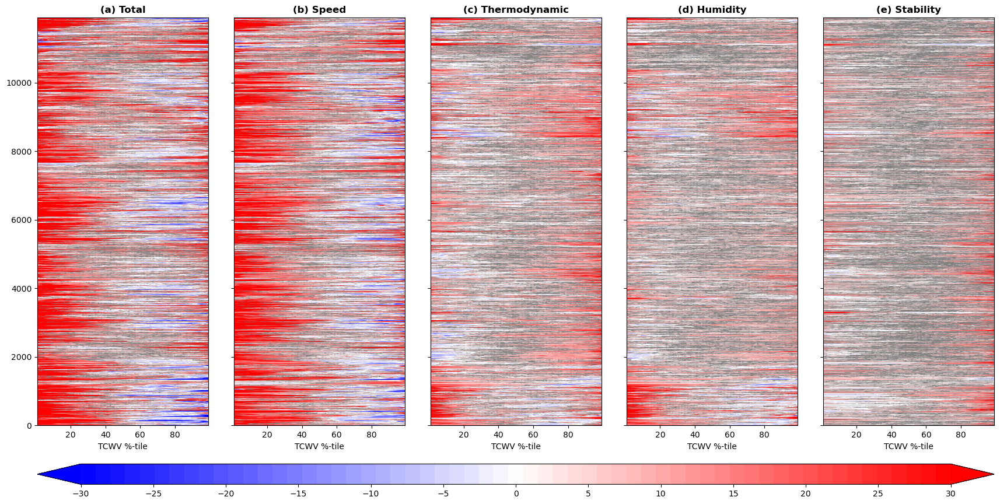

In [40]:
hov_plot_states(varis,org_hovx,org_hov,'Organised',levels,ticks,[0])

### Inputs, so raw variables

In [41]:
org_input_hov,org_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                            time_org,sta_date,end_date)

Date: 2016-01-01 00:00:00
Date: 2016-01-01 01:00:00
Date: 2016-01-01 02:00:00
Date: 2016-01-01 03:00:00
Date: 2016-01-01 04:00:00
Date: 2016-01-01 05:00:00
Date: 2016-01-01 06:00:00
Date: 2016-01-01 07:00:00
Date: 2016-01-01 08:00:00
Date: 2016-01-01 09:00:00
Date: 2016-01-01 10:00:00
Date: 2016-01-01 11:00:00
Date: 2016-01-01 12:00:00
Date: 2016-01-01 13:00:00
Date: 2016-01-01 14:00:00
Date: 2016-01-01 15:00:00
Date: 2016-01-01 16:00:00
Date: 2016-01-01 17:00:00
Date: 2016-01-01 18:00:00
Date: 2016-01-01 19:00:00
Date: 2016-01-01 20:00:00
Date: 2016-01-01 21:00:00
Date: 2016-01-01 22:00:00
Date: 2016-01-01 23:00:00
Date: 2016-01-02 00:00:00
Date: 2016-01-02 01:00:00
Date: 2016-01-02 02:00:00
Date: 2016-01-02 03:00:00
Date: 2016-01-02 04:00:00
Date: 2016-01-02 05:00:00
Date: 2016-01-02 06:00:00
Date: 2016-01-02 07:00:00
Date: 2016-01-02 08:00:00
Date: 2016-01-02 09:00:00
Date: 2016-01-02 10:00:00
Date: 2016-01-02 11:00:00
Date: 2016-01-02 12:00:00
Date: 2016-01-02 13:00:00
Date: 2016-0

Date: 2016-01-26 18:00:00
Date: 2016-01-26 19:00:00
Date: 2016-01-26 20:00:00
Date: 2016-01-26 21:00:00
Date: 2016-01-26 22:00:00
Date: 2016-01-26 23:00:00
Date: 2016-01-27 00:00:00
Date: 2016-01-27 01:00:00
Date: 2016-01-27 02:00:00
Date: 2016-01-27 03:00:00
Date: 2016-01-27 04:00:00
Date: 2016-01-27 05:00:00
Date: 2016-01-27 06:00:00
Date: 2016-01-27 07:00:00
Date: 2016-01-27 08:00:00
Date: 2016-01-27 09:00:00
Date: 2016-01-27 10:00:00
Date: 2016-01-27 11:00:00
Date: 2016-01-27 12:00:00
Date: 2016-01-27 13:00:00
Date: 2016-01-27 14:00:00
Date: 2016-01-27 15:00:00
Date: 2016-01-27 16:00:00
Date: 2016-01-27 17:00:00
Date: 2016-01-27 18:00:00
Date: 2016-01-27 19:00:00
Date: 2016-01-27 20:00:00
Date: 2016-01-27 21:00:00
Date: 2016-01-27 22:00:00
Date: 2016-01-27 23:00:00
Date: 2016-01-28 00:00:00
Date: 2016-01-28 01:00:00
Date: 2016-01-28 02:00:00
Date: 2016-01-28 03:00:00
Date: 2016-01-28 04:00:00
Date: 2016-01-28 05:00:00
Date: 2016-01-28 06:00:00
Date: 2016-01-28 07:00:00
Date: 2016-0

Date: 2016-02-13 18:00:00
Date: 2016-02-13 19:00:00
Date: 2016-02-13 20:00:00
Date: 2016-02-13 21:00:00
Date: 2016-02-13 22:00:00
Date: 2016-02-13 23:00:00
Date: 2016-02-14 00:00:00
Date: 2016-02-14 01:00:00
Date: 2016-02-14 02:00:00
Date: 2016-02-14 03:00:00
Date: 2016-02-14 04:00:00
Date: 2016-02-14 05:00:00
Date: 2016-02-14 06:00:00
Date: 2016-02-14 07:00:00
Date: 2016-02-14 08:00:00
Date: 2016-02-14 09:00:00
Date: 2016-02-14 10:00:00
Date: 2016-02-14 11:00:00
Date: 2016-02-14 12:00:00
Date: 2016-02-14 13:00:00
Date: 2016-02-14 14:00:00
Date: 2016-02-14 15:00:00
Date: 2016-02-14 16:00:00
Date: 2016-02-14 17:00:00
Date: 2016-02-14 18:00:00
Date: 2016-02-14 19:00:00
Date: 2016-02-14 20:00:00
Date: 2016-02-14 21:00:00
Date: 2016-02-14 22:00:00
Date: 2016-02-14 23:00:00
Date: 2016-02-15 00:00:00
Date: 2016-02-15 01:00:00
Date: 2016-02-15 02:00:00
Date: 2016-02-15 03:00:00
Date: 2016-02-15 04:00:00
Date: 2016-02-15 05:00:00
Date: 2016-02-15 06:00:00
Date: 2016-02-15 07:00:00
Date: 2016-0

Date: 2016-03-06 00:00:00
Date: 2016-03-06 01:00:00
Date: 2016-03-08 07:00:00
Date: 2016-03-08 08:00:00
Date: 2016-03-08 09:00:00
Date: 2016-03-08 10:00:00
Date: 2016-03-08 11:00:00
Date: 2016-03-08 12:00:00
Date: 2016-03-08 13:00:00
Date: 2016-03-08 14:00:00
Date: 2016-03-08 15:00:00
Date: 2016-03-08 16:00:00
Date: 2016-03-08 17:00:00
Date: 2016-03-08 18:00:00
Date: 2016-03-08 19:00:00
Date: 2016-03-08 20:00:00
Date: 2016-03-08 21:00:00
Date: 2016-03-08 22:00:00
Date: 2016-03-08 23:00:00
Date: 2016-03-09 00:00:00
Date: 2016-03-09 01:00:00
Date: 2016-03-09 02:00:00
Date: 2016-03-09 03:00:00
Date: 2016-03-09 04:00:00
Date: 2016-03-09 05:00:00
Date: 2016-03-09 06:00:00
Date: 2016-03-09 07:00:00
Date: 2016-03-09 08:00:00
Date: 2016-03-09 09:00:00
Date: 2016-03-09 10:00:00
Date: 2016-03-09 11:00:00
Date: 2016-03-09 12:00:00
Date: 2016-03-09 13:00:00
Date: 2016-03-09 14:00:00
Date: 2016-03-10 22:00:00
Date: 2016-03-10 23:00:00
Date: 2016-03-11 00:00:00
Date: 2016-03-11 01:00:00
Date: 2016-0

Date: 2016-03-28 01:00:00
Date: 2016-03-28 02:00:00
Date: 2016-03-28 03:00:00
Date: 2016-03-28 04:00:00
Date: 2016-03-28 05:00:00
Date: 2016-03-28 06:00:00
Date: 2016-03-28 07:00:00
Date: 2016-03-28 08:00:00
Date: 2016-03-28 09:00:00
Date: 2016-03-28 10:00:00
Date: 2016-03-28 11:00:00
Date: 2016-03-28 12:00:00
Date: 2016-03-28 13:00:00
Date: 2016-03-28 14:00:00
Date: 2016-03-28 15:00:00
Date: 2016-03-28 16:00:00
Date: 2016-03-28 17:00:00
Date: 2016-03-28 18:00:00
Date: 2016-03-28 19:00:00
Date: 2016-03-28 20:00:00
Date: 2016-03-28 21:00:00
Date: 2016-03-28 22:00:00
Date: 2016-03-28 23:00:00
Date: 2016-03-29 00:00:00
Date: 2016-03-29 01:00:00
Date: 2016-03-29 02:00:00
Date: 2016-03-29 03:00:00
Date: 2016-03-29 04:00:00
Date: 2016-03-29 05:00:00
Date: 2016-03-29 06:00:00
Date: 2016-03-29 07:00:00
Date: 2016-03-29 08:00:00
Date: 2016-03-29 09:00:00
Date: 2016-03-29 10:00:00
Date: 2016-03-29 11:00:00
Date: 2016-03-29 12:00:00
Date: 2016-03-29 13:00:00
Date: 2016-03-29 14:00:00
Date: 2016-0

Date: 2016-04-17 00:00:00
Date: 2016-04-17 01:00:00
Date: 2016-04-17 02:00:00
Date: 2016-04-17 03:00:00
Date: 2016-04-17 04:00:00
Date: 2016-04-17 05:00:00
Date: 2016-04-17 06:00:00
Date: 2016-04-17 07:00:00
Date: 2016-04-17 08:00:00
Date: 2016-04-17 09:00:00
Date: 2016-04-17 10:00:00
Date: 2016-04-17 11:00:00
Date: 2016-04-17 12:00:00
Date: 2016-04-17 13:00:00
Date: 2016-04-17 14:00:00
Date: 2016-04-17 15:00:00
Date: 2016-04-17 16:00:00
Date: 2016-04-30 15:00:00
Date: 2016-04-30 16:00:00
Date: 2016-04-30 17:00:00
Date: 2016-04-30 18:00:00
Date: 2016-04-30 19:00:00
Date: 2016-04-30 20:00:00
Date: 2016-04-30 21:00:00
Date: 2016-04-30 22:00:00
Date: 2016-04-30 23:00:00
Date: 2016-05-01 00:00:00
Date: 2016-05-01 01:00:00
Date: 2016-05-01 02:00:00
Date: 2016-05-01 03:00:00
Date: 2016-05-01 04:00:00
Date: 2016-05-01 05:00:00
Date: 2016-05-01 06:00:00
Date: 2016-05-01 07:00:00
Date: 2016-05-01 08:00:00
Date: 2016-05-01 09:00:00
Date: 2016-05-01 10:00:00
Date: 2016-05-01 11:00:00
Date: 2016-0

Date: 2016-05-27 11:00:00
Date: 2016-05-27 12:00:00
Date: 2016-05-27 13:00:00
Date: 2016-05-27 14:00:00
Date: 2016-05-27 15:00:00
Date: 2016-05-27 16:00:00
Date: 2016-05-27 17:00:00
Date: 2016-05-27 18:00:00
Date: 2016-05-27 19:00:00
Date: 2016-05-27 20:00:00
Date: 2016-05-27 21:00:00
Date: 2016-05-27 22:00:00
Date: 2016-05-27 23:00:00
Date: 2016-05-28 00:00:00
Date: 2016-05-28 01:00:00
Date: 2016-05-28 02:00:00
Date: 2016-05-28 03:00:00
Date: 2016-05-28 04:00:00
Date: 2016-05-28 05:00:00
Date: 2016-05-28 06:00:00
Date: 2016-05-28 07:00:00
Date: 2016-05-28 08:00:00
Date: 2016-05-28 09:00:00
Date: 2016-05-28 10:00:00
Date: 2016-05-28 11:00:00
Date: 2016-05-28 12:00:00
Date: 2016-05-28 13:00:00
Date: 2016-05-28 14:00:00
Date: 2016-05-28 15:00:00
Date: 2016-05-28 16:00:00
Date: 2016-05-28 17:00:00
Date: 2016-05-28 18:00:00
Date: 2016-05-28 19:00:00
Date: 2016-05-28 20:00:00
Date: 2016-05-28 21:00:00
Date: 2016-05-28 22:00:00
Date: 2016-05-28 23:00:00
Date: 2016-05-29 00:00:00
Date: 2016-0

Date: 2016-11-30 00:00:00
Date: 2016-11-30 01:00:00
Date: 2016-11-30 02:00:00
Date: 2016-11-30 03:00:00
Date: 2016-11-30 04:00:00
Date: 2016-11-30 05:00:00
Date: 2016-11-30 06:00:00
Date: 2016-11-30 07:00:00
Date: 2016-11-30 08:00:00
Date: 2016-11-30 09:00:00
Date: 2016-11-30 10:00:00
Date: 2016-11-30 11:00:00
Date: 2016-11-30 12:00:00
Date: 2016-11-30 13:00:00
Date: 2016-11-30 14:00:00
Date: 2016-11-30 15:00:00
Date: 2016-11-30 16:00:00
Date: 2016-11-30 17:00:00
Date: 2016-11-30 18:00:00
Date: 2016-11-30 19:00:00
Date: 2016-11-30 20:00:00
Date: 2016-11-30 21:00:00
Date: 2016-11-30 22:00:00
Date: 2016-11-30 23:00:00
Date: 2016-12-01 00:00:00
Date: 2016-12-01 01:00:00
Date: 2016-12-02 18:00:00
Date: 2016-12-02 19:00:00
Date: 2016-12-02 20:00:00
Date: 2016-12-02 21:00:00
Date: 2016-12-02 22:00:00
Date: 2016-12-02 23:00:00
Date: 2016-12-03 00:00:00
Date: 2016-12-03 01:00:00
Date: 2016-12-03 02:00:00
Date: 2016-12-03 03:00:00
Date: 2016-12-03 04:00:00
Date: 2016-12-03 05:00:00
Date: 2016-1

Date: 2016-12-18 18:00:00
Date: 2016-12-18 19:00:00
Date: 2016-12-18 20:00:00
Date: 2016-12-18 21:00:00
Date: 2016-12-18 22:00:00
Date: 2016-12-18 23:00:00
Date: 2016-12-19 00:00:00
Date: 2016-12-19 01:00:00
Date: 2016-12-19 02:00:00
Date: 2016-12-19 03:00:00
Date: 2016-12-19 04:00:00
Date: 2016-12-19 05:00:00
Date: 2016-12-19 06:00:00
Date: 2016-12-19 07:00:00
Date: 2016-12-19 08:00:00
Date: 2016-12-19 09:00:00
Date: 2016-12-19 10:00:00
Date: 2016-12-19 11:00:00
Date: 2016-12-19 12:00:00
Date: 2016-12-19 13:00:00
Date: 2016-12-19 14:00:00
Date: 2016-12-19 15:00:00
Date: 2016-12-19 16:00:00
Date: 2016-12-19 17:00:00
Date: 2016-12-19 18:00:00
Date: 2016-12-19 19:00:00
Date: 2016-12-19 20:00:00
Date: 2016-12-19 21:00:00
Date: 2016-12-19 22:00:00
Date: 2016-12-19 23:00:00
Date: 2016-12-20 00:00:00
Date: 2016-12-20 01:00:00
Date: 2016-12-20 02:00:00
Date: 2016-12-20 03:00:00
Date: 2016-12-20 04:00:00
Date: 2016-12-20 05:00:00
Date: 2016-12-20 06:00:00
Date: 2016-12-20 07:00:00
Date: 2016-1

Date: 2017-01-22 12:00:00
Date: 2017-01-22 13:00:00
Date: 2017-01-22 14:00:00
Date: 2017-01-22 15:00:00
Date: 2017-01-22 16:00:00
Date: 2017-01-22 17:00:00
Date: 2017-01-22 18:00:00
Date: 2017-01-22 19:00:00
Date: 2017-01-22 20:00:00
Date: 2017-01-22 21:00:00
Date: 2017-01-22 22:00:00
Date: 2017-01-22 23:00:00
Date: 2017-01-23 00:00:00
Date: 2017-01-23 01:00:00
Date: 2017-01-23 02:00:00
Date: 2017-01-23 03:00:00
Date: 2017-01-23 04:00:00
Date: 2017-01-23 05:00:00
Date: 2017-01-23 06:00:00
Date: 2017-01-23 07:00:00
Date: 2017-01-23 08:00:00
Date: 2017-01-23 09:00:00
Date: 2017-01-23 10:00:00
Date: 2017-01-23 11:00:00
Date: 2017-01-23 12:00:00
Date: 2017-01-23 13:00:00
Date: 2017-01-23 14:00:00
Date: 2017-01-23 15:00:00
Date: 2017-01-23 16:00:00
Date: 2017-01-23 17:00:00
Date: 2017-01-23 18:00:00
Date: 2017-01-23 19:00:00
Date: 2017-01-23 20:00:00
Date: 2017-01-23 21:00:00
Date: 2017-01-23 22:00:00
Date: 2017-01-23 23:00:00
Date: 2017-01-24 00:00:00
Date: 2017-01-24 01:00:00
Date: 2017-0

Date: 2017-03-11 16:00:00
Date: 2017-03-11 17:00:00
Date: 2017-03-11 18:00:00
Date: 2017-03-11 19:00:00
Date: 2017-03-11 20:00:00
Date: 2017-03-11 21:00:00
Date: 2017-03-11 22:00:00
Date: 2017-03-11 23:00:00
Date: 2017-03-12 00:00:00
Date: 2017-03-12 01:00:00
Date: 2017-03-12 02:00:00
Date: 2017-03-12 03:00:00
Date: 2017-03-12 04:00:00
Date: 2017-03-12 05:00:00
Date: 2017-03-12 06:00:00
Date: 2017-03-12 07:00:00
Date: 2017-03-12 08:00:00
Date: 2017-03-12 09:00:00
Date: 2017-03-12 10:00:00
Date: 2017-03-12 11:00:00
Date: 2017-03-12 12:00:00
Date: 2017-03-12 13:00:00
Date: 2017-03-12 14:00:00
Date: 2017-03-12 15:00:00
Date: 2017-03-12 16:00:00
Date: 2017-03-12 17:00:00
Date: 2017-03-12 18:00:00
Date: 2017-03-12 19:00:00
Date: 2017-03-12 20:00:00
Date: 2017-03-12 21:00:00
Date: 2017-03-12 22:00:00
Date: 2017-03-12 23:00:00
Date: 2017-03-13 00:00:00
Date: 2017-03-13 01:00:00
Date: 2017-03-13 02:00:00
Date: 2017-03-13 03:00:00
Date: 2017-03-13 04:00:00
Date: 2017-03-13 05:00:00
Date: 2017-0

Date: 2017-04-05 00:00:00
Date: 2017-04-05 01:00:00
Date: 2017-04-05 02:00:00
Date: 2017-04-05 03:00:00
Date: 2017-04-05 04:00:00
Date: 2017-04-05 05:00:00
Date: 2017-04-05 06:00:00
Date: 2017-04-05 07:00:00
Date: 2017-04-05 08:00:00
Date: 2017-04-05 09:00:00
Date: 2017-04-05 10:00:00
Date: 2017-04-05 11:00:00
Date: 2017-04-05 12:00:00
Date: 2017-04-05 13:00:00
Date: 2017-04-05 14:00:00
Date: 2017-04-05 15:00:00
Date: 2017-04-05 16:00:00
Date: 2017-04-05 17:00:00
Date: 2017-04-05 18:00:00
Date: 2017-04-05 19:00:00
Date: 2017-04-05 20:00:00
Date: 2017-04-05 21:00:00
Date: 2017-04-05 22:00:00
Date: 2017-04-05 23:00:00
Date: 2017-04-06 00:00:00
Date: 2017-04-06 01:00:00
Date: 2017-04-06 02:00:00
Date: 2017-04-06 03:00:00
Date: 2017-04-06 04:00:00
Date: 2017-04-06 05:00:00
Date: 2017-04-06 06:00:00
Date: 2017-04-06 07:00:00
Date: 2017-04-06 08:00:00
Date: 2017-04-06 09:00:00
Date: 2017-04-06 10:00:00
Date: 2017-04-06 11:00:00
Date: 2017-04-06 12:00:00
Date: 2017-04-06 13:00:00
Date: 2017-0

Date: 2017-05-04 10:00:00
Date: 2017-05-04 11:00:00
Date: 2017-05-04 12:00:00
Date: 2017-05-04 13:00:00
Date: 2017-05-04 14:00:00
Date: 2017-05-04 15:00:00
Date: 2017-05-04 16:00:00
Date: 2017-05-04 17:00:00
Date: 2017-05-04 18:00:00
Date: 2017-05-04 19:00:00
Date: 2017-05-04 20:00:00
Date: 2017-05-04 21:00:00
Date: 2017-05-04 22:00:00
Date: 2017-05-04 23:00:00
Date: 2017-05-05 00:00:00
Date: 2017-05-05 01:00:00
Date: 2017-05-05 02:00:00
Date: 2017-05-05 03:00:00
Date: 2017-05-05 04:00:00
Date: 2017-05-05 05:00:00
Date: 2017-05-05 06:00:00
Date: 2017-05-05 07:00:00
Date: 2017-05-05 08:00:00
Date: 2017-05-05 09:00:00
Date: 2017-05-05 10:00:00
Date: 2017-05-05 11:00:00
Date: 2017-05-05 12:00:00
Date: 2017-05-05 13:00:00
Date: 2017-05-05 14:00:00
Date: 2017-05-06 14:00:00
Date: 2017-05-06 15:00:00
Date: 2017-05-06 16:00:00
Date: 2017-05-06 17:00:00
Date: 2017-05-06 18:00:00
Date: 2017-05-06 19:00:00
Date: 2017-05-06 20:00:00
Date: 2017-05-06 21:00:00
Date: 2017-05-06 22:00:00
Date: 2017-0

Date: 2017-06-03 01:00:00
Date: 2017-06-03 02:00:00
Date: 2017-06-03 03:00:00
Date: 2017-06-03 04:00:00
Date: 2017-06-03 05:00:00
Date: 2017-06-03 06:00:00
Date: 2017-06-03 07:00:00
Date: 2017-06-03 08:00:00
Date: 2017-06-03 09:00:00
Date: 2017-06-03 10:00:00
Date: 2017-06-03 11:00:00
Date: 2017-06-03 12:00:00
Date: 2017-06-03 13:00:00
Date: 2017-06-03 14:00:00
Date: 2017-06-03 15:00:00
Date: 2017-06-03 16:00:00
Date: 2017-06-03 17:00:00
Date: 2017-06-03 18:00:00
Date: 2017-06-03 19:00:00
Date: 2017-06-03 20:00:00
Date: 2017-06-03 21:00:00
Date: 2017-06-03 22:00:00
Date: 2017-06-03 23:00:00
Date: 2017-06-04 00:00:00
Date: 2017-06-04 01:00:00
Date: 2017-06-04 02:00:00
Date: 2017-06-04 03:00:00
Date: 2017-06-04 04:00:00
Date: 2017-06-04 05:00:00
Date: 2017-06-04 06:00:00
Date: 2017-06-04 07:00:00
Date: 2017-06-04 08:00:00
Date: 2017-06-04 09:00:00
Date: 2017-06-04 10:00:00
Date: 2017-06-04 11:00:00
Date: 2017-06-04 12:00:00
Date: 2017-06-04 13:00:00
Date: 2017-06-04 14:00:00
Date: 2017-0

Date: 2017-10-09 19:00:00
Date: 2017-10-09 20:00:00
Date: 2017-10-09 21:00:00
Date: 2017-10-27 03:00:00
Date: 2017-10-27 04:00:00
Date: 2017-10-27 05:00:00
Date: 2017-10-27 06:00:00
Date: 2017-10-27 07:00:00
Date: 2017-10-27 08:00:00
Date: 2017-10-27 09:00:00
Date: 2017-10-27 10:00:00
Date: 2017-10-27 11:00:00
Date: 2017-10-27 12:00:00
Date: 2017-10-27 13:00:00
Date: 2017-10-27 14:00:00
Date: 2017-10-27 15:00:00
Date: 2017-10-27 16:00:00
Date: 2017-10-27 17:00:00
Date: 2017-10-27 18:00:00
Date: 2017-10-27 19:00:00
Date: 2017-10-27 20:00:00
Date: 2017-10-27 21:00:00
Date: 2017-10-27 22:00:00
Date: 2017-10-27 23:00:00
Date: 2017-10-28 00:00:00
Date: 2017-10-28 01:00:00
Date: 2017-10-28 02:00:00
Date: 2017-10-28 03:00:00
Date: 2017-10-28 04:00:00
Date: 2017-10-28 05:00:00
Date: 2017-10-28 06:00:00
Date: 2017-11-16 23:00:00
Date: 2017-11-17 00:00:00
Date: 2017-11-17 01:00:00
Date: 2017-11-17 02:00:00
Date: 2017-11-17 03:00:00
Date: 2017-11-17 04:00:00
Date: 2017-11-17 05:00:00
Date: 2017-1

Date: 2017-12-17 12:00:00
Date: 2017-12-17 13:00:00
Date: 2017-12-17 14:00:00
Date: 2017-12-17 15:00:00
Date: 2017-12-17 16:00:00
Date: 2017-12-17 17:00:00
Date: 2017-12-17 18:00:00
Date: 2017-12-17 19:00:00
Date: 2017-12-17 20:00:00
Date: 2017-12-17 21:00:00
Date: 2017-12-17 22:00:00
Date: 2017-12-17 23:00:00
Date: 2017-12-18 00:00:00
Date: 2017-12-18 01:00:00
Date: 2017-12-18 02:00:00
Date: 2017-12-18 03:00:00
Date: 2017-12-18 04:00:00
Date: 2017-12-18 05:00:00
Date: 2017-12-18 06:00:00
Date: 2017-12-18 07:00:00
Date: 2017-12-18 08:00:00
Date: 2017-12-18 09:00:00
Date: 2017-12-18 10:00:00
Date: 2017-12-18 11:00:00
Date: 2017-12-18 12:00:00
Date: 2017-12-18 13:00:00
Date: 2017-12-18 14:00:00
Date: 2017-12-18 15:00:00
Date: 2017-12-18 16:00:00
Date: 2017-12-18 17:00:00
Date: 2017-12-18 18:00:00
Date: 2017-12-18 19:00:00
Date: 2017-12-18 20:00:00
Date: 2017-12-26 15:00:00
Date: 2017-12-26 16:00:00
Date: 2017-12-26 17:00:00
Date: 2017-12-26 18:00:00
Date: 2017-12-26 19:00:00
Date: 2017-1

Date: 2018-02-07 10:00:00
Date: 2018-02-07 11:00:00
Date: 2018-02-07 12:00:00
Date: 2018-02-07 13:00:00
Date: 2018-02-07 14:00:00
Date: 2018-02-07 15:00:00
Date: 2018-02-07 16:00:00
Date: 2018-02-07 17:00:00
Date: 2018-02-07 18:00:00
Date: 2018-02-07 19:00:00
Date: 2018-02-07 20:00:00
Date: 2018-02-07 21:00:00
Date: 2018-02-07 22:00:00
Date: 2018-02-07 23:00:00
Date: 2018-02-08 00:00:00
Date: 2018-02-08 01:00:00
Date: 2018-02-08 02:00:00
Date: 2018-02-08 03:00:00
Date: 2018-02-08 04:00:00
Date: 2018-02-08 05:00:00
Date: 2018-02-08 06:00:00
Date: 2018-02-08 07:00:00
Date: 2018-02-08 08:00:00
Date: 2018-02-08 09:00:00
Date: 2018-02-08 10:00:00
Date: 2018-02-08 11:00:00
Date: 2018-02-08 12:00:00
Date: 2018-02-08 13:00:00
Date: 2018-02-08 14:00:00
Date: 2018-02-08 15:00:00
Date: 2018-02-08 16:00:00
Date: 2018-02-08 17:00:00
Date: 2018-02-08 18:00:00
Date: 2018-02-08 19:00:00
Date: 2018-02-08 20:00:00
Date: 2018-02-08 21:00:00
Date: 2018-02-11 13:00:00
Date: 2018-02-11 14:00:00
Date: 2018-0

Date: 2018-03-03 03:00:00
Date: 2018-03-03 04:00:00
Date: 2018-03-03 05:00:00
Date: 2018-03-03 06:00:00
Date: 2018-03-03 07:00:00
Date: 2018-03-03 08:00:00
Date: 2018-03-03 09:00:00
Date: 2018-03-03 10:00:00
Date: 2018-03-03 11:00:00
Date: 2018-03-03 12:00:00
Date: 2018-03-03 13:00:00
Date: 2018-03-03 14:00:00
Date: 2018-03-03 15:00:00
Date: 2018-03-03 16:00:00
Date: 2018-03-03 17:00:00
Date: 2018-03-03 18:00:00
Date: 2018-03-03 19:00:00
Date: 2018-03-03 20:00:00
Date: 2018-03-03 21:00:00
Date: 2018-03-03 22:00:00
Date: 2018-03-03 23:00:00
Date: 2018-03-04 00:00:00
Date: 2018-03-04 01:00:00
Date: 2018-03-04 02:00:00
Date: 2018-03-04 03:00:00
Date: 2018-03-04 04:00:00
Date: 2018-03-04 05:00:00
Date: 2018-03-04 06:00:00
Date: 2018-03-04 07:00:00
Date: 2018-03-04 08:00:00
Date: 2018-03-04 09:00:00
Date: 2018-03-04 10:00:00
Date: 2018-03-04 11:00:00
Date: 2018-03-04 12:00:00
Date: 2018-03-04 13:00:00
Date: 2018-03-04 14:00:00
Date: 2018-03-04 15:00:00
Date: 2018-03-04 16:00:00
Date: 2018-0

Date: 2018-03-31 10:00:00
Date: 2018-03-31 11:00:00
Date: 2018-03-31 12:00:00
Date: 2018-03-31 13:00:00
Date: 2018-03-31 14:00:00
Date: 2018-03-31 15:00:00
Date: 2018-03-31 16:00:00
Date: 2018-03-31 17:00:00
Date: 2018-03-31 18:00:00
Date: 2018-03-31 19:00:00
Date: 2018-03-31 20:00:00
Date: 2018-03-31 21:00:00
Date: 2018-03-31 22:00:00
Date: 2018-03-31 23:00:00
Date: 2018-04-01 00:00:00
Date: 2018-04-01 01:00:00
Date: 2018-04-01 02:00:00
Date: 2018-04-01 03:00:00
Date: 2018-04-01 04:00:00
Date: 2018-04-01 05:00:00
Date: 2018-04-01 06:00:00
Date: 2018-04-01 07:00:00
Date: 2018-04-01 08:00:00
Date: 2018-04-01 09:00:00
Date: 2018-04-01 10:00:00
Date: 2018-04-01 11:00:00
Date: 2018-04-01 12:00:00
Date: 2018-04-01 13:00:00
Date: 2018-04-01 14:00:00
Date: 2018-04-02 12:00:00
Date: 2018-04-02 13:00:00
Date: 2018-04-02 14:00:00
Date: 2018-04-02 15:00:00
Date: 2018-04-02 16:00:00
Date: 2018-04-02 17:00:00
Date: 2018-04-02 18:00:00
Date: 2018-04-02 19:00:00
Date: 2018-04-02 20:00:00
Date: 2018-0

Date: 2018-04-25 17:00:00
Date: 2018-04-25 18:00:00
Date: 2018-04-25 19:00:00
Date: 2018-04-25 20:00:00
Date: 2018-04-25 21:00:00
Date: 2018-04-25 22:00:00
Date: 2018-04-25 23:00:00
Date: 2018-04-26 00:00:00
Date: 2018-04-26 01:00:00
Date: 2018-04-26 02:00:00
Date: 2018-04-26 03:00:00
Date: 2018-04-26 04:00:00
Date: 2018-04-26 05:00:00
Date: 2018-04-26 06:00:00
Date: 2018-04-26 07:00:00
Date: 2018-04-26 08:00:00
Date: 2018-04-26 09:00:00
Date: 2018-04-26 10:00:00
Date: 2018-04-26 11:00:00
Date: 2018-04-26 12:00:00
Date: 2018-04-26 13:00:00
Date: 2018-04-26 14:00:00
Date: 2018-04-26 15:00:00
Date: 2018-04-26 16:00:00
Date: 2018-04-26 17:00:00
Date: 2018-04-26 18:00:00
Date: 2018-04-26 19:00:00
Date: 2018-04-26 20:00:00
Date: 2018-04-26 21:00:00
Date: 2018-05-02 09:00:00
Date: 2018-05-02 10:00:00
Date: 2018-05-02 11:00:00
Date: 2018-05-02 12:00:00
Date: 2018-05-02 13:00:00
Date: 2018-05-02 14:00:00
Date: 2018-05-02 15:00:00
Date: 2018-05-02 16:00:00
Date: 2018-05-02 17:00:00
Date: 2018-0

Date: 2018-10-28 04:00:00
Date: 2018-10-28 05:00:00
Date: 2018-10-28 06:00:00
Date: 2018-10-28 07:00:00
Date: 2018-10-28 08:00:00
Date: 2018-10-28 09:00:00
Date: 2018-10-28 10:00:00
Date: 2018-10-28 11:00:00
Date: 2018-10-28 12:00:00
Date: 2018-10-28 13:00:00
Date: 2018-10-28 14:00:00
Date: 2018-10-28 15:00:00
Date: 2018-10-28 16:00:00
Date: 2018-10-28 17:00:00
Date: 2018-10-28 18:00:00
Date: 2018-10-28 19:00:00
Date: 2018-10-28 20:00:00
Date: 2018-10-28 21:00:00
Date: 2018-10-28 22:00:00
Date: 2018-10-28 23:00:00
Date: 2018-10-29 00:00:00
Date: 2018-10-29 01:00:00
Date: 2018-10-29 02:00:00
Date: 2018-10-29 03:00:00
Date: 2018-10-29 04:00:00
Date: 2018-10-29 05:00:00
Date: 2018-10-29 06:00:00
Date: 2018-10-29 07:00:00
Date: 2018-10-29 08:00:00
Date: 2018-10-29 09:00:00
Date: 2018-10-29 10:00:00
Date: 2018-10-29 11:00:00
Date: 2018-10-29 12:00:00
Date: 2018-10-29 13:00:00
Date: 2018-10-29 14:00:00
Date: 2018-10-29 15:00:00
Date: 2018-10-29 16:00:00
Date: 2018-10-29 17:00:00
Date: 2018-1

Date: 2018-12-01 22:00:00
Date: 2018-12-01 23:00:00
Date: 2018-12-02 00:00:00
Date: 2018-12-02 01:00:00
Date: 2018-12-02 02:00:00
Date: 2018-12-02 03:00:00
Date: 2018-12-02 04:00:00
Date: 2018-12-02 05:00:00
Date: 2018-12-02 06:00:00
Date: 2018-12-02 07:00:00
Date: 2018-12-03 05:00:00
Date: 2018-12-03 06:00:00
Date: 2018-12-03 07:00:00
Date: 2018-12-03 08:00:00
Date: 2018-12-03 09:00:00
Date: 2018-12-03 10:00:00
Date: 2018-12-03 11:00:00
Date: 2018-12-03 12:00:00
Date: 2018-12-03 13:00:00
Date: 2018-12-03 14:00:00
Date: 2018-12-03 15:00:00
Date: 2018-12-03 16:00:00
Date: 2018-12-03 17:00:00
Date: 2018-12-03 18:00:00
Date: 2018-12-03 19:00:00
Date: 2018-12-03 20:00:00
Date: 2018-12-03 21:00:00
Date: 2018-12-03 22:00:00
Date: 2018-12-03 23:00:00
Date: 2018-12-04 00:00:00
Date: 2018-12-04 01:00:00
Date: 2018-12-04 02:00:00
Date: 2018-12-04 03:00:00
Date: 2018-12-04 04:00:00
Date: 2018-12-04 05:00:00
Date: 2018-12-04 06:00:00
Date: 2018-12-04 07:00:00
Date: 2018-12-04 08:00:00
Date: 2018-1

Date: 2019-01-07 16:00:00
Date: 2019-01-07 17:00:00
Date: 2019-01-07 18:00:00
Date: 2019-01-07 19:00:00
Date: 2019-01-07 20:00:00
Date: 2019-01-07 21:00:00
Date: 2019-01-07 22:00:00
Date: 2019-01-07 23:00:00
Date: 2019-01-08 00:00:00
Date: 2019-01-08 01:00:00
Date: 2019-01-08 02:00:00
Date: 2019-01-08 03:00:00
Date: 2019-01-08 04:00:00
Date: 2019-01-08 05:00:00
Date: 2019-01-08 06:00:00
Date: 2019-01-08 07:00:00
Date: 2019-01-08 08:00:00
Date: 2019-01-08 09:00:00
Date: 2019-01-10 17:00:00
Date: 2019-01-10 18:00:00
Date: 2019-01-10 19:00:00
Date: 2019-01-10 20:00:00
Date: 2019-01-10 21:00:00
Date: 2019-01-10 22:00:00
Date: 2019-01-10 23:00:00
Date: 2019-01-11 00:00:00
Date: 2019-01-11 01:00:00
Date: 2019-01-11 02:00:00
Date: 2019-01-11 03:00:00
Date: 2019-01-11 04:00:00
Date: 2019-01-11 05:00:00
Date: 2019-01-11 06:00:00
Date: 2019-01-11 07:00:00
Date: 2019-01-11 08:00:00
Date: 2019-01-11 09:00:00
Date: 2019-01-11 10:00:00
Date: 2019-01-11 11:00:00
Date: 2019-01-11 12:00:00
Date: 2019-0

Date: 2019-01-28 07:00:00
Date: 2019-01-28 08:00:00
Date: 2019-01-28 09:00:00
Date: 2019-01-28 10:00:00
Date: 2019-01-28 11:00:00
Date: 2019-01-28 12:00:00
Date: 2019-01-28 13:00:00
Date: 2019-01-28 14:00:00
Date: 2019-01-28 15:00:00
Date: 2019-01-28 16:00:00
Date: 2019-01-28 17:00:00
Date: 2019-01-28 18:00:00
Date: 2019-01-28 19:00:00
Date: 2019-01-28 20:00:00
Date: 2019-01-28 21:00:00
Date: 2019-01-28 22:00:00
Date: 2019-01-28 23:00:00
Date: 2019-01-29 00:00:00
Date: 2019-01-29 01:00:00
Date: 2019-01-29 02:00:00
Date: 2019-01-29 03:00:00
Date: 2019-01-29 04:00:00
Date: 2019-01-29 05:00:00
Date: 2019-01-29 06:00:00
Date: 2019-01-29 07:00:00
Date: 2019-01-29 08:00:00
Date: 2019-01-29 09:00:00
Date: 2019-01-29 10:00:00
Date: 2019-01-29 11:00:00
Date: 2019-01-29 12:00:00
Date: 2019-01-29 13:00:00
Date: 2019-01-29 14:00:00
Date: 2019-01-29 15:00:00
Date: 2019-01-29 16:00:00
Date: 2019-01-29 17:00:00
Date: 2019-01-30 13:00:00
Date: 2019-01-30 14:00:00
Date: 2019-01-30 15:00:00
Date: 2019-0

Date: 2019-02-20 03:00:00
Date: 2019-02-20 04:00:00
Date: 2019-02-20 05:00:00
Date: 2019-02-20 06:00:00
Date: 2019-02-20 07:00:00
Date: 2019-02-20 08:00:00
Date: 2019-02-20 09:00:00
Date: 2019-02-20 10:00:00
Date: 2019-02-20 11:00:00
Date: 2019-02-21 03:00:00
Date: 2019-02-21 04:00:00
Date: 2019-02-21 05:00:00
Date: 2019-02-21 06:00:00
Date: 2019-02-21 07:00:00
Date: 2019-02-21 08:00:00
Date: 2019-02-21 09:00:00
Date: 2019-02-21 10:00:00
Date: 2019-02-21 11:00:00
Date: 2019-02-21 12:00:00
Date: 2019-02-21 13:00:00
Date: 2019-02-21 14:00:00
Date: 2019-02-21 15:00:00
Date: 2019-02-21 16:00:00
Date: 2019-02-21 17:00:00
Date: 2019-02-21 18:00:00
Date: 2019-02-21 19:00:00
Date: 2019-02-21 20:00:00
Date: 2019-02-21 21:00:00
Date: 2019-02-21 22:00:00
Date: 2019-02-21 23:00:00
Date: 2019-02-22 00:00:00
Date: 2019-02-22 01:00:00
Date: 2019-02-22 02:00:00
Date: 2019-02-25 04:00:00
Date: 2019-02-25 05:00:00
Date: 2019-02-25 06:00:00
Date: 2019-02-25 07:00:00
Date: 2019-02-25 08:00:00
Date: 2019-0

Date: 2019-03-14 22:00:00
Date: 2019-03-14 23:00:00
Date: 2019-03-15 00:00:00
Date: 2019-03-15 01:00:00
Date: 2019-03-15 02:00:00
Date: 2019-03-15 03:00:00
Date: 2019-03-15 04:00:00
Date: 2019-03-15 05:00:00
Date: 2019-03-15 06:00:00
Date: 2019-03-15 07:00:00
Date: 2019-03-15 08:00:00
Date: 2019-03-15 09:00:00
Date: 2019-03-15 10:00:00
Date: 2019-03-15 11:00:00
Date: 2019-03-17 22:00:00
Date: 2019-03-17 23:00:00
Date: 2019-03-18 00:00:00
Date: 2019-03-18 01:00:00
Date: 2019-03-18 02:00:00
Date: 2019-03-18 03:00:00
Date: 2019-03-18 04:00:00
Date: 2019-03-18 05:00:00
Date: 2019-03-18 06:00:00
Date: 2019-03-18 07:00:00
Date: 2019-03-18 08:00:00
Date: 2019-03-18 09:00:00
Date: 2019-03-18 10:00:00
Date: 2019-03-18 11:00:00
Date: 2019-03-18 12:00:00
Date: 2019-03-18 13:00:00
Date: 2019-03-18 14:00:00
Date: 2019-03-18 15:00:00
Date: 2019-03-18 16:00:00
Date: 2019-03-18 17:00:00
Date: 2019-03-18 18:00:00
Date: 2019-03-18 19:00:00
Date: 2019-03-18 20:00:00
Date: 2019-03-18 21:00:00
Date: 2019-0

Date: 2019-04-14 03:00:00
Date: 2019-04-14 04:00:00
Date: 2019-04-14 05:00:00
Date: 2019-04-14 06:00:00
Date: 2019-04-14 07:00:00
Date: 2019-04-14 08:00:00
Date: 2019-04-14 09:00:00
Date: 2019-04-14 10:00:00
Date: 2019-04-14 11:00:00
Date: 2019-04-14 12:00:00
Date: 2019-04-14 13:00:00
Date: 2019-04-14 14:00:00
Date: 2019-04-14 15:00:00
Date: 2019-04-14 16:00:00
Date: 2019-04-14 17:00:00
Date: 2019-04-14 18:00:00
Date: 2019-04-14 19:00:00
Date: 2019-04-14 20:00:00
Date: 2019-04-14 21:00:00
Date: 2019-04-14 22:00:00
Date: 2019-04-14 23:00:00
Date: 2019-04-15 00:00:00
Date: 2019-04-15 01:00:00
Date: 2019-04-15 02:00:00
Date: 2019-04-15 03:00:00
Date: 2019-04-15 04:00:00
Date: 2019-04-15 05:00:00
Date: 2019-04-15 06:00:00
Date: 2019-04-15 07:00:00
Date: 2019-04-15 08:00:00
Date: 2019-04-15 09:00:00
Date: 2019-04-15 10:00:00
Date: 2019-04-15 11:00:00
Date: 2019-04-15 12:00:00
Date: 2019-04-15 13:00:00
Date: 2019-04-15 14:00:00
Date: 2019-04-15 15:00:00
Date: 2019-04-15 16:00:00
Date: 2019-0

Date: 2019-05-23 19:00:00
Date: 2019-05-23 20:00:00
Date: 2019-05-23 21:00:00
Date: 2019-05-23 22:00:00
Date: 2019-05-23 23:00:00
Date: 2019-05-24 00:00:00
Date: 2019-05-24 01:00:00
Date: 2019-05-24 02:00:00
Date: 2019-05-24 03:00:00
Date: 2019-05-24 04:00:00
Date: 2019-05-24 05:00:00
Date: 2019-05-24 06:00:00
Date: 2019-05-24 07:00:00
Date: 2019-05-24 08:00:00
Date: 2019-05-24 09:00:00
Date: 2019-05-24 10:00:00
Date: 2019-05-24 11:00:00
Date: 2019-05-24 12:00:00
Date: 2019-05-24 13:00:00
Date: 2019-05-24 14:00:00
Date: 2019-05-24 15:00:00
Date: 2019-05-24 16:00:00
Date: 2019-05-24 17:00:00
Date: 2019-05-24 18:00:00
Date: 2019-05-24 19:00:00
Date: 2019-05-24 20:00:00
Date: 2019-05-30 09:00:00
Date: 2019-05-30 10:00:00
Date: 2019-05-30 11:00:00
Date: 2019-05-30 12:00:00
Date: 2019-05-30 13:00:00
Date: 2019-05-30 14:00:00
Date: 2019-05-30 15:00:00
Date: 2019-05-30 16:00:00
Date: 2019-05-30 17:00:00
Date: 2019-05-30 18:00:00
Date: 2019-05-30 19:00:00
Date: 2019-05-30 20:00:00
Date: 2019-0

Date: 2019-07-27 01:00:00
Date: 2019-07-27 02:00:00
Date: 2019-07-27 03:00:00
Date: 2019-07-27 04:00:00
Date: 2019-07-27 05:00:00
Date: 2019-07-27 06:00:00
Date: 2019-07-27 07:00:00
Date: 2019-07-27 08:00:00
Date: 2019-07-27 09:00:00
Date: 2019-07-27 10:00:00
Date: 2019-07-27 11:00:00
Date: 2019-07-27 12:00:00
Date: 2019-07-28 02:00:00
Date: 2019-07-28 03:00:00
Date: 2019-07-28 04:00:00
Date: 2019-07-28 05:00:00
Date: 2019-07-28 06:00:00
Date: 2019-07-28 07:00:00
Date: 2019-07-28 08:00:00
Date: 2019-07-28 09:00:00
Date: 2019-07-28 10:00:00
Date: 2019-07-28 11:00:00
Date: 2019-07-28 12:00:00
Date: 2019-07-28 13:00:00
Date: 2019-07-28 14:00:00
Date: 2019-07-28 15:00:00
Date: 2019-07-28 16:00:00
Date: 2019-07-28 17:00:00
Date: 2019-07-28 18:00:00
Date: 2019-07-28 19:00:00
Date: 2019-07-28 20:00:00
Date: 2019-07-28 21:00:00
Date: 2019-07-28 22:00:00
Date: 2019-07-28 23:00:00
Date: 2019-07-29 00:00:00
Date: 2019-07-29 01:00:00
Date: 2019-07-29 02:00:00
Date: 2019-07-29 03:00:00
Date: 2019-0

Date: 2019-09-13 00:00:00
Date: 2019-09-13 01:00:00
Date: 2019-09-13 02:00:00
Date: 2019-09-13 03:00:00
Date: 2019-09-13 04:00:00
Date: 2019-09-13 05:00:00
Date: 2019-09-13 06:00:00
Date: 2019-09-13 07:00:00
Date: 2019-09-13 08:00:00
Date: 2019-09-13 09:00:00
Date: 2019-09-13 10:00:00
Date: 2019-09-13 11:00:00
Date: 2019-09-13 12:00:00
Date: 2019-09-13 13:00:00
Date: 2019-09-13 14:00:00
Date: 2019-09-13 15:00:00
Date: 2019-09-13 16:00:00
Date: 2019-09-13 17:00:00
Date: 2019-09-13 18:00:00
Date: 2019-09-13 19:00:00
Date: 2019-09-13 20:00:00
Date: 2019-09-13 21:00:00
Date: 2019-09-13 22:00:00
Date: 2019-09-13 23:00:00
Date: 2019-09-14 00:00:00
Date: 2019-09-14 01:00:00
Date: 2019-09-14 02:00:00
Date: 2019-09-14 03:00:00
Date: 2019-09-14 04:00:00
Date: 2019-09-14 05:00:00
Date: 2019-09-14 06:00:00
Date: 2019-09-14 07:00:00
Date: 2019-09-14 08:00:00
Date: 2019-09-14 09:00:00
Date: 2019-09-14 10:00:00
Date: 2019-09-14 11:00:00
Date: 2019-09-14 12:00:00
Date: 2019-09-14 13:00:00
Date: 2019-0

Date: 2019-12-08 22:00:00
Date: 2019-12-08 23:00:00
Date: 2019-12-09 00:00:00
Date: 2019-12-09 01:00:00
Date: 2019-12-09 02:00:00
Date: 2019-12-09 03:00:00
Date: 2019-12-09 04:00:00
Date: 2019-12-09 05:00:00
Date: 2019-12-09 06:00:00
Date: 2019-12-09 07:00:00
Date: 2019-12-09 08:00:00
Date: 2019-12-09 09:00:00
Date: 2019-12-09 10:00:00
Date: 2019-12-09 11:00:00
Date: 2019-12-09 12:00:00
Date: 2019-12-09 13:00:00
Date: 2019-12-09 14:00:00
Date: 2019-12-09 15:00:00
Date: 2019-12-09 16:00:00
Date: 2019-12-09 17:00:00
Date: 2019-12-09 18:00:00
Date: 2019-12-09 19:00:00
Date: 2019-12-09 20:00:00
Date: 2019-12-13 00:00:00
Date: 2019-12-13 01:00:00
Date: 2019-12-13 02:00:00
Date: 2019-12-13 03:00:00
Date: 2019-12-13 04:00:00
Date: 2019-12-13 05:00:00
Date: 2019-12-13 06:00:00
Date: 2019-12-13 07:00:00
Date: 2019-12-13 08:00:00
Date: 2019-12-13 09:00:00
Date: 2019-12-13 10:00:00
Date: 2019-12-13 11:00:00
Date: 2019-12-13 12:00:00
Date: 2019-12-13 13:00:00
Date: 2019-12-13 14:00:00
Date: 2019-1

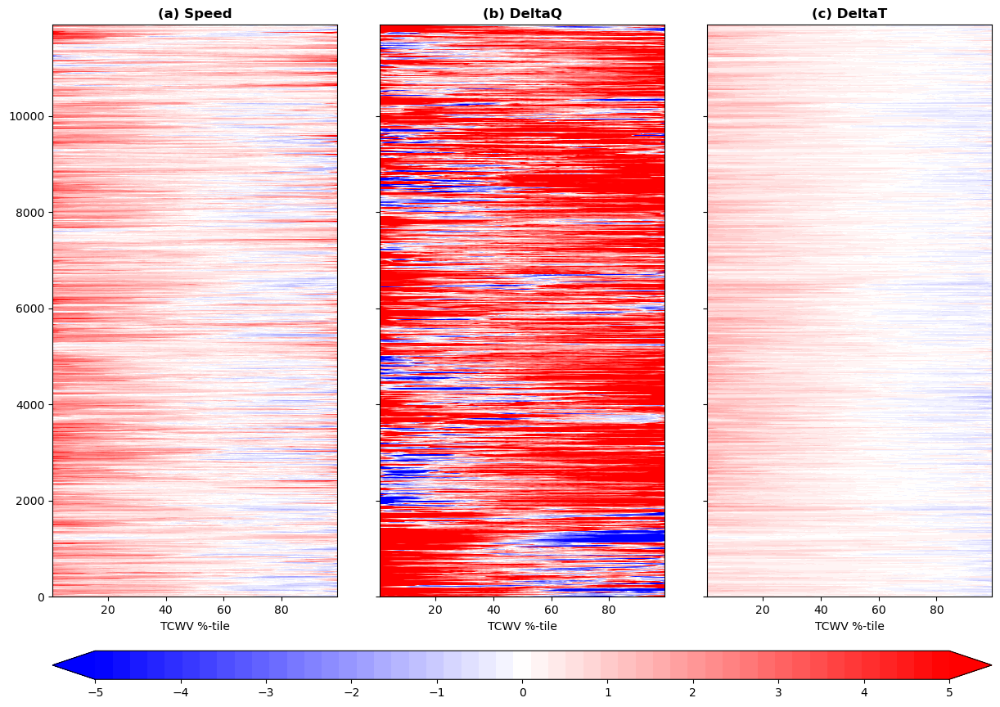

In [42]:
org_input_hov['DeltaQ'] = org_input_hov['DeltaQ']*10000
hov_plot_states(varis1,org_input_hovx,org_input_hov,'Organised_input',
                np.linspace(-5,5,50),np.arange(-5,5.1,1),[])

## JJA

### Neural Net

In [43]:
#### Dates for Organised!
##Org
time_org_JJA = sel_season(df_org,6,7,8)
sta_date,end_date = '2016-01-01 00:00:00','2019-12-31 23:00:00'
JJA_org_hov,JJA_org_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                           time_org_JJA,sta_date,end_date)

Date: 2016-06-01 00:00:00
Date: 2016-06-01 01:00:00
Date: 2016-06-01 02:00:00
Date: 2016-06-01 03:00:00
Date: 2016-06-01 04:00:00
Date: 2016-06-01 05:00:00
Date: 2016-06-01 06:00:00
Date: 2016-06-01 07:00:00
Date: 2017-06-02 22:00:00
Date: 2017-06-02 23:00:00
Date: 2017-06-03 00:00:00
Date: 2017-06-03 01:00:00
Date: 2017-06-03 02:00:00
Date: 2017-06-03 03:00:00
Date: 2017-06-03 04:00:00
Date: 2017-06-03 05:00:00
Date: 2017-06-03 06:00:00
Date: 2017-06-03 07:00:00
Date: 2017-06-03 08:00:00
Date: 2017-06-03 09:00:00
Date: 2017-06-03 10:00:00
Date: 2017-06-03 11:00:00
Date: 2017-06-03 12:00:00
Date: 2017-06-03 13:00:00
Date: 2017-06-03 14:00:00
Date: 2017-06-03 15:00:00
Date: 2017-06-03 16:00:00
Date: 2017-06-03 17:00:00
Date: 2017-06-03 18:00:00
Date: 2017-06-03 19:00:00
Date: 2017-06-03 20:00:00
Date: 2017-06-03 21:00:00
Date: 2017-06-03 22:00:00
Date: 2017-06-03 23:00:00
Date: 2017-06-04 00:00:00
Date: 2017-06-04 01:00:00
Date: 2017-06-04 02:00:00
Date: 2017-06-04 03:00:00
Date: 2017-0

Date: 2018-08-26 18:00:00
Date: 2018-08-26 19:00:00
Date: 2018-08-26 20:00:00
Date: 2018-08-26 21:00:00
Date: 2018-08-26 22:00:00
Date: 2018-08-26 23:00:00
Date: 2018-08-27 00:00:00
Date: 2018-08-27 01:00:00
Date: 2018-08-27 02:00:00
Date: 2018-08-27 03:00:00
Date: 2018-08-27 04:00:00
Date: 2018-08-27 05:00:00
Date: 2018-08-27 06:00:00
Date: 2018-08-27 07:00:00
Date: 2019-06-01 00:00:00
Date: 2019-06-01 01:00:00
Date: 2019-06-01 02:00:00
Date: 2019-06-01 03:00:00
Date: 2019-06-01 04:00:00
Date: 2019-06-01 05:00:00
Date: 2019-06-01 06:00:00
Date: 2019-06-01 07:00:00
Date: 2019-06-01 08:00:00
Date: 2019-06-01 09:00:00
Date: 2019-06-01 10:00:00
Date: 2019-06-01 11:00:00
Date: 2019-06-01 12:00:00
Date: 2019-06-01 13:00:00
Date: 2019-06-01 14:00:00
Date: 2019-06-01 15:00:00
Date: 2019-06-01 16:00:00
Date: 2019-06-01 17:00:00
Date: 2019-06-01 18:00:00
Date: 2019-06-02 02:00:00
Date: 2019-06-02 03:00:00
Date: 2019-06-02 04:00:00
Date: 2019-06-02 05:00:00
Date: 2019-06-02 06:00:00
Date: 2019-0

Date: 2019-07-20 04:00:00
Date: 2019-07-20 05:00:00
Date: 2019-07-20 06:00:00
Date: 2019-07-20 07:00:00
Date: 2019-07-20 08:00:00
Date: 2019-07-20 09:00:00
Date: 2019-07-20 10:00:00
Date: 2019-07-20 11:00:00
Date: 2019-07-20 12:00:00
Date: 2019-07-20 13:00:00
Date: 2019-07-20 14:00:00
Date: 2019-07-20 15:00:00
Date: 2019-07-20 16:00:00
Date: 2019-07-20 17:00:00
Date: 2019-07-20 18:00:00
Date: 2019-07-20 19:00:00
Date: 2019-07-20 20:00:00
Date: 2019-07-20 21:00:00
Date: 2019-07-20 22:00:00
Date: 2019-07-25 21:00:00
Date: 2019-07-25 22:00:00
Date: 2019-07-25 23:00:00
Date: 2019-07-26 00:00:00
Date: 2019-07-26 01:00:00
Date: 2019-07-26 02:00:00
Date: 2019-07-26 03:00:00
Date: 2019-07-26 04:00:00
Date: 2019-07-26 05:00:00
Date: 2019-07-26 06:00:00
Date: 2019-07-26 07:00:00
Date: 2019-07-26 08:00:00
Date: 2019-07-26 09:00:00
Date: 2019-07-26 10:00:00
Date: 2019-07-26 11:00:00
Date: 2019-07-26 12:00:00
Date: 2019-07-26 13:00:00
Date: 2019-07-26 14:00:00
Date: 2019-07-26 15:00:00
Date: 2019-0

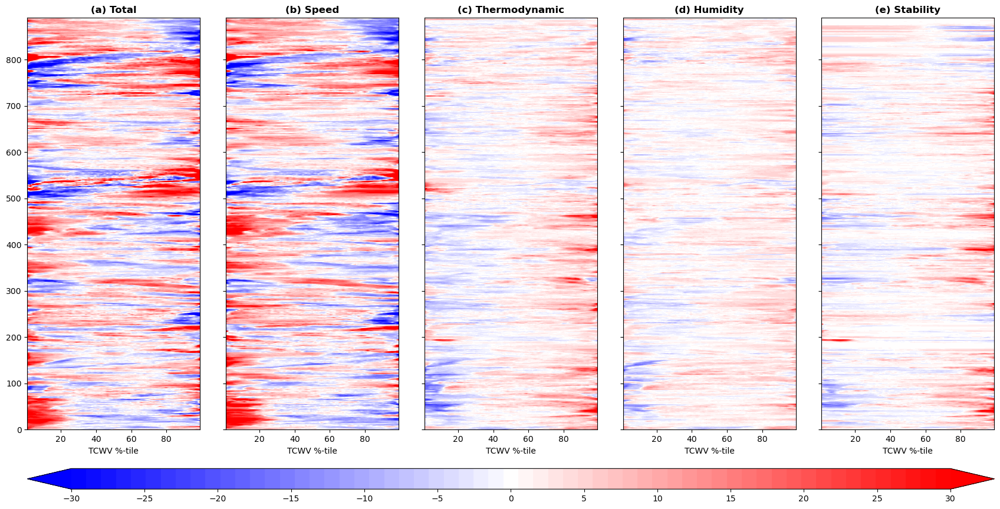

In [44]:
hov_plot_states(varis,JJA_org_hovx,JJA_org_hov,'Organised_JJA',levels,ticks,[])

### Inputs, so raw variables

In [45]:
JJA_org_input_hov,JJA_org_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                                    time_org_JJA,sta_date,end_date)

Date: 2016-06-01 00:00:00
Date: 2016-06-01 01:00:00
Date: 2016-06-01 02:00:00
Date: 2016-06-01 03:00:00
Date: 2016-06-01 04:00:00
Date: 2016-06-01 05:00:00
Date: 2016-06-01 06:00:00
Date: 2016-06-01 07:00:00
Date: 2017-06-02 22:00:00
Date: 2017-06-02 23:00:00
Date: 2017-06-03 00:00:00
Date: 2017-06-03 01:00:00
Date: 2017-06-03 02:00:00
Date: 2017-06-03 03:00:00
Date: 2017-06-03 04:00:00
Date: 2017-06-03 05:00:00
Date: 2017-06-03 06:00:00
Date: 2017-06-03 07:00:00
Date: 2017-06-03 08:00:00
Date: 2017-06-03 09:00:00
Date: 2017-06-03 10:00:00
Date: 2017-06-03 11:00:00
Date: 2017-06-03 12:00:00
Date: 2017-06-03 13:00:00
Date: 2017-06-03 14:00:00
Date: 2017-06-03 15:00:00
Date: 2017-06-03 16:00:00
Date: 2017-06-03 17:00:00
Date: 2017-06-03 18:00:00
Date: 2017-06-03 19:00:00
Date: 2017-06-03 20:00:00
Date: 2017-06-03 21:00:00
Date: 2017-06-03 22:00:00
Date: 2017-06-03 23:00:00
Date: 2017-06-04 00:00:00
Date: 2017-06-04 01:00:00
Date: 2017-06-04 02:00:00
Date: 2017-06-04 03:00:00
Date: 2017-0

Date: 2019-06-13 00:00:00
Date: 2019-06-13 01:00:00
Date: 2019-06-13 02:00:00
Date: 2019-06-13 03:00:00
Date: 2019-06-13 04:00:00
Date: 2019-06-13 05:00:00
Date: 2019-06-13 06:00:00
Date: 2019-06-13 07:00:00
Date: 2019-06-13 08:00:00
Date: 2019-06-13 09:00:00
Date: 2019-06-13 10:00:00
Date: 2019-06-13 11:00:00
Date: 2019-06-13 12:00:00
Date: 2019-06-13 13:00:00
Date: 2019-06-13 14:00:00
Date: 2019-06-13 15:00:00
Date: 2019-06-13 16:00:00
Date: 2019-06-13 17:00:00
Date: 2019-06-13 18:00:00
Date: 2019-06-13 19:00:00
Date: 2019-06-13 20:00:00
Date: 2019-06-13 21:00:00
Date: 2019-06-13 22:00:00
Date: 2019-06-13 23:00:00
Date: 2019-06-14 00:00:00
Date: 2019-06-14 01:00:00
Date: 2019-06-14 02:00:00
Date: 2019-06-14 03:00:00
Date: 2019-06-14 04:00:00
Date: 2019-06-14 05:00:00
Date: 2019-06-14 06:00:00
Date: 2019-06-14 07:00:00
Date: 2019-06-14 08:00:00
Date: 2019-06-14 09:00:00
Date: 2019-06-14 10:00:00
Date: 2019-06-14 11:00:00
Date: 2019-06-14 12:00:00
Date: 2019-06-14 13:00:00
Date: 2019-0

Date: 2019-08-03 08:00:00
Date: 2019-08-03 09:00:00
Date: 2019-08-03 10:00:00
Date: 2019-08-03 11:00:00
Date: 2019-08-03 12:00:00
Date: 2019-08-03 13:00:00
Date: 2019-08-03 14:00:00
Date: 2019-08-03 15:00:00
Date: 2019-08-03 16:00:00
Date: 2019-08-03 17:00:00
Date: 2019-08-03 18:00:00
Date: 2019-08-03 19:00:00
Date: 2019-08-03 20:00:00
Date: 2019-08-03 21:00:00
Date: 2019-08-03 22:00:00
Date: 2019-08-03 23:00:00
Date: 2019-08-04 22:00:00
Date: 2019-08-04 23:00:00
Date: 2019-08-05 00:00:00
Date: 2019-08-05 01:00:00
Date: 2019-08-05 02:00:00
Date: 2019-08-05 03:00:00
Date: 2019-08-05 04:00:00
Date: 2019-08-05 05:00:00
Date: 2019-08-05 06:00:00
Date: 2019-08-05 07:00:00
Date: 2019-08-05 08:00:00
Date: 2019-08-05 09:00:00
Date: 2019-08-05 10:00:00
Date: 2019-08-05 11:00:00
Date: 2019-08-05 12:00:00
Date: 2019-08-05 13:00:00
Date: 2019-08-05 14:00:00
Date: 2019-08-05 15:00:00
Date: 2019-08-05 16:00:00
Date: 2019-08-05 17:00:00
Date: 2019-08-05 18:00:00
Date: 2019-08-05 19:00:00
Date: 2019-0

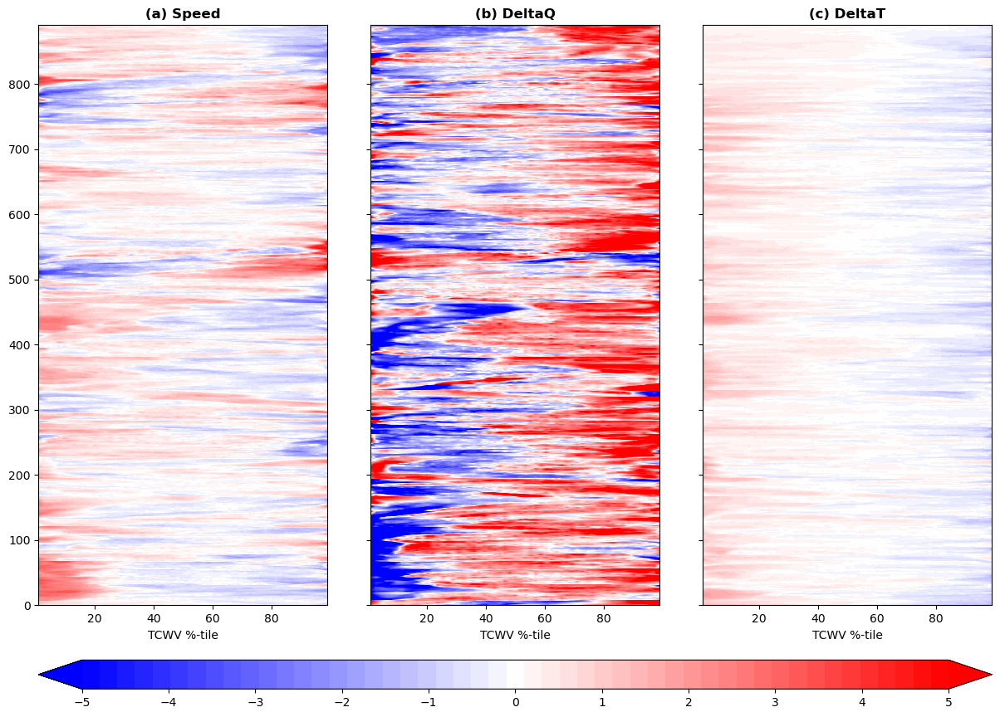

In [46]:
JJA_org_input_hov['DeltaQ'] = JJA_org_input_hov['DeltaQ']*10000
hov_plot_states(varis1,JJA_org_input_hovx,JJA_org_input_hov,'Organised_JJA_input',
                np.linspace(-5,5,50),np.arange(-5,5.1,1),[])

## MAM

### Neural Net

In [47]:
#### Dates for Organised!
##Org
time_org_MAM = sel_season(df_org,3,4,5)
sta_date,end_date = '2016-01-01 00:00:00','2019-12-31 23:00:00'
MAM_org_hov,MAM_org_hovx,nx = hovmuller_ML(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                           time_org_MAM,sta_date,end_date)

Date: 2016-03-01 02:00:00
Date: 2016-03-01 03:00:00
Date: 2016-03-01 04:00:00
Date: 2016-03-01 05:00:00
Date: 2016-03-01 06:00:00
Date: 2016-03-01 07:00:00
Date: 2016-03-01 08:00:00
Date: 2016-03-01 09:00:00
Date: 2016-03-01 10:00:00
Date: 2016-03-01 11:00:00
Date: 2016-03-01 12:00:00
Date: 2016-03-01 13:00:00
Date: 2016-03-01 14:00:00
Date: 2016-03-01 15:00:00
Date: 2016-03-01 16:00:00
Date: 2016-03-01 17:00:00
Date: 2016-03-01 18:00:00
Date: 2016-03-01 19:00:00
Date: 2016-03-01 20:00:00
Date: 2016-03-01 21:00:00
Date: 2016-03-01 22:00:00
Date: 2016-03-01 23:00:00
Date: 2016-03-02 00:00:00
Date: 2016-03-02 01:00:00
Date: 2016-03-02 02:00:00
Date: 2016-03-02 03:00:00
Date: 2016-03-02 04:00:00
Date: 2016-03-02 05:00:00
Date: 2016-03-02 06:00:00
Date: 2016-03-02 07:00:00
Date: 2016-03-02 08:00:00
Date: 2016-03-02 09:00:00
Date: 2016-03-02 10:00:00
Date: 2016-03-02 11:00:00
Date: 2016-03-02 12:00:00
Date: 2016-03-02 13:00:00
Date: 2016-03-02 14:00:00
Date: 2016-03-02 15:00:00
Date: 2016-0

Date: 2016-03-19 01:00:00
Date: 2016-03-19 02:00:00
Date: 2016-03-19 03:00:00
Date: 2016-03-19 04:00:00
Date: 2016-03-19 05:00:00
Date: 2016-03-19 06:00:00
Date: 2016-03-19 07:00:00
Date: 2016-03-19 23:00:00
Date: 2016-03-20 00:00:00
Date: 2016-03-20 01:00:00
Date: 2016-03-20 02:00:00
Date: 2016-03-20 03:00:00
Date: 2016-03-20 04:00:00
Date: 2016-03-20 05:00:00
Date: 2016-03-20 06:00:00
Date: 2016-03-20 07:00:00
Date: 2016-03-20 08:00:00
Date: 2016-03-20 09:00:00
Date: 2016-03-20 10:00:00
Date: 2016-03-20 11:00:00
Date: 2016-03-20 12:00:00
Date: 2016-03-20 13:00:00
Date: 2016-03-20 14:00:00
Date: 2016-03-20 15:00:00
Date: 2016-03-20 16:00:00
Date: 2016-03-20 17:00:00
Date: 2016-03-20 18:00:00
Date: 2016-03-20 19:00:00
Date: 2016-03-20 20:00:00
Date: 2016-03-20 21:00:00
Date: 2016-03-20 22:00:00
Date: 2016-03-20 23:00:00
Date: 2016-03-21 00:00:00
Date: 2016-03-21 01:00:00
Date: 2016-03-21 02:00:00
Date: 2016-03-21 03:00:00
Date: 2016-03-21 04:00:00
Date: 2016-03-21 05:00:00
Date: 2016-0

Date: 2016-04-08 01:00:00
Date: 2016-04-08 02:00:00
Date: 2016-04-08 03:00:00
Date: 2016-04-08 04:00:00
Date: 2016-04-08 05:00:00
Date: 2016-04-08 06:00:00
Date: 2016-04-08 07:00:00
Date: 2016-04-08 08:00:00
Date: 2016-04-08 09:00:00
Date: 2016-04-08 10:00:00
Date: 2016-04-08 11:00:00
Date: 2016-04-08 12:00:00
Date: 2016-04-08 13:00:00
Date: 2016-04-08 14:00:00
Date: 2016-04-08 15:00:00
Date: 2016-04-08 16:00:00
Date: 2016-04-08 17:00:00
Date: 2016-04-08 18:00:00
Date: 2016-04-08 19:00:00
Date: 2016-04-08 20:00:00
Date: 2016-04-08 21:00:00
Date: 2016-04-08 22:00:00
Date: 2016-04-08 23:00:00
Date: 2016-04-09 00:00:00
Date: 2016-04-09 01:00:00
Date: 2016-04-09 02:00:00
Date: 2016-04-09 03:00:00
Date: 2016-04-09 04:00:00
Date: 2016-04-09 05:00:00
Date: 2016-04-09 06:00:00
Date: 2016-04-09 07:00:00
Date: 2016-04-09 08:00:00
Date: 2016-04-09 09:00:00
Date: 2016-04-09 10:00:00
Date: 2016-04-09 11:00:00
Date: 2016-04-09 12:00:00
Date: 2016-04-09 13:00:00
Date: 2016-04-09 14:00:00
Date: 2016-0

Date: 2016-05-04 23:00:00
Date: 2016-05-05 00:00:00
Date: 2016-05-05 01:00:00
Date: 2016-05-05 02:00:00
Date: 2016-05-05 03:00:00
Date: 2016-05-05 04:00:00
Date: 2016-05-05 05:00:00
Date: 2016-05-05 06:00:00
Date: 2016-05-05 07:00:00
Date: 2016-05-05 08:00:00
Date: 2016-05-05 09:00:00
Date: 2016-05-05 10:00:00
Date: 2016-05-05 11:00:00
Date: 2016-05-05 12:00:00
Date: 2016-05-05 13:00:00
Date: 2016-05-05 14:00:00
Date: 2016-05-05 15:00:00
Date: 2016-05-05 16:00:00
Date: 2016-05-05 17:00:00
Date: 2016-05-05 18:00:00
Date: 2016-05-05 19:00:00
Date: 2016-05-05 20:00:00
Date: 2016-05-05 21:00:00
Date: 2016-05-05 22:00:00
Date: 2016-05-05 23:00:00
Date: 2016-05-06 00:00:00
Date: 2016-05-06 01:00:00
Date: 2016-05-06 02:00:00
Date: 2016-05-06 03:00:00
Date: 2016-05-06 04:00:00
Date: 2016-05-06 05:00:00
Date: 2016-05-06 06:00:00
Date: 2016-05-06 07:00:00
Date: 2016-05-06 08:00:00
Date: 2016-05-06 09:00:00
Date: 2016-05-06 10:00:00
Date: 2016-05-06 11:00:00
Date: 2016-05-06 12:00:00
Date: 2016-0

Date: 2016-05-28 19:00:00
Date: 2016-05-28 20:00:00
Date: 2016-05-28 21:00:00
Date: 2016-05-28 22:00:00
Date: 2016-05-28 23:00:00
Date: 2016-05-29 00:00:00
Date: 2016-05-29 01:00:00
Date: 2016-05-29 02:00:00
Date: 2016-05-29 03:00:00
Date: 2016-05-29 04:00:00
Date: 2016-05-29 05:00:00
Date: 2016-05-29 06:00:00
Date: 2016-05-29 07:00:00
Date: 2016-05-29 08:00:00
Date: 2016-05-29 09:00:00
Date: 2016-05-29 10:00:00
Date: 2016-05-29 11:00:00
Date: 2016-05-29 12:00:00
Date: 2016-05-29 13:00:00
Date: 2016-05-29 14:00:00
Date: 2016-05-29 15:00:00
Date: 2016-05-29 16:00:00
Date: 2016-05-29 17:00:00
Date: 2016-05-29 18:00:00
Date: 2016-05-29 19:00:00
Date: 2016-05-29 20:00:00
Date: 2016-05-29 21:00:00
Date: 2016-05-29 22:00:00
Date: 2016-05-29 23:00:00
Date: 2016-05-30 00:00:00
Date: 2016-05-30 01:00:00
Date: 2016-05-30 02:00:00
Date: 2016-05-30 03:00:00
Date: 2016-05-30 04:00:00
Date: 2016-05-30 05:00:00
Date: 2016-05-30 15:00:00
Date: 2016-05-30 16:00:00
Date: 2016-05-30 17:00:00
Date: 2016-0

Date: 2017-03-22 23:00:00
Date: 2017-03-23 00:00:00
Date: 2017-03-23 01:00:00
Date: 2017-03-23 02:00:00
Date: 2017-03-23 03:00:00
Date: 2017-03-23 04:00:00
Date: 2017-03-23 05:00:00
Date: 2017-03-23 06:00:00
Date: 2017-03-23 07:00:00
Date: 2017-03-23 08:00:00
Date: 2017-03-23 09:00:00
Date: 2017-03-23 10:00:00
Date: 2017-03-23 11:00:00
Date: 2017-03-23 12:00:00
Date: 2017-03-23 13:00:00
Date: 2017-03-23 14:00:00
Date: 2017-03-23 15:00:00
Date: 2017-03-23 16:00:00
Date: 2017-03-23 17:00:00
Date: 2017-03-23 18:00:00
Date: 2017-03-23 19:00:00
Date: 2017-03-23 20:00:00
Date: 2017-03-23 21:00:00
Date: 2017-03-23 22:00:00
Date: 2017-03-23 23:00:00
Date: 2017-03-24 00:00:00
Date: 2017-03-24 01:00:00
Date: 2017-03-24 02:00:00
Date: 2017-03-24 03:00:00
Date: 2017-03-24 04:00:00
Date: 2017-03-24 05:00:00
Date: 2017-03-24 06:00:00
Date: 2017-03-24 07:00:00
Date: 2017-03-24 08:00:00
Date: 2017-03-24 09:00:00
Date: 2017-03-24 10:00:00
Date: 2017-03-24 11:00:00
Date: 2017-03-24 12:00:00
Date: 2017-0

Date: 2017-04-08 17:00:00
Date: 2017-04-08 18:00:00
Date: 2017-04-08 19:00:00
Date: 2017-04-08 20:00:00
Date: 2017-04-08 21:00:00
Date: 2017-04-08 22:00:00
Date: 2017-04-08 23:00:00
Date: 2017-04-09 00:00:00
Date: 2017-04-09 01:00:00
Date: 2017-04-09 02:00:00
Date: 2017-04-09 03:00:00
Date: 2017-04-09 04:00:00
Date: 2017-04-09 05:00:00
Date: 2017-04-09 06:00:00
Date: 2017-04-09 07:00:00
Date: 2017-04-09 08:00:00
Date: 2017-04-09 09:00:00
Date: 2017-04-09 10:00:00
Date: 2017-04-09 11:00:00
Date: 2017-04-09 12:00:00
Date: 2017-04-09 13:00:00
Date: 2017-04-09 14:00:00
Date: 2017-04-09 15:00:00
Date: 2017-04-09 16:00:00
Date: 2017-04-09 17:00:00
Date: 2017-04-09 18:00:00
Date: 2017-04-09 19:00:00
Date: 2017-04-09 20:00:00
Date: 2017-04-09 21:00:00
Date: 2017-04-09 22:00:00
Date: 2017-04-09 23:00:00
Date: 2017-04-10 00:00:00
Date: 2017-04-10 01:00:00
Date: 2017-04-10 02:00:00
Date: 2017-04-10 03:00:00
Date: 2017-04-10 04:00:00
Date: 2017-04-10 05:00:00
Date: 2017-04-10 06:00:00
Date: 2017-0

Date: 2017-05-04 02:00:00
Date: 2017-05-04 03:00:00
Date: 2017-05-04 04:00:00
Date: 2017-05-04 05:00:00
Date: 2017-05-04 06:00:00
Date: 2017-05-04 07:00:00
Date: 2017-05-04 08:00:00
Date: 2017-05-04 09:00:00
Date: 2017-05-04 10:00:00
Date: 2017-05-04 11:00:00
Date: 2017-05-04 12:00:00
Date: 2017-05-04 13:00:00
Date: 2017-05-04 14:00:00
Date: 2017-05-04 15:00:00
Date: 2017-05-04 16:00:00
Date: 2017-05-04 17:00:00
Date: 2017-05-04 18:00:00
Date: 2017-05-04 19:00:00
Date: 2017-05-04 20:00:00
Date: 2017-05-04 21:00:00
Date: 2017-05-04 22:00:00
Date: 2017-05-04 23:00:00
Date: 2017-05-05 00:00:00
Date: 2017-05-05 01:00:00
Date: 2017-05-05 02:00:00
Date: 2017-05-05 03:00:00
Date: 2017-05-05 04:00:00
Date: 2017-05-05 05:00:00
Date: 2017-05-05 06:00:00
Date: 2017-05-05 07:00:00
Date: 2017-05-05 08:00:00
Date: 2017-05-05 09:00:00
Date: 2017-05-05 10:00:00
Date: 2017-05-05 11:00:00
Date: 2017-05-05 12:00:00
Date: 2017-05-05 13:00:00
Date: 2017-05-05 14:00:00
Date: 2017-05-06 14:00:00
Date: 2017-0

Date: 2017-05-23 14:00:00
Date: 2017-05-23 15:00:00
Date: 2017-05-23 16:00:00
Date: 2017-05-23 17:00:00
Date: 2017-05-23 18:00:00
Date: 2017-05-23 19:00:00
Date: 2017-05-23 20:00:00
Date: 2017-05-23 21:00:00
Date: 2017-05-23 22:00:00
Date: 2017-05-23 23:00:00
Date: 2017-05-24 00:00:00
Date: 2017-05-24 01:00:00
Date: 2017-05-24 02:00:00
Date: 2017-05-24 03:00:00
Date: 2017-05-24 04:00:00
Date: 2017-05-24 05:00:00
Date: 2017-05-24 06:00:00
Date: 2017-05-24 07:00:00
Date: 2017-05-24 08:00:00
Date: 2017-05-24 09:00:00
Date: 2017-05-24 10:00:00
Date: 2017-05-24 11:00:00
Date: 2017-05-24 12:00:00
Date: 2017-05-24 13:00:00
Date: 2017-05-24 14:00:00
Date: 2017-05-24 15:00:00
Date: 2017-05-24 16:00:00
Date: 2017-05-24 17:00:00
Date: 2017-05-24 18:00:00
Date: 2017-05-24 19:00:00
Date: 2017-05-24 20:00:00
Date: 2017-05-24 21:00:00
Date: 2017-05-24 22:00:00
Date: 2017-05-24 23:00:00
Date: 2017-05-25 00:00:00
Date: 2017-05-25 01:00:00
Date: 2017-05-25 02:00:00
Date: 2017-05-25 03:00:00
Date: 2017-0

Date: 2018-03-10 15:00:00
Date: 2018-03-10 16:00:00
Date: 2018-03-10 17:00:00
Date: 2018-03-10 18:00:00
Date: 2018-03-10 19:00:00
Date: 2018-03-10 20:00:00
Date: 2018-03-10 21:00:00
Date: 2018-03-10 22:00:00
Date: 2018-03-10 23:00:00
Date: 2018-03-11 00:00:00
Date: 2018-03-11 01:00:00
Date: 2018-03-11 02:00:00
Date: 2018-03-11 03:00:00
Date: 2018-03-11 04:00:00
Date: 2018-03-11 05:00:00
Date: 2018-03-11 06:00:00
Date: 2018-03-11 07:00:00
Date: 2018-03-11 08:00:00
Date: 2018-03-11 09:00:00
Date: 2018-03-11 10:00:00
Date: 2018-03-11 11:00:00
Date: 2018-03-11 12:00:00
Date: 2018-03-11 13:00:00
Date: 2018-03-11 14:00:00
Date: 2018-03-11 15:00:00
Date: 2018-03-11 16:00:00
Date: 2018-03-11 17:00:00
Date: 2018-03-11 18:00:00
Date: 2018-03-11 19:00:00
Date: 2018-03-11 20:00:00
Date: 2018-03-11 21:00:00
Date: 2018-03-11 22:00:00
Date: 2018-03-11 23:00:00
Date: 2018-03-12 00:00:00
Date: 2018-03-12 01:00:00
Date: 2018-03-12 02:00:00
Date: 2018-03-12 03:00:00
Date: 2018-03-12 04:00:00
Date: 2018-0

Date: 2018-04-10 18:00:00
Date: 2018-04-10 19:00:00
Date: 2018-04-10 20:00:00
Date: 2018-04-10 21:00:00
Date: 2018-04-10 22:00:00
Date: 2018-04-10 23:00:00
Date: 2018-04-11 00:00:00
Date: 2018-04-11 01:00:00
Date: 2018-04-11 02:00:00
Date: 2018-04-11 03:00:00
Date: 2018-04-11 04:00:00
Date: 2018-04-11 05:00:00
Date: 2018-04-11 06:00:00
Date: 2018-04-11 07:00:00
Date: 2018-04-11 08:00:00
Date: 2018-04-11 09:00:00
Date: 2018-04-11 10:00:00
Date: 2018-04-11 11:00:00
Date: 2018-04-11 12:00:00
Date: 2018-04-11 13:00:00
Date: 2018-04-11 14:00:00
Date: 2018-04-11 15:00:00
Date: 2018-04-11 16:00:00
Date: 2018-04-11 17:00:00
Date: 2018-04-11 18:00:00
Date: 2018-04-11 19:00:00
Date: 2018-04-11 20:00:00
Date: 2018-04-11 21:00:00
Date: 2018-04-11 22:00:00
Date: 2018-04-11 23:00:00
Date: 2018-04-12 00:00:00
Date: 2018-04-12 01:00:00
Date: 2018-04-12 02:00:00
Date: 2018-04-12 03:00:00
Date: 2018-04-17 18:00:00
Date: 2018-04-17 19:00:00
Date: 2018-04-17 20:00:00
Date: 2018-04-17 21:00:00
Date: 2018-0

Date: 2018-05-17 15:00:00
Date: 2018-05-17 16:00:00
Date: 2018-05-17 17:00:00
Date: 2018-05-17 18:00:00
Date: 2018-05-17 19:00:00
Date: 2018-05-17 20:00:00
Date: 2018-05-22 08:00:00
Date: 2018-05-22 09:00:00
Date: 2018-05-22 10:00:00
Date: 2018-05-22 11:00:00
Date: 2018-05-22 12:00:00
Date: 2018-05-22 13:00:00
Date: 2018-05-22 14:00:00
Date: 2018-05-22 15:00:00
Date: 2018-05-22 16:00:00
Date: 2018-05-22 17:00:00
Date: 2018-05-22 18:00:00
Date: 2018-05-22 19:00:00
Date: 2018-05-22 20:00:00
Date: 2018-05-22 21:00:00
Date: 2018-05-22 22:00:00
Date: 2018-05-22 23:00:00
Date: 2018-05-23 00:00:00
Date: 2018-05-23 01:00:00
Date: 2018-05-23 02:00:00
Date: 2018-05-23 03:00:00
Date: 2018-05-23 04:00:00
Date: 2018-05-23 05:00:00
Date: 2018-05-23 06:00:00
Date: 2018-05-23 07:00:00
Date: 2018-05-23 08:00:00
Date: 2018-05-23 09:00:00
Date: 2018-05-23 10:00:00
Date: 2018-05-23 11:00:00
Date: 2018-05-23 12:00:00
Date: 2018-05-23 13:00:00
Date: 2018-05-23 14:00:00
Date: 2018-05-23 15:00:00
Date: 2018-0

Date: 2019-03-14 09:00:00
Date: 2019-03-14 10:00:00
Date: 2019-03-14 11:00:00
Date: 2019-03-14 12:00:00
Date: 2019-03-14 13:00:00
Date: 2019-03-14 14:00:00
Date: 2019-03-14 15:00:00
Date: 2019-03-14 16:00:00
Date: 2019-03-14 17:00:00
Date: 2019-03-14 18:00:00
Date: 2019-03-14 19:00:00
Date: 2019-03-14 20:00:00
Date: 2019-03-14 21:00:00
Date: 2019-03-14 22:00:00
Date: 2019-03-14 23:00:00
Date: 2019-03-15 00:00:00
Date: 2019-03-15 01:00:00
Date: 2019-03-15 02:00:00
Date: 2019-03-15 03:00:00
Date: 2019-03-15 04:00:00
Date: 2019-03-15 05:00:00
Date: 2019-03-15 06:00:00
Date: 2019-03-15 07:00:00
Date: 2019-03-15 08:00:00
Date: 2019-03-15 09:00:00
Date: 2019-03-15 10:00:00
Date: 2019-03-15 11:00:00
Date: 2019-03-17 22:00:00
Date: 2019-03-17 23:00:00
Date: 2019-03-18 00:00:00
Date: 2019-03-18 01:00:00
Date: 2019-03-18 02:00:00
Date: 2019-03-18 03:00:00
Date: 2019-03-18 04:00:00
Date: 2019-03-18 05:00:00
Date: 2019-03-18 06:00:00
Date: 2019-03-18 07:00:00
Date: 2019-03-18 08:00:00
Date: 2019-0

Date: 2019-04-10 08:00:00
Date: 2019-04-10 09:00:00
Date: 2019-04-10 10:00:00
Date: 2019-04-10 11:00:00
Date: 2019-04-10 12:00:00
Date: 2019-04-10 13:00:00
Date: 2019-04-10 14:00:00
Date: 2019-04-10 15:00:00
Date: 2019-04-10 16:00:00
Date: 2019-04-10 17:00:00
Date: 2019-04-10 18:00:00
Date: 2019-04-10 19:00:00
Date: 2019-04-10 20:00:00
Date: 2019-04-10 21:00:00
Date: 2019-04-10 22:00:00
Date: 2019-04-10 23:00:00
Date: 2019-04-11 00:00:00
Date: 2019-04-11 01:00:00
Date: 2019-04-11 02:00:00
Date: 2019-04-11 03:00:00
Date: 2019-04-11 04:00:00
Date: 2019-04-11 05:00:00
Date: 2019-04-11 06:00:00
Date: 2019-04-11 07:00:00
Date: 2019-04-11 08:00:00
Date: 2019-04-11 09:00:00
Date: 2019-04-11 10:00:00
Date: 2019-04-11 11:00:00
Date: 2019-04-11 12:00:00
Date: 2019-04-11 13:00:00
Date: 2019-04-11 14:00:00
Date: 2019-04-11 15:00:00
Date: 2019-04-11 16:00:00
Date: 2019-04-11 17:00:00
Date: 2019-04-11 18:00:00
Date: 2019-04-11 19:00:00
Date: 2019-04-11 20:00:00
Date: 2019-04-11 21:00:00
Date: 2019-0

Date: 2019-04-28 14:00:00
Date: 2019-04-28 15:00:00
Date: 2019-04-28 16:00:00
Date: 2019-04-28 17:00:00
Date: 2019-04-28 18:00:00
Date: 2019-04-28 19:00:00
Date: 2019-04-28 20:00:00
Date: 2019-04-28 21:00:00
Date: 2019-04-28 22:00:00
Date: 2019-04-28 23:00:00
Date: 2019-04-29 00:00:00
Date: 2019-04-29 01:00:00
Date: 2019-04-29 02:00:00
Date: 2019-04-29 03:00:00
Date: 2019-04-29 04:00:00
Date: 2019-04-29 05:00:00
Date: 2019-04-29 06:00:00
Date: 2019-04-29 07:00:00
Date: 2019-04-29 08:00:00
Date: 2019-04-29 09:00:00
Date: 2019-04-29 10:00:00
Date: 2019-04-29 11:00:00
Date: 2019-04-29 12:00:00
Date: 2019-04-29 13:00:00
Date: 2019-04-29 14:00:00
Date: 2019-04-29 15:00:00
Date: 2019-04-29 16:00:00
Date: 2019-04-29 17:00:00
Date: 2019-04-29 18:00:00
Date: 2019-04-29 19:00:00
Date: 2019-04-29 20:00:00
Date: 2019-04-29 21:00:00
Date: 2019-04-29 22:00:00
Date: 2019-04-29 23:00:00
Date: 2019-04-30 00:00:00
Date: 2019-04-30 01:00:00
Date: 2019-04-30 02:00:00
Date: 2019-04-30 03:00:00
Date: 2019-0

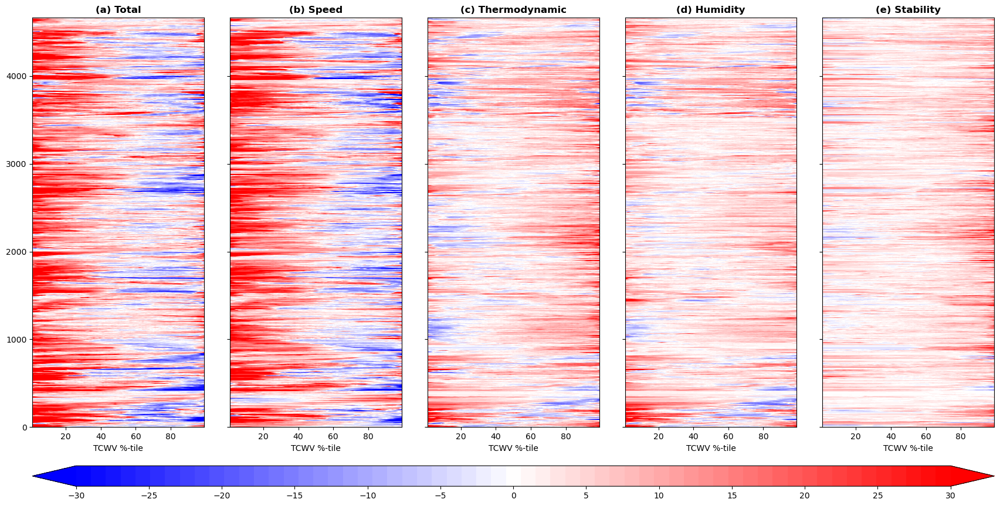

In [48]:
hov_plot_states(varis,MAM_org_hovx,MAM_org_hov,'Organised_MAM',levels,ticks,[])

### Inputs, so raw variables

In [49]:
MAM_org_input_hov,MAM_org_input_hovx,nx = hov_input(ds_tcwv,ds_lh,ds_sst,ds_ps,ds_q0,ds_t2,ds_u10,ds_v10,
                                                    time_org_MAM,sta_date,end_date)

Date: 2016-03-01 02:00:00
Date: 2016-03-01 03:00:00
Date: 2016-03-01 04:00:00
Date: 2016-03-01 05:00:00
Date: 2016-03-01 06:00:00
Date: 2016-03-01 07:00:00
Date: 2016-03-01 08:00:00
Date: 2016-03-01 09:00:00
Date: 2016-03-01 10:00:00
Date: 2016-03-01 11:00:00
Date: 2016-03-01 12:00:00
Date: 2016-03-01 13:00:00
Date: 2016-03-01 14:00:00
Date: 2016-03-01 15:00:00
Date: 2016-03-01 16:00:00
Date: 2016-03-01 17:00:00
Date: 2016-03-01 18:00:00
Date: 2016-03-01 19:00:00
Date: 2016-03-01 20:00:00
Date: 2016-03-01 21:00:00
Date: 2016-03-01 22:00:00
Date: 2016-03-01 23:00:00
Date: 2016-03-02 00:00:00
Date: 2016-03-02 01:00:00
Date: 2016-03-02 02:00:00
Date: 2016-03-02 03:00:00
Date: 2016-03-02 04:00:00
Date: 2016-03-02 05:00:00
Date: 2016-03-02 06:00:00
Date: 2016-03-02 07:00:00
Date: 2016-03-02 08:00:00
Date: 2016-03-02 09:00:00
Date: 2016-03-02 10:00:00
Date: 2016-03-02 11:00:00
Date: 2016-03-02 12:00:00
Date: 2016-03-02 13:00:00
Date: 2016-03-02 14:00:00
Date: 2016-03-02 15:00:00
Date: 2016-0

Date: 2016-03-19 01:00:00
Date: 2016-03-19 02:00:00
Date: 2016-03-19 03:00:00
Date: 2016-03-19 04:00:00
Date: 2016-03-19 05:00:00
Date: 2016-03-19 06:00:00
Date: 2016-03-19 07:00:00
Date: 2016-03-19 23:00:00
Date: 2016-03-20 00:00:00
Date: 2016-03-20 01:00:00
Date: 2016-03-20 02:00:00
Date: 2016-03-20 03:00:00
Date: 2016-03-20 04:00:00
Date: 2016-03-20 05:00:00
Date: 2016-03-20 06:00:00
Date: 2016-03-20 07:00:00
Date: 2016-03-20 08:00:00
Date: 2016-03-20 09:00:00
Date: 2016-03-20 10:00:00
Date: 2016-03-20 11:00:00
Date: 2016-03-20 12:00:00
Date: 2016-03-20 13:00:00
Date: 2016-03-20 14:00:00
Date: 2016-03-20 15:00:00
Date: 2016-03-20 16:00:00
Date: 2016-03-20 17:00:00
Date: 2016-03-20 18:00:00
Date: 2016-03-20 19:00:00
Date: 2016-03-20 20:00:00
Date: 2016-03-20 21:00:00
Date: 2016-03-20 22:00:00
Date: 2016-03-20 23:00:00
Date: 2016-03-21 00:00:00
Date: 2016-03-21 01:00:00
Date: 2016-03-21 02:00:00
Date: 2016-03-21 03:00:00
Date: 2016-03-21 04:00:00
Date: 2016-03-21 05:00:00
Date: 2016-0

Date: 2016-04-08 04:00:00
Date: 2016-04-08 05:00:00
Date: 2016-04-08 06:00:00
Date: 2016-04-08 07:00:00
Date: 2016-04-08 08:00:00
Date: 2016-04-08 09:00:00
Date: 2016-04-08 10:00:00
Date: 2016-04-08 11:00:00
Date: 2016-04-08 12:00:00
Date: 2016-04-08 13:00:00
Date: 2016-04-08 14:00:00
Date: 2016-04-08 15:00:00
Date: 2016-04-08 16:00:00
Date: 2016-04-08 17:00:00
Date: 2016-04-08 18:00:00
Date: 2016-04-08 19:00:00
Date: 2016-04-08 20:00:00
Date: 2016-04-08 21:00:00
Date: 2016-04-08 22:00:00
Date: 2016-04-08 23:00:00
Date: 2016-04-09 00:00:00
Date: 2016-04-09 01:00:00
Date: 2016-04-09 02:00:00
Date: 2016-04-09 03:00:00
Date: 2016-04-09 04:00:00
Date: 2016-04-09 05:00:00
Date: 2016-04-09 06:00:00
Date: 2016-04-09 07:00:00
Date: 2016-04-09 08:00:00
Date: 2016-04-09 09:00:00
Date: 2016-04-09 10:00:00
Date: 2016-04-09 11:00:00
Date: 2016-04-09 12:00:00
Date: 2016-04-09 13:00:00
Date: 2016-04-09 14:00:00
Date: 2016-04-09 15:00:00
Date: 2016-04-09 16:00:00
Date: 2016-04-09 17:00:00
Date: 2016-0

Date: 2016-05-05 07:00:00
Date: 2016-05-05 08:00:00
Date: 2016-05-05 09:00:00
Date: 2016-05-05 10:00:00
Date: 2016-05-05 11:00:00
Date: 2016-05-05 12:00:00
Date: 2016-05-05 13:00:00
Date: 2016-05-05 14:00:00
Date: 2016-05-05 15:00:00
Date: 2016-05-05 16:00:00
Date: 2016-05-05 17:00:00
Date: 2016-05-05 18:00:00
Date: 2016-05-05 19:00:00
Date: 2016-05-05 20:00:00
Date: 2016-05-05 21:00:00
Date: 2016-05-05 22:00:00
Date: 2016-05-05 23:00:00
Date: 2016-05-06 00:00:00
Date: 2016-05-06 01:00:00
Date: 2016-05-06 02:00:00
Date: 2016-05-06 03:00:00
Date: 2016-05-06 04:00:00
Date: 2016-05-06 05:00:00
Date: 2016-05-06 06:00:00
Date: 2016-05-06 07:00:00
Date: 2016-05-06 08:00:00
Date: 2016-05-06 09:00:00
Date: 2016-05-06 10:00:00
Date: 2016-05-06 11:00:00
Date: 2016-05-06 12:00:00
Date: 2016-05-06 13:00:00
Date: 2016-05-06 14:00:00
Date: 2016-05-06 15:00:00
Date: 2016-05-06 16:00:00
Date: 2016-05-06 17:00:00
Date: 2016-05-06 18:00:00
Date: 2016-05-06 19:00:00
Date: 2016-05-06 20:00:00
Date: 2016-0

Date: 2016-05-29 04:00:00
Date: 2016-05-29 05:00:00
Date: 2016-05-29 06:00:00
Date: 2016-05-29 07:00:00
Date: 2016-05-29 08:00:00
Date: 2016-05-29 09:00:00
Date: 2016-05-29 10:00:00
Date: 2016-05-29 11:00:00
Date: 2016-05-29 12:00:00
Date: 2016-05-29 13:00:00
Date: 2016-05-29 14:00:00
Date: 2016-05-29 15:00:00
Date: 2016-05-29 16:00:00
Date: 2016-05-29 17:00:00
Date: 2016-05-29 18:00:00
Date: 2016-05-29 19:00:00
Date: 2016-05-29 20:00:00
Date: 2016-05-29 21:00:00
Date: 2016-05-29 22:00:00
Date: 2016-05-29 23:00:00
Date: 2016-05-30 00:00:00
Date: 2016-05-30 01:00:00
Date: 2016-05-30 02:00:00
Date: 2016-05-30 03:00:00
Date: 2016-05-30 04:00:00
Date: 2016-05-30 05:00:00
Date: 2016-05-30 15:00:00
Date: 2016-05-30 16:00:00
Date: 2016-05-30 17:00:00
Date: 2016-05-30 18:00:00
Date: 2016-05-30 19:00:00
Date: 2016-05-30 20:00:00
Date: 2016-05-30 21:00:00
Date: 2016-05-30 22:00:00
Date: 2016-05-30 23:00:00
Date: 2016-05-31 00:00:00
Date: 2016-05-31 01:00:00
Date: 2016-05-31 02:00:00
Date: 2016-0

Date: 2017-03-23 11:00:00
Date: 2017-03-23 12:00:00
Date: 2017-03-23 13:00:00
Date: 2017-03-23 14:00:00
Date: 2017-03-23 15:00:00
Date: 2017-03-23 16:00:00
Date: 2017-03-23 17:00:00
Date: 2017-03-23 18:00:00
Date: 2017-03-23 19:00:00
Date: 2017-03-23 20:00:00
Date: 2017-03-23 21:00:00
Date: 2017-03-23 22:00:00
Date: 2017-03-23 23:00:00
Date: 2017-03-24 00:00:00
Date: 2017-03-24 01:00:00
Date: 2017-03-24 02:00:00
Date: 2017-03-24 03:00:00
Date: 2017-03-24 04:00:00
Date: 2017-03-24 05:00:00
Date: 2017-03-24 06:00:00
Date: 2017-03-24 07:00:00
Date: 2017-03-24 08:00:00
Date: 2017-03-24 09:00:00
Date: 2017-03-24 10:00:00
Date: 2017-03-24 11:00:00
Date: 2017-03-24 12:00:00
Date: 2017-03-24 13:00:00
Date: 2017-03-24 14:00:00
Date: 2017-03-24 15:00:00
Date: 2017-03-27 07:00:00
Date: 2017-03-27 08:00:00
Date: 2017-03-27 09:00:00
Date: 2017-03-27 10:00:00
Date: 2017-03-27 11:00:00
Date: 2017-03-27 12:00:00
Date: 2017-03-27 13:00:00
Date: 2017-03-27 14:00:00
Date: 2017-03-27 15:00:00
Date: 2017-0

Date: 2017-04-09 10:00:00
Date: 2017-04-09 11:00:00
Date: 2017-04-09 12:00:00
Date: 2017-04-09 13:00:00
Date: 2017-04-09 14:00:00
Date: 2017-04-09 15:00:00
Date: 2017-04-09 16:00:00
Date: 2017-04-09 17:00:00
Date: 2017-04-09 18:00:00
Date: 2017-04-09 19:00:00
Date: 2017-04-09 20:00:00
Date: 2017-04-09 21:00:00
Date: 2017-04-09 22:00:00
Date: 2017-04-09 23:00:00
Date: 2017-04-10 00:00:00
Date: 2017-04-10 01:00:00
Date: 2017-04-10 02:00:00
Date: 2017-04-10 03:00:00
Date: 2017-04-10 04:00:00
Date: 2017-04-10 05:00:00
Date: 2017-04-10 06:00:00
Date: 2017-04-10 07:00:00
Date: 2017-04-10 08:00:00
Date: 2017-04-10 09:00:00
Date: 2017-04-10 10:00:00
Date: 2017-04-10 11:00:00
Date: 2017-04-10 12:00:00
Date: 2017-04-10 13:00:00
Date: 2017-04-10 14:00:00
Date: 2017-04-10 15:00:00
Date: 2017-04-10 16:00:00
Date: 2017-04-10 17:00:00
Date: 2017-04-10 18:00:00
Date: 2017-04-10 19:00:00
Date: 2017-04-10 20:00:00
Date: 2017-04-14 04:00:00
Date: 2017-04-14 05:00:00
Date: 2017-04-14 06:00:00
Date: 2017-0

Date: 2017-05-04 23:00:00
Date: 2017-05-05 00:00:00
Date: 2017-05-05 01:00:00
Date: 2017-05-05 02:00:00
Date: 2017-05-05 03:00:00
Date: 2017-05-05 04:00:00
Date: 2017-05-05 05:00:00
Date: 2017-05-05 06:00:00
Date: 2017-05-05 07:00:00
Date: 2017-05-05 08:00:00
Date: 2017-05-05 09:00:00
Date: 2017-05-05 10:00:00
Date: 2017-05-05 11:00:00
Date: 2017-05-05 12:00:00
Date: 2017-05-05 13:00:00
Date: 2017-05-05 14:00:00
Date: 2017-05-06 14:00:00
Date: 2017-05-06 15:00:00
Date: 2017-05-06 16:00:00
Date: 2017-05-06 17:00:00
Date: 2017-05-06 18:00:00
Date: 2017-05-06 19:00:00
Date: 2017-05-06 20:00:00
Date: 2017-05-06 21:00:00
Date: 2017-05-06 22:00:00
Date: 2017-05-06 23:00:00
Date: 2017-05-07 00:00:00
Date: 2017-05-07 01:00:00
Date: 2017-05-07 02:00:00
Date: 2017-05-07 03:00:00
Date: 2017-05-07 04:00:00
Date: 2017-05-07 05:00:00
Date: 2017-05-07 06:00:00
Date: 2017-05-07 07:00:00
Date: 2017-05-07 08:00:00
Date: 2017-05-07 09:00:00
Date: 2017-05-07 10:00:00
Date: 2017-05-07 11:00:00
Date: 2017-0

Date: 2017-05-24 13:00:00
Date: 2017-05-24 14:00:00
Date: 2017-05-24 15:00:00
Date: 2017-05-24 16:00:00
Date: 2017-05-24 17:00:00
Date: 2017-05-24 18:00:00
Date: 2017-05-24 19:00:00
Date: 2017-05-24 20:00:00
Date: 2017-05-24 21:00:00
Date: 2017-05-24 22:00:00
Date: 2017-05-24 23:00:00
Date: 2017-05-25 00:00:00
Date: 2017-05-25 01:00:00
Date: 2017-05-25 02:00:00
Date: 2017-05-25 03:00:00
Date: 2017-05-25 04:00:00
Date: 2017-05-25 05:00:00
Date: 2017-05-25 06:00:00
Date: 2017-05-25 07:00:00
Date: 2017-05-25 08:00:00
Date: 2017-05-25 09:00:00
Date: 2017-05-25 10:00:00
Date: 2017-05-25 11:00:00
Date: 2017-05-25 12:00:00
Date: 2017-05-25 13:00:00
Date: 2017-05-25 14:00:00
Date: 2017-05-25 15:00:00
Date: 2017-05-25 16:00:00
Date: 2017-05-25 17:00:00
Date: 2017-05-25 18:00:00
Date: 2017-05-25 19:00:00
Date: 2017-05-25 20:00:00
Date: 2017-05-25 21:00:00
Date: 2017-05-25 22:00:00
Date: 2017-05-25 23:00:00
Date: 2017-05-26 00:00:00
Date: 2017-05-26 01:00:00
Date: 2017-05-26 02:00:00
Date: 2017-0

Date: 2018-03-11 19:00:00
Date: 2018-03-11 20:00:00
Date: 2018-03-11 21:00:00
Date: 2018-03-11 22:00:00
Date: 2018-03-11 23:00:00
Date: 2018-03-12 00:00:00
Date: 2018-03-12 01:00:00
Date: 2018-03-12 02:00:00
Date: 2018-03-12 03:00:00
Date: 2018-03-12 04:00:00
Date: 2018-03-12 05:00:00
Date: 2018-03-12 06:00:00
Date: 2018-03-12 07:00:00
Date: 2018-03-12 08:00:00
Date: 2018-03-12 09:00:00
Date: 2018-03-12 10:00:00
Date: 2018-03-12 11:00:00
Date: 2018-03-12 12:00:00
Date: 2018-03-12 13:00:00
Date: 2018-03-12 14:00:00
Date: 2018-03-12 15:00:00
Date: 2018-03-12 16:00:00
Date: 2018-03-12 17:00:00
Date: 2018-03-12 18:00:00
Date: 2018-03-12 19:00:00
Date: 2018-03-12 20:00:00
Date: 2018-03-12 21:00:00
Date: 2018-03-12 22:00:00
Date: 2018-03-12 23:00:00
Date: 2018-03-13 00:00:00
Date: 2018-03-13 01:00:00
Date: 2018-03-13 02:00:00
Date: 2018-03-13 03:00:00
Date: 2018-03-13 04:00:00
Date: 2018-03-13 05:00:00
Date: 2018-03-13 06:00:00
Date: 2018-03-13 07:00:00
Date: 2018-03-13 08:00:00
Date: 2018-0

Date: 2018-04-11 21:00:00
Date: 2018-04-11 22:00:00
Date: 2018-04-11 23:00:00
Date: 2018-04-12 00:00:00
Date: 2018-04-12 01:00:00
Date: 2018-04-12 02:00:00
Date: 2018-04-12 03:00:00
Date: 2018-04-17 18:00:00
Date: 2018-04-17 19:00:00
Date: 2018-04-17 20:00:00
Date: 2018-04-17 21:00:00
Date: 2018-04-17 22:00:00
Date: 2018-04-17 23:00:00
Date: 2018-04-18 00:00:00
Date: 2018-04-18 01:00:00
Date: 2018-04-18 02:00:00
Date: 2018-04-18 03:00:00
Date: 2018-04-18 04:00:00
Date: 2018-04-18 05:00:00
Date: 2018-04-18 06:00:00
Date: 2018-04-18 07:00:00
Date: 2018-04-18 08:00:00
Date: 2018-04-18 09:00:00
Date: 2018-04-18 10:00:00
Date: 2018-04-18 11:00:00
Date: 2018-04-18 12:00:00
Date: 2018-04-18 13:00:00
Date: 2018-04-18 14:00:00
Date: 2018-04-18 15:00:00
Date: 2018-04-18 16:00:00
Date: 2018-04-18 17:00:00
Date: 2018-04-18 18:00:00
Date: 2018-04-18 19:00:00
Date: 2018-04-18 20:00:00
Date: 2018-04-18 21:00:00
Date: 2018-04-18 22:00:00
Date: 2018-04-18 23:00:00
Date: 2018-04-19 00:00:00
Date: 2018-0

Date: 2019-03-05 14:00:00
Date: 2019-03-05 15:00:00
Date: 2019-03-05 16:00:00
Date: 2019-03-05 17:00:00
Date: 2019-03-05 18:00:00
Date: 2019-03-05 19:00:00
Date: 2019-03-05 20:00:00
Date: 2019-03-05 21:00:00
Date: 2019-03-05 22:00:00
Date: 2019-03-05 23:00:00
Date: 2019-03-06 00:00:00
Date: 2019-03-06 01:00:00
Date: 2019-03-06 02:00:00
Date: 2019-03-06 03:00:00
Date: 2019-03-06 04:00:00
Date: 2019-03-06 05:00:00
Date: 2019-03-06 06:00:00
Date: 2019-03-06 07:00:00
Date: 2019-03-06 08:00:00
Date: 2019-03-06 09:00:00
Date: 2019-03-06 10:00:00
Date: 2019-03-06 11:00:00
Date: 2019-03-06 12:00:00
Date: 2019-03-06 13:00:00
Date: 2019-03-06 14:00:00
Date: 2019-03-06 15:00:00
Date: 2019-03-06 16:00:00
Date: 2019-03-06 17:00:00
Date: 2019-03-06 18:00:00
Date: 2019-03-06 19:00:00
Date: 2019-03-06 20:00:00
Date: 2019-03-06 21:00:00
Date: 2019-03-06 22:00:00
Date: 2019-03-06 23:00:00
Date: 2019-03-07 00:00:00
Date: 2019-03-07 01:00:00
Date: 2019-03-07 02:00:00
Date: 2019-03-07 03:00:00
Date: 2019-0

Date: 2019-03-29 19:00:00
Date: 2019-03-29 20:00:00
Date: 2019-03-29 21:00:00
Date: 2019-03-29 22:00:00
Date: 2019-03-29 23:00:00
Date: 2019-03-30 00:00:00
Date: 2019-03-30 01:00:00
Date: 2019-03-30 02:00:00
Date: 2019-03-30 03:00:00
Date: 2019-03-30 04:00:00
Date: 2019-03-30 05:00:00
Date: 2019-03-30 06:00:00
Date: 2019-03-30 07:00:00
Date: 2019-03-30 08:00:00
Date: 2019-03-30 09:00:00
Date: 2019-03-30 10:00:00
Date: 2019-03-30 11:00:00
Date: 2019-03-30 12:00:00
Date: 2019-03-30 13:00:00
Date: 2019-03-30 14:00:00
Date: 2019-03-30 15:00:00
Date: 2019-03-30 16:00:00
Date: 2019-03-30 17:00:00
Date: 2019-03-30 18:00:00
Date: 2019-03-30 19:00:00
Date: 2019-03-30 20:00:00
Date: 2019-03-30 21:00:00
Date: 2019-03-30 22:00:00
Date: 2019-03-30 23:00:00
Date: 2019-03-31 00:00:00
Date: 2019-03-31 01:00:00
Date: 2019-03-31 02:00:00
Date: 2019-03-31 03:00:00
Date: 2019-03-31 04:00:00
Date: 2019-03-31 05:00:00
Date: 2019-03-31 06:00:00
Date: 2019-03-31 07:00:00
Date: 2019-03-31 08:00:00
Date: 2019-0

Date: 2019-04-21 10:00:00
Date: 2019-04-21 11:00:00
Date: 2019-04-21 12:00:00
Date: 2019-04-21 13:00:00
Date: 2019-04-21 14:00:00
Date: 2019-04-21 15:00:00
Date: 2019-04-21 16:00:00
Date: 2019-04-21 17:00:00
Date: 2019-04-21 18:00:00
Date: 2019-04-21 19:00:00
Date: 2019-04-21 20:00:00
Date: 2019-04-21 21:00:00
Date: 2019-04-21 22:00:00
Date: 2019-04-21 23:00:00
Date: 2019-04-22 00:00:00
Date: 2019-04-22 01:00:00
Date: 2019-04-22 02:00:00
Date: 2019-04-22 20:00:00
Date: 2019-04-22 21:00:00
Date: 2019-04-22 22:00:00
Date: 2019-04-22 23:00:00
Date: 2019-04-23 00:00:00
Date: 2019-04-23 01:00:00
Date: 2019-04-23 02:00:00
Date: 2019-04-23 03:00:00
Date: 2019-04-23 04:00:00
Date: 2019-04-23 05:00:00
Date: 2019-04-23 06:00:00
Date: 2019-04-23 07:00:00
Date: 2019-04-23 08:00:00
Date: 2019-04-23 09:00:00
Date: 2019-04-23 10:00:00
Date: 2019-04-23 11:00:00
Date: 2019-04-23 12:00:00
Date: 2019-04-23 13:00:00
Date: 2019-04-23 14:00:00
Date: 2019-04-23 15:00:00
Date: 2019-04-23 16:00:00
Date: 2019-0

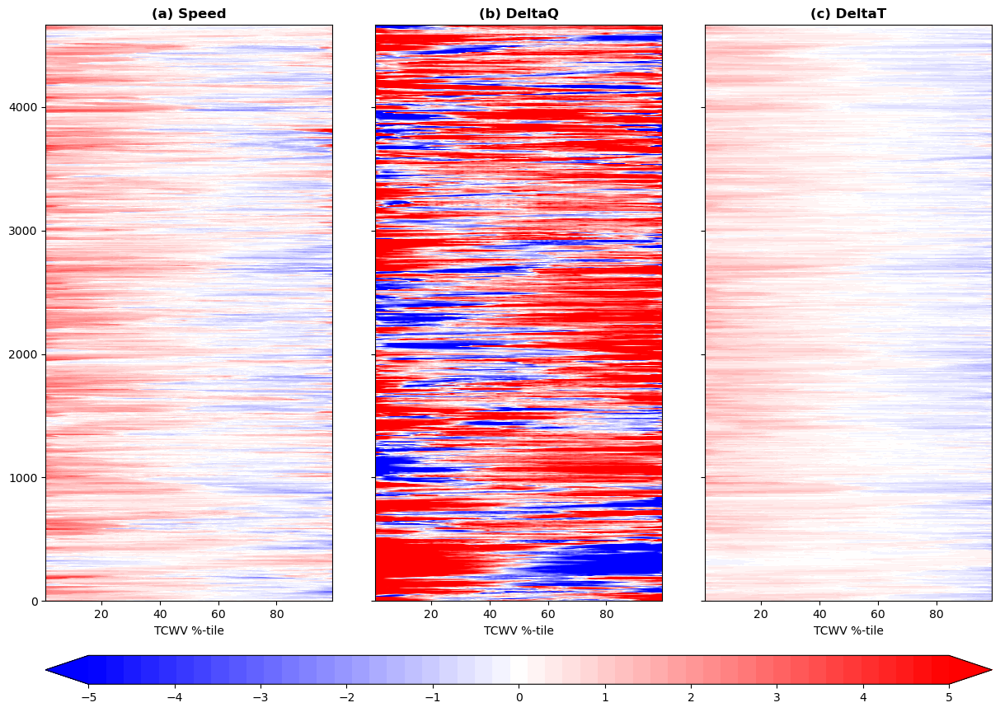

In [50]:
MAM_org_input_hov['DeltaQ'] = MAM_org_input_hov['DeltaQ']*10000
hov_plot_states(varis1,MAM_org_input_hovx,MAM_org_input_hov,'Organised_MAM_input',
                np.linspace(-5,5,50),np.arange(-5,5.1,1),[])

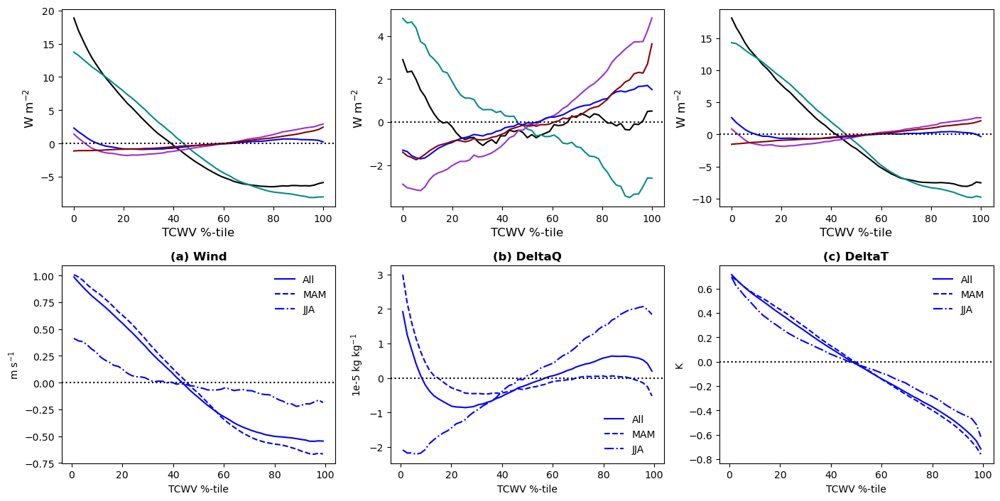

In [51]:
plt.figure(figsize=(16,8))
gs = gridspec.GridSpec(2,3, left=0.13, right=0.95, hspace=0.3, wspace=0.2, top=0.9, bottom=0.1)
ax=subplot(gs[0])
plot_means_line(varis,org_hov,nx,'Organised','')
ax=subplot(gs[1])
plot_means_line(varis,JJA_org_hov,nx,'Organised_JJA','')
ax=subplot(gs[2])
plot_means_line(varis,MAM_org_hov,nx,'Organised_MAM','')

variabs = ['Wind','DeltaQ','DeltaT']
ylabel = ['m s$^{-1}$','1e-5 kg kg$^{-1}$','K']
titles = ['(a) Wind','(b) DeltaQ','(c) DeltaT']
colors = ['blue','blue','blue']

for i,var in enumerate(variabs):
    ax=subplot(gs[i+3])
    plt.plot(org_input_hovx,np.mean(org_input_hov[var],axis=0), color = colors[i], 
             linestyle='-', label = 'All')
    plt.plot(MAM_org_input_hovx,np.mean(MAM_org_input_hov[var],axis=0), color = colors[i], 
             linestyle='--', label = 'MAM')
    plt.plot(JJA_org_input_hovx,np.mean(JJA_org_input_hov[var],axis=0), color = colors[i], 
             linestyle='-.', label = 'JJA')
    plt.xlabel('TCWV %-tile')
    plt.ylabel(ylabel[i])
    plt.title(titles[i], fontweight='bold')
    plt.legend(frameon=False)
    plt.axhline(0,linestyle=':', color = 'k')

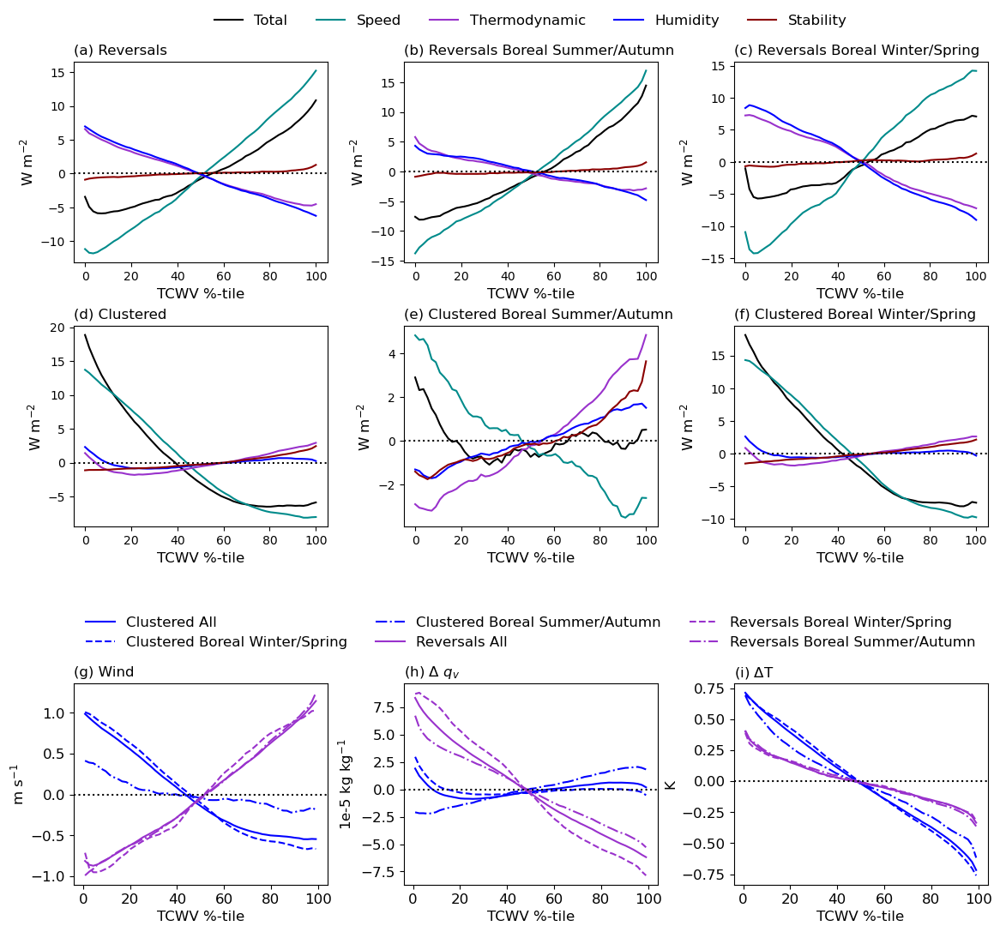

In [56]:
plt.figure(figsize=(13,12))
gs = gridspec.GridSpec(4,3, left=0.13, right=0.95, hspace=0.4, wspace=0.3, top=0.9, bottom=0.1, 
                       height_ratios = [1,1,0.15,1])
ax=subplot(gs[0])
plot_means_line(varis,rev_hov,nx,'Reversals', '(a) Reversals')
ax=subplot(gs[1])
plot_means_line(varis,JJA_rev_hov,nx,'Reversals_JJA', '(b) Reversals Boreal Summer/Autumn')
plt.legend(frameon=False, ncol = 5, loc = 'upper center', bbox_to_anchor = (0.5,1.3), fontsize = 12)
ax=subplot(gs[2])
plot_means_line(varis,MAM_rev_hov,nx,'Reversals_MAM','(c) Reversals Boreal Winter/Spring' )
ax=subplot(gs[3])
plot_means_line(varis,org_hov,nx,'Organised', '(d) Clustered')
ax=subplot(gs[4])
plot_means_line(varis,JJA_org_hov,nx,'Organised_JJA', '(e) Clustered Boreal Summer/Autumn')
ax=subplot(gs[5])
plot_means_line(varis,MAM_org_hov,nx,'Organised_MAM', '(f) Clustered Boreal Winter/Spring')

variabs = ['Wind','DeltaQ','DeltaT']
ylabel = ['m s$^{-1}$','1e-5 kg kg$^{-1}$','K']
titles = ['(g) Wind','(h) $\Delta$ $q_{v}$','(i) $\Delta$T']

for i,var in enumerate(variabs):
    ax=subplot(gs[i+9])
    plt.plot(org_input_hovx,np.mean(org_input_hov[var],axis=0), color = 'blue', 
             linestyle='-', label = 'Clustered All')
    plt.plot(MAM_org_input_hovx,np.mean(MAM_org_input_hov[var],axis=0), color = 'blue', 
             linestyle='--', label = 'Clustered Boreal Winter/Spring')
    plt.plot(JJA_org_input_hovx,np.mean(JJA_org_input_hov[var],axis=0), color = 'blue', 
             linestyle='-.', label = 'Clustered Boreal Summer/Autumn')
    plt.plot(rev_input_hovx,np.mean(rev_input_hov[var],axis=0), color = 'darkorchid', 
             linestyle='-', label = 'Reversals All')
    plt.plot(MAM_rev_input_hovx,np.mean(MAM_rev_input_hov[var],axis=0), color = 'darkorchid', 
             linestyle='--', label = 'Reversals Boreal Winter/Spring')
    plt.plot(JJA_rev_input_hovx,np.mean(JJA_rev_input_hov[var],axis=0), color = 'darkorchid', 
             linestyle='-.', label = 'Reversals Boreal Summer/Autumn')
    plt.xlabel('TCWV %-tile', fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.ylabel(ylabel[i], fontsize=12)
    plt.title(titles[i], loc ='left',fontsize=12)
    if i == 1:
        plt.legend(frameon=False, ncol=3, fontsize=12, bbox_to_anchor = (0.5,1.4), loc = 'upper center')
    plt.axhline(0,linestyle=':', color = 'k')
    
plt.savefig('SF_decomposition.jpg', bbox_inches = 'tight', dpi = 300)
plt.savefig('SF_decomposition.pdf', bbox_inches = 'tight', dpi = 300)

# Save results to files!

In [53]:
data_l = [JJA_hov,MAM_hov,rev_hov,JJA_rev_hov,MAM_rev_hov,org_hov,JJA_org_hov,MAM_org_hov]
names = ['SF_2017_JJA.nc','SF_2017_MAM.nc','SF_reversals.nc','SF_rev_JJA.nc','SF_rev_MAM.nc',
         'SF_organised.nc','SF_org_JJA.nc','SF_org_MAM.nc']

for i,data in enumerate(data_l):
    ds = SF_to_xarray(varis,data,names[i])

In [54]:
data_l = [JJA_input_hov,MAM_input_hov,rev_input_hov,JJA_rev_input_hov,MAM_rev_input_hov,
          org_input_hov,JJA_org_input_hov,MAM_org_input_hov]
names = ['SF_2017_JJA_input.nc','SF_2017_MAM_input.nc','SF_reversals_input.nc','SF_rev_JJA_input.nc',
         'SF_rev_MAM_input.nc','SF_organised_input.nc','SF_org_JJA_input.nc','SF_org_MAM_input.nc']

for i,data in enumerate(data_l):
    ds = SF_to_xarray(varis1,data,names[i])